# L101 Project - Timo Hromadka

## TODOS

- 3d animation of datamap moving
- plot datamap with colors corresponding to shift from the roberta/bert large superior counterpart (maybe 3 way compass shift?)
- generate plots of how the data poitns are shifting

## Current Datasets

ID: GLUE/QNLI
OOD: Adversarial Squad
Potential OOD: Rte, wnli

ID: SNLI
OOD: Glue Diagnostics
Potential OOD: MNLI, FEVER-NLI, ANLI

## Research Questions

- What OOD performance do we get across varying models and sizes (distil, base, large)
- How comparable are datamaps across different model sizes, and does this correlate with OOD performance?
- How comparable are datamaps across different model types (bert vs roberta)

## Installs

In [1]:
%matplotlib notebook
%matplotlib inline

In [ ]:
!pip install tensorflow
!pip install transformers
!pip install tavolo
!pip install matplotlib
!pip install seaborn
!pip install gensim
!pip install scikit-learn
!pip install tqdm
!pip install datasets

In [ ]:
# !pip install -q tfds-nightly

In [ ]:
!pip install --upgrade tensorflow-datasets


## Imports

In [ ]:
%load_ext autoreload
%autoreload 2

import re
import tempfile
from typing import Iterable, List, Optional, Tuple
import time
import json

import gensim.downloader as api
import numpy as np
import pandas as pd
import tensorflow_datasets as tfds
import tensorflow as tf
from datasets import load_dataset, Dataset
# import tavolo as tvl
from tensorflow.keras.models import load_model
from tensorflow.keras.metrics import Precision, Recall
import transformers
from tqdm import tqdm
from typing import TypedDict, List, Dict
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown
from scipy.special import softmax
from sklearn.metrics import adjusted_mutual_info_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree
from transformers import InputExample
from transformers import (
    AutoTokenizer,
    DistilBertTokenizer,
    RobertaTokenizerFast,
    RobertaTokenizer,
    BertTokenizerFast,
    BertTokenizer,
    AutoModelForSequenceClassification,
    TFRobertaForSequenceClassification,
    TFDistilBertModel,
    TFDistilBertForSequenceClassification,
    glue_convert_examples_to_features,
    TFAutoModelForSequenceClassification,
    TFBertForSequenceClassification,
    TFRobertaForSequenceClassification,
    TFMPNetForSequenceClassification,
    TFAlbertForSequenceClassification
)

import nltk
nltk.download('punkt')
from nltk.tokenize import sent_tokenize

In [ ]:
transformers.logging.set_verbosity_error()

In [ ]:
# Set plot style
sns.set_style('whitegrid')
sns.set_palette('Set2')

## Setup

- CUDA
- GDrive
- Keras Callback Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/Cambridge/L101')

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

## Keras Callback Setup

In [ ]:
from contextlib import suppress
import json
import math
import tempfile
from tqdm import tqdm
from typing import Optional, Callable, Tuple, List, Any

from datasets import Dataset as HFDataset
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

class DataMapCallback(tf.keras.callbacks.Callback):

    def __init__(self, dataset: tf.data.Dataset,
                 dataset_raw,
                 model_name: str,
                 dataset_name: str,
                 outputs_to_probabilities: Optional[Callable[[Any], tf.Tensor]] = None,
                 sparse_labels: bool = False,
                 gold_labels_probabilities = None,
                 tag=''):
        """

        :param dataset: Dataset. Usually, as the paper suggests, this is the training dataset. It should be:

             - Non-shuffled, so each iteration over the dataset should yield samples in the same order
             - Already batched, the ``.batch(n)`` method should already be applied on this dataset
             - Should yield batches of ``(features, labels)``, sample weights are not supported

        :param outputs_to_probabilities: Callable to convert model's output to probabilities. Use this if the model
            outputs logits, dictionary or any other form which is not a vector of probabilities.
        :param sparse_labels: Set to ``True`` if the labels are given as integers (not one hot encoded)
        """

        self._dataset = dataset
        self._dataset_raw = dataset_raw
        self._outputs2probabilities = outputs_to_probabilities
        self._sparse_labels = sparse_labels


        self._model_name = model_name
        self._dataset_name = dataset_name
        self._tag = tag
        self._correctness = []  # Initialize as an empty list
        self.correctness = None # this is the true correctness, one value for each datapoint

        # Stores the probabilities for the gold labels after each epoch,
        # e.g. self._gold_labels_probabilities[i] == gold label probabilities at the end of epoch i
        self._gold_labels_probabilities = gold_labels_probabilities

    # noinspection PyUnusedLocal
    def on_epoch_end(self, epoch, logs=None):
        print(f'\nEpoch has ended! Now calculating gold labels probabilities.\n')

        data_point_index = 0
        # Gather gold label probabilities over the dataset
        gold_label_probabilities = list()
        for x, y in self._dataset: # batched dataset
            probabilities = self.model.predict(x, verbose=0)

            # Convert outputs to probabilities if necessary
            if self._outputs2probabilities is not None:
                probabilities = self._outputs2probabilities(probabilities)

            # Convert to probabilities if labels are sparse, e.g. [1, 2] -> [[0, 1, 0], [0, 0, 1]]
            if self._sparse_labels:
                y = tf.one_hot(y, depth=probabilities.shape[-1])

            # Calculate correctness
            predicted_classes = np.argmax(probabilities, axis=1)
            actual_classes = np.argmax(y, axis=1)
            correctness = np.equal(predicted_classes, actual_classes).astype(int)

            for correct in correctness:
                if epoch == 0:
                    # For the first epoch, initialize correctness list for each data point
                    self._correctness.append([correct])
                else:
                    # For subsequent epochs, append correctness to existing lists
                    self._correctness[data_point_index].append(correct)
                data_point_index += 1

            # Extract the gold label probabilities from the predictions
            if tf.rank(tf.squeeze(y)) == 1:  # Labels binary e.g. y = [1, 0, 0, 1...], len(y) == batch_size
                # Squeeze to remove redundant dimensions
                probabilities, y = tf.squeeze(probabilities), tf.squeeze(y)

                batch_gold_label_probabilities = tf.where(y == 0, 1 - probabilities, probabilities)

            elif tf.rank(tf.squeeze(y)) == 2:  # One hot labels e.g. y = [[1,0,0], [0,1,0] ...], len(y == batch_size)
                # Verify labels are NOT multi-labels (e.g. [[1,0,1], [1,1,0], ...]
                if not tf.reduce_all(tf.reduce_sum(tf.cast(y == 1, tf.int32), axis=-1) == 1):
                    raise ValueError('DataMapCallback does not support multi-label classification')

                batch_gold_label_probabilities = tf.boolean_mask(probabilities, tf.cast(y, tf.bool)).numpy()
            else:
                raise ValueError(
                    'tf.squeeze(y) (y == labels from the dataset) must be of rank 1 for binary classification or '
                    '2 for multi class. Instead got ({})'.format(tf.rank(tf.squeeze(y))))

            # Gather gold label probabilities
            gold_label_probabilities = np.append(gold_label_probabilities, [batch_gold_label_probabilities])

        # Gather probabilities
        if self._gold_labels_probabilities is None:  # Happens only on first iteration
            self._gold_labels_probabilities = np.expand_dims(gold_label_probabilities, axis=-1)
        else:
            stack = [self._gold_labels_probabilities, np.expand_dims(gold_label_probabilities, axis=-1)]
            self._gold_labels_probabilities = np.hstack(stack)

        # calcuate true correctness
        mean_correctness = [np.mean(correct_list) for correct_list in self._correctness]
        self.correctness = np.array(mean_correctness)
        # SAVE TRAINING DYNAMICS AFTER EVERY EPOCH IN CASE OF MODEL/RESOURCE OUTAGE
        self.save_training_dynamics_to_json()

    def convert_numpy(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        elif isinstance(obj, bytes):
            return obj.decode('utf-8')
        else:
            return obj

    def save_training_dynamics_to_json(self):
        print(f'Saving training dynamics at the end of the epoch.')
        gold_label_probs = self.gold_labels_probabilities
        confidence = self.confidence
        variability = self.variability
        correctness = self.correctness
        forgetfulness = self.forgetfulness
        # For partial dataset training, track the count to limit when to stop looping over reference_set
        dataset_map_length = len(gold_label_probs)

        json_dict = {}

        dataset_iterator = self._dataset_raw if isinstance(self._dataset_raw, HFDataset) else tfds.as_numpy(self._dataset_raw)
        for i, example in enumerate(tqdm(dataset_iterator, desc='Saving training indexes along with training dynamics to json')):
            idx = self.convert_numpy(example["idx"])
            json_dict[idx] = {
                "gold_label_probs": self.convert_numpy(gold_label_probs[i]),
                "confidence": self.convert_numpy(confidence[i]),
                "variability": self.convert_numpy(variability[i]),
                "correctness": self.convert_numpy(correctness[i]),
                "forgetfulness": self.convert_numpy(forgetfulness[i]),
            }


            if i == (dataset_map_length-1):
                break

        # Create directory if it does not exist
        directory_path = os.path.join('training_dynamics', self._dataset_name, self._tag)
        if not os.path.exists(directory_path):
            os.makedirs(directory_path)

        json_file_name = os.path.join(directory_path, self._model_name + '.json')
        print(f'\nSaving training dynamics to {json_file_name}.')
        with open(json_file_name, 'w') as file:
            json.dump(json_dict, file)


    @property
    def gold_labels_probabilities(self) -> np.ndarray:
        """
        Gold label predicted probabilities. With the shape of ``(n_samples, n_epochs)`` and ``(i, j)`` is the
        probability of the gold label for sample ``i`` at epoch ``j``

        :return: Gold label probabilities
        """

        return self._gold_labels_probabilities

    @property
    def confidence(self) -> np.ndarray:
        """
        Mean of true label probability across epochs

        :return: Confidence
        """
        if self._gold_labels_probabilities is None:
            return None
        return np.mean(self._gold_labels_probabilities, axis=-1)

    @property
    def variability(self) -> np.ndarray:
        """
        Standard deviation of true label probability across epochs

        :return: Variability
        """
        if self._gold_labels_probabilities is None:
            return None
        return np.std(self._gold_labels_probabilities, axis=-1)


    @property
    def forgetfulness(self) -> np.ndarray:
        """
        Slope of true label probability across epochs, indicating 'forgetfulness'

        :return: Forgetfulness (slope)
        """
        if self._gold_labels_probabilities is None:
            return None
        # epochs is num columns in _gold_labels_probabilities
        epochs = np.arange(self._gold_labels_probabilities.shape[1])

        # Function to calculate slope for each data point
        def calculate_slope(y_values):
            if len(y_values) == 1: # slope can't be calculated...just return 0
                return 0
            # Linear regression: y = mx + b
            # Slope (m) is what we're interested in
            m, _ = np.polyfit(epochs, y_values, 1)
            return m

        # Apply to each data point
        return np.apply_along_axis(calculate_slope, 1, self._gold_labels_probabilities)

## Utils functions for Training

In [ ]:
def prepare_data_lists(input_examples):
    idx_list = []
    question_list = []
    sentence_list = []
    label_list = []

    for example in input_examples:
        idx_list.append(example.guid)
        question_list.append(example.text_a)
        sentence_list.append(example.text_b)
        label_list.append(int(example.label))

    return idx_list, question_list, sentence_list, label_list


def convert_to_qnli_format(data):
    qnli_style_data = []
    # 1. Transforming from adversarial_squad format into QNLI format
    for item in tqdm(data):
        context = item['context']
        question = item['question']
        sentences = sent_tokenize(context)

        if '-high-conf-turk' in item['id']:
            # Adversarial Sentence
            mislead_sentence = sentences[-1]
            qnli_style_data.append({'idx': item['id'], 'label': 1, 'question': question, 'sentence': mislead_sentence})
        else:
            # Non-Adversarial Sentence
            answer_start = item['answers']['answer_start'][0]
            correct_sentence = next(s for s in sentences if context.find(s) <= answer_start < context.find(s) + len(s))
            qnli_style_data.append({'idx': item['id'], 'label': 0, 'question': question, 'sentence': correct_sentence})

    # 2. Creating a HuggingFace InputExample object for each sample
    input_examples = [InputExample(guid=sample['idx'],
                                   text_a=sample['question'],
                                   text_b=sample['sentence'],
                                   label=str(sample['label']))
                      for sample in qnli_style_data]

    # 3. Prepare separate lists for each field
    idx_list, question_list, sentence_list, label_list = prepare_data_lists(input_examples)

    # 4. Create a TensorFlow dataset
    return tf.data.Dataset.from_tensor_slices({
        'idx': idx_list,
        'question': question_list,
        'sentence': sentence_list,
        'label': label_list
    })


def get_samples_by_index(dataset: tf.data.Dataset, indices: List[int]) -> List[dict]:
    """
    Get samples by their index

    :param dataset:
    :param indices:
    :return:
    """

    # Convert to tensor
    indices_ = tf.convert_to_tensor(indices, dtype=tf.int32)

    samples = list()
    for sample in dataset.filter(lambda x: tf.reduce_any(tf.equal(x['idx'], indices_))).as_numpy_iterator():
        sample['question'], sample['sentence'] = sample['question'].decode(), sample['sentence'].decode()
        samples.append(sample)

        # Early stop
        if len(samples) == len(indices):
            break

    return samples

class InnerDict(TypedDict):
    gold_label_probs: List[float]
    confidence: float
    variability: float
    correctness: float
    forgetfulness: float

TrainingDynamicsDictType = Dict[str, InnerDict]

def get_training_dynamics_by_index(training_dynamics: TrainingDynamicsDictType, indices: List[int]) -> TrainingDynamicsDictType:
    return {k: v for k, v in training_dynamics.items() if int(k) in indices}

def get_samples_and_training_dynamics_by_index(dataset: tf.data.Dataset, training_dynamics: TrainingDynamicsDictType, indices: List[int]):
    return get_samples_by_index(dataset, indices), get_training_dynamics_by_index(training_dynamics, indices)

def save_training_dynamics(tdc_map, reference_set):
    gold_label_probs = tdc_map.gold_labels_probabilities
    confidence = tdc_map.confidence
    variability = tdc_map.variability
    correctness = tdc_map.correctness
    forgetfulness = tdc_map.forgetfulness
    # For partial dataset training, track the count to limit when to stop looping over reference_set
    dataset_map_length = len(gold_label_probs)

    # MUST MAKE ABSOLUTE SURE
    json_dict = {}
    for i, example in enumerate(tqdm(tfds.as_numpy(reference_set), desc='Saving training default dataset to json')):
        idx = convert_numpy(example["idx"])
        json_dict[idx] = {
            "gold_label_probs": convert_numpy(gold_label_probs[i]),
            "confidence": confidence[i],
            "variability": variability[i],
            "correctness": correctness[i],
            "forgetfulness": forgetfulness[i],
        }

        if i == (dataset_map_length-1):
            break

    # with open(f'training_dynamics/{tag}.json', 'w') as file:
    #     # Dump the list of dictionaries to the file
    #     json.dump(json_dict, file)

    # Create directory if it does not exist
    directory_path = f'training_dynamics/{tdc_map._dataset_name}'
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)

    json_file_name = f'{directory_path}/{tdc_map._model_name}.json'
    print(f'\nSaving training dynamics to {json_file_name}.')
    with open(json_file_name, 'w') as file:
        json.dump(json_dict, file)


def pretty_print_samples(samples: List[dict], title: Optional[str]):
    """
    Print samples as Markdown

    :param samples: Samples to print
    :param title: Title
    :return:
    """

    # Convert samples to markdown
    samples_as_markdown = list()
    for sample in samples:
        samples_as_markdown.append(f"""
 - **Question**: {sample['question']}

   **Sentence**: {sample['sentence']}

   **Label**: {'True' if sample['label'] == 0 else 'False'}


""")
    samples_as_markdown = "\n".join(samples_as_markdown)

    markdown_output = f"""
### {title}
{samples_as_markdown}
"""

    display(Markdown(markdown_output))

def convert_numpy(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, bytes):
        return obj.decode('utf-8')
    else:
        return obj

def extract_by_training_dynamics(datamap: np.ndarray,
                                 n_ambiguous: int = 0,
                                 n_easy2learn: int = 0,
                                 n_hard2learn: int = 0) -> Tuple[list, list, list]:
    """
    Extract indices of different types of samples

    :param datamap: Datamap
    :param n_ambiguous: Number of ambiguous samples to extract
    :param n_easy2learn: Number of easy-to-learn samples to extract
    :param n_hard2learn: Number of hard-to-learn samples to extract
    :return: Three lists of ambiguous, easy-to-learn and hard-to-learn indices
    """

    kdt = KDTree(datamap, metric='euclidean')
    ambiguous = list()
    easy2learn = list()
    hard2learn = list()

    if n_easy2learn:
        _, easy2learn = kdt.query([[0, 1]],
                                  k=n_easy2learn)

    if n_ambiguous:
        _, ambiguous = kdt.query([[1, 0.5]],
                                 k=n_ambiguous)

    if n_hard2learn:
        _, hard2learn = kdt.query([[0, 0]],
                                  k=n_hard2learn)

    return list(ambiguous[0]), list(easy2learn[0]), list(hard2learn[0])

def load_training_dynamics_from_json(path_to_json):
    with open(path_to_json, 'r') as file:
        training_dynamics_dict = json.load(file)

    indexes = []
    gold_labels_probabilities = []
    confidences = []
    variabilities = []
    correctnesses = []
    forgetfulnesses = []

    for idx, td_dict in tqdm(training_dynamics_dict.items(), desc=f'Fetching training dynamics from saved json file: {path_to_json}'):
        indexes.append(int(idx))
        gold_labels_probabilities.append(td_dict['gold_label_probs'])
        confidences.append(td_dict['confidence'])
        variabilities.append(td_dict['variability'])
        correctnesses.append(td_dict['correctness'])
        forgetfulnesses.append(td_dict['forgetfulness'])


    gold_labels_probabilities = np.array(gold_labels_probabilities)

    return gold_labels_probabilities, confidences, variabilities, correctnesses, forgetfulnesses, indexes, training_dynamics_dict


def convert_from_hf_to_tf_dataset(hf_dataset):
    # Convert Hugging Face dataset to TensorFlow dataset
    features = {key: hf_dataset[key] for key in hf_dataset.features}
    return tf.data.Dataset.from_tensor_slices(features)


def get_datasets(dataset_name, train_subset_indices=None, additional_subset=None, ):
    print(f'Fetching dataset: {dataset_name}')
    train_unshuffled = None
    train = None
    validation = None
    test = None

    # def filter_fn(data):
    #     # Assuming that the dataset has a field named 'idx' for indices
    #     return tf.reduce_any(tf.equal(train_subset_indices, data['idx']))

    def filter_fn(data):
        # Cast train_subset_indices to the same type as data['idx']
        casted_indices = tf.cast(train_subset_indices, data['idx'].dtype)
        return tf.reduce_any(tf.equal(casted_indices, data['idx']))


    def add_idx_to_dataset(dataset):
        # Enumerate over the dataset to add the idx field
        if isinstance(dataset, HFDataset):
            def add_idx(example, idx):
                return {'idx': idx, **example}

            # Use map with with_indices=True for Arrow datasets
            return dataset.map(add_idx, with_indices=True)

        return dataset.enumerate().map(lambda idx, datapoint: {'idx': idx, **datapoint}, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    if dataset_name == 'glue/qnli':
        train_unshuffled = tfds.load(dataset_name, split='train', shuffle_files=False, try_gcs=False)
        train = tfds.load(dataset_name, split='train', shuffle_files=True)
        validation_ = tfds.load(dataset_name, split='validation', shuffle_files=True)

        # using sharded validation set
        validation = validation_.shard(2, index=0)  # Split validation into test and validation
        test = validation_.shard(2, index=1)

    elif dataset_name == 'multi_nli':
        if additional_subset is None:
            validation_matched = tfds.load(dataset_name, split='validation_matched', shuffle_files=False, try_gcs=False)
            validation_unmatched = tfds.load(dataset_name, split='validation_mismatched', shuffle_files=False, try_gcs=False)
            validation = validation_matched.concatenate(validation_unmatched)
        elif additional_subset == 'matched':
            validation = validation_matched
        elif additional_subset == 'mismatched':
            validation = validation_unmatched

    elif dataset_name == 'glue/rte':
        test = train_unshuffled = tfds.load(dataset_name, split='test', shuffle_files=False, try_gcs=False)

    elif dataset_name == 'adversarial_squad':
        # https://huggingface.co/datasets/squad_adversarial
        squad_adversarial_addsent = load_dataset("squad_adversarial", "AddSent")
        squad_adversarial_addsent = squad_adversarial_addsent['validation']
        squad_adversarial_addsent = add_idx_to_dataset(squad_adversarial_addsent)

        # assign each partition the same...for this dataset we don't care about true training, just calculating training dynamics
        train_unshuffled = squad_adversarial_addsent
        train = squad_adversarial_addsent
        validation = squad_adversarial_addsent
        test = squad_adversarial_addsent


    elif dataset_name == 'glue_diagnostics':
        # download from pietrolesci huggingface
        test = load_dataset("pietrolesci/glue_diagnostics")['test']
        test = convert_from_hf_to_tf_dataset(test)
        test = add_idx_to_dataset(test)

        def filter_lex(item):
            return tf.not_equal(item['lexical semantics'], tf.constant(b'', dtype=tf.string))

        def filter_pas(item):
            return tf.not_equal(item['predicate-argument structure'], tf.constant(b'', dtype=tf.string))

        def filter_log(item):
            return tf.not_equal(item['logic'], tf.constant(b'', dtype=tf.string))

        def filter_kno(item):
            return tf.not_equal(item['knowledge'], tf.constant(b'', dtype=tf.string))

        # Apply the filter based on the additional_subset
        if additional_subset == 'lex':
            test = test.filter(filter_lex)
        elif additional_subset == 'pas':
            test = test.filter(filter_pas)
        elif additional_subset == 'log':
            test = test.filter(filter_log)
        elif additional_subset == 'kno':
            test = test.filter(filter_kno)

        # assign each partition the same...for this dataset we don't care about true training, just calculating training dynamics
        train_unshuffled = test
        train = test
        validation = test
        test = test


    elif dataset_name == 'winogrande':
        train_unshuffled = tfds.load(dataset_name, split='train_l', shuffle_files=False, try_gcs=False)
        train = tfds.load(dataset_name, split='train_l', shuffle_files=True)
        validation = tfds.load(dataset_name, split='validation', shuffle_files=True)
        test = tfds.load(dataset_name, split='test', shuffle_files=False)

    elif dataset_name == 'snli':
        # remove data points with:
        # - empty premise
        # - empty hypothesis
        # - label of -1 (no consensus)
        def filter_snli(data):
            def filter_fn(d):
                # Check if premise and hypothesis are not empty strings and label is not -1
                premise_non_empty = tf.not_equal(d['premise'], tf.constant(b'', dtype=tf.string))
                hypothesis_non_empty = tf.not_equal(d['hypothesis'], tf.constant(b'', dtype=tf.string))
                label_not_negative_one = tf.not_equal(d['label'], tf.constant(-1, dtype=tf.int64))

                return tf.logical_and(tf.logical_and(premise_non_empty, hypothesis_non_empty), label_not_negative_one)

            # Apply the filter function to the dataset
            filtered_data = data.filter(filter_fn)
            return filtered_data

        train_unshuffled = tfds.load('snli', split='train', shuffle_files=False, try_gcs=False)
        train = tfds.load('snli', split='train', shuffle_files=True)
        validation = tfds.load('snli', split='validation', shuffle_files=True)
        test = tfds.load('snli', split='test', shuffle_files=False)
        print(f'type of train_unshuffled is: {type(train_unshuffled)}')
        print(f'type of test is: {type(test)}')

        train_unshuffled = filter_snli(train_unshuffled)
        train = filter_snli(train)
        validation = filter_snli(validation)
        test = filter_snli(test)
        print(f'type of train_unshuffled is: {type(train_unshuffled)}')
        print(f'type of test is: {type(test)}')

        train_unshuffled = add_idx_to_dataset(train_unshuffled)
        train = add_idx_to_dataset(train)
        validation = add_idx_to_dataset(validation)
        test = add_idx_to_dataset(test)
        print(f'type of train_unshuffled is: {type(train_unshuffled)}')
        print(f'type of test is: {type(test)}')



    elif dataset_name == 'wsc':
        validation = tfds.load('super_glue/wsc.fixed', split='validation', shuffle_files=True)

    if train_subset_indices:
        # filter with only correct indices
        train_unshuffled = train_unshuffled.filter(filter_fn)
        train = train.filter(filter_fn)
    return train_unshuffled, train, validation, test

def take_samples(dataset, n):
    """
    Takes n samples from the dataset.
    Works for both TensorFlow's _ShardDataset and Hugging Face's Dataset.
    """
    print(type(dataset))
    if isinstance(dataset, tf.data.Dataset):
        # TensorFlow dataset
        return dataset.take(n)
    elif isinstance(dataset, Dataset):
        # Hugging Face Arrow dataset
        return dataset.select(range(n))
    else:
        raise TypeError("Unsupported dataset type")

def convert_dataset(dataset, tokenizer, task_name):
    sample_amount = 2
    print(type(dataset))
    sample_data = take_samples(dataset, sample_amount)
    print(f'Printing {sample_amount} examples from dataset: {dataset}')
    for i, sample in enumerate(sample_data):
        print(f"Sample {i+1}: {sample}")

    print(f'Converting examples to features.')
    start = time.time()
    # ================================
    # SNLI
    # ================================
    if task_name in ['snli', 'glue_diagnostics', 'multi_nli']:
        def preprocess_and_tokenize(dataset, tokenizer):
            tokenized_data = []
            labels = []

            for example in dataset:
                premise = example['premise'].numpy().decode('utf-8')
                hypothesis = example['hypothesis'].numpy().decode('utf-8')
                concatenated_sentence = "<s> " + premise + " </s></s> " + hypothesis + " </s>"

                # Tokenizing the concatenated sentence
                tokenized_example = tokenizer(concatenated_sentence,
                                            padding='max_length',
                                            truncation=True,
                                            max_length=128,
                                            return_tensors='tf')
                tokenized_data.append(tokenized_example)

                # Assuming the label is in example['label']
                labels.append(example['label'].numpy())

            return tokenized_data, labels

        def create_tf_dataset(tokenized_data, labels):
            input_ids = tf.constant([item['input_ids'].numpy()[0] for item in tokenized_data])
            attention_mask = tf.constant([item['attention_mask'].numpy()[0] for item in tokenized_data])

            dataset = tf.data.Dataset.from_tensor_slices(({"input_ids": input_ids, "attention_mask": attention_mask}, labels))
            return dataset


        tokenized_snli_data, labels = preprocess_and_tokenize(dataset, tokenizer)
        dataset = create_tf_dataset(tokenized_snli_data, labels)
    # ================================
    # GLUE/QNLI
    # ================================
    elif task_name == 'glue/qnli':
        # max_len=128 and task='qnli'
        dataset = glue_convert_examples_to_features(dataset, tokenizer, max_length=128, task='qnli')
    # ================================
    # Adversarial Squad
    # ================================
    elif task_name == 'adversarial_squad':
        converted_dataset = convert_to_qnli_format(dataset)

        # once data is in qnli format, we can simply use the same conversion
        dataset = glue_convert_examples_to_features(converted_dataset, tokenizer, max_length=128, task='qnli')
    # ================================
    # WinoGrande and WSC (Winograd Schema Challenge)
    # ================================
    elif task_name in ['winogrande', 'wsc']:
        print(f'Converting {task_name} dataset. Length of dataset: {len(dataset)}')
        start = time.time()

        def convert_example_to_feature(example):
            # Convert each example to the appropriate format
            # This will depend on the structure of the dataset and the task
            # For example, you might need to format the text into a cloze-style format
            # and encode it using the tokenizer

            # Example conversion (please modify as per actual dataset format):
            text = example['sentence'] if task_name == 'wsc' else example['text']
            encoding = tokenizer.encode_plus(
                text,
                add_special_tokens=True,
                max_length=128,
                return_token_type_ids=False,
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='tf',
            )
            return {'input_ids': encoding['input_ids'],
                    'attention_mask': encoding['attention_mask']}, example['label']

        dataset = dataset.map(convert_example_to_feature, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    print(f"Time taken: {time.time() - start:.2f} seconds")
    return dataset

def get_model(model_name, dataset_name):
    print(f'Loading pre-trained model.')

    num_labels = 2 if dataset_name in ['glue/qnli', 'adversarial_squad', 'winogrande', 'wsc'] else 3
    problem_type="multi_label_classification" if num_labels == 3 else 'single_label_classification'
    print(f'Number of labels for dataset {dataset_name} is: {num_labels}')

    if 'test' in model_name:
        model = TFDistilBertForSequenceClassification.from_pretrained('roberta-base', num_labels=num_labels)
    elif model_name == 'distilbert-base-cased':
        model = TFDistilBertForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
    elif model_name == 'bert-base-cased':
        model = TFBertForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
    elif model_name == 'bert-large-cased':
        model = TFBertForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
    elif model_name == 'distilroberta-base':
        # model = TFRobertaForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
        model = TFRobertaForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
    elif model_name == 'roberta-base':
        model = TFRobertaForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
    elif model_name == 'roberta-large':
        model = TFAutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels)
    elif model_name == 'mpnet-base':
        model = TFMPNetForSequenceClassification.from_pretrained('microsoft/mpnet-base', num_labels=num_labels)
    elif model_name == 'mpnet-large':
        model = TFMPNetForSequenceClassification.from_pretrained('microsoft/mpnet-large', num_labels=num_labels)
    elif model_name == 'albert-base':
        model = TFAlbertForSequenceClassification.from_pretrained('albert-base-v2', num_labels=num_labels)
    elif model_name == 'albert-large':
        model = TFAlbertForSequenceClassification.from_pretrained('albert-large-v2', num_labels=num_labels)
    else:
        raise ValueError("Model not supported")

    return model

def get_tokenizer(model_name):
    print(f'Fetching tokenizer for: {model_name}')
    if 'test' in model_name:
        tokenizer = AutoTokenizer.from_pretrained('roberta-base')
    else:
        if model_name == 'albert-base':
            model_name = 'albert-base-v2'
        elif model_name == 'albert-large':
            model_name = 'albert-large-v2'
        elif model_name == 'mpnet-base':
            model_name = 'microsoft/mpnet-base'
        elif model_name == 'mpnet-large':
            model_name = 'microsoft/mpnet-large'
        tokenizer = AutoTokenizer.from_pretrained(model_name)
    print(f'Tokenizer loaded: {tokenizer}.')
    return tokenizer


def batch_dataset(dataset, batch_size):
    print(f'Batching dataset.')
    return dataset.batch(batch_size).prefetch(1)


def get_dataset_map(train_unshuffled, train_unshuffled_raw, model_name, dataset_name, batch_size, gold_labels_probabilities=None, tag=''):
    print(f'Initializing DataMapCallback.')
    return DataMapCallback(train_unshuffled.batch(batch_size),
                           train_unshuffled_raw,
                           model_name,
                           dataset_name,
                           outputs_to_probabilities=lambda x: tf.nn.softmax(x[0]), # Model outputs a tuple, where the logits are at the first index
                           sparse_labels=True,
                           gold_labels_probabilities=gold_labels_probabilities,
                           tag=tag)

class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1_score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision = Precision()
        self.recall = Recall()
        self.f1_score = self.add_weight(name='f1', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)
        p = self.precision.result()
        r = self.recall.result()
        self.f1_score.assign(2 * ((p * r) / (p + r + tf.keras.backend.epsilon())))

    def result(self):
        return self.f1_score

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()
        self.f1_score.assign(0)

def f1_metric(y_true, y_pred):
    print(f'shape of y_true is: {y_true.shape}')
    print(f'shape of y_pred is: {y_pred.shape}')
    print(f'y_true is: {y_true}')
    print(f'y_pred is: {y_pred}')
    precision = Precision()
    recall = Recall()
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * ((p * r) / (p + r + 1e-7))

def initialize_model(model, model_dir, model_name, already_trained=False, epoch_to_load=1):
    # Check if the directory exists, if not, create it
    if not os.path.exists(model_dir):
        print(f'Creating directory for model: {model_dir}')
        os.makedirs(model_dir)

    if model_name == 'roberta-large':
        learning_rate = 5e-6
    elif model_name == 'bert-large-cased':
        learning_rate = 5e-6
    else:
        learning_rate = 3e-5

    # if model has already been trained
    if already_trained and os.listdir(model_dir):
        print(os.listdir(model_dir))
        print(f'Initializing model from SAVED DIRECTORY.')

        checkpoint_path = os.path.join(model_dir, str(epoch_to_load))
        # Load the weights
        model.load_weights(checkpoint_path)

        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
        loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        model.compile(optimizer=optimizer,
                      loss=loss,
                      #metrics=['accuracy', Precision(), Recall(), f1_metric]
                      metrics=['accuracy']
        )

        # gold_labels_probabilities, _, _, _, _ = load_training_dynamics_from_json(TRAINING_DYNAMICS_FILE)

    else:
        print(f'No model previously trained for {model_name}. Initializing a new one.')

        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
        loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        print(f'type of model is: {model}')
        model.compile(optimizer=optimizer,
                      loss=loss,
                      # metrics=['accuracy', Precision(), Recall(), f1_metric]
                      metrics=['accuracy']
                      # metrics=['accuracy', Precision(), Recall(), F1Score()])
        )


    return model

def evaluate_model_on_test_set(model_dir, model_name, epoch_to_load, dataset_name, test_amount=None, test_batch_size=128):
    """
    Sample usage:

    results_dict = evaluate_model_on_test_set(
        bert_large_qnli_hparams['MODEL_DIR'],
        bert_large_qnli_hparams['MODEL_NAME'],
        bert_large_qnli_hparams['EPOCH_TO_LOAD'],
        bert_large_qnli_hparams['DATASET_NAME'],
        test_amount=bert_large_qnli_hparams['TEST_AMOUNT'],
        test_batch_size=bert_large_qnli_hparams['TEST_BATCH_SIZE']
    )

    """
    # =========================================
    # FETCH MODEL AND LOAD FROM CHECKPOINT
    # =========================================
    pretrained_model = get_model(model_name)
    model = initialize_model(pretrained_model, model_dir, model_name, already_trained=True, epoch_to_load=epoch_to_load)
    tokenizer = get_tokenizer(model_name)

    # =========================================
    # GET TEST SET
    # =========================================
    if dataset_name in ['adversarial_squad', 'wsc']:
        _, _, test_raw, _ = get_datasets(dataset_name)
    else:
        _, _, _, test_raw = get_datasets(dataset_name)

    if test_amount:
        test = convert_dataset(take_samples(test_raw, test_amount), tokenizer, dataset_name)
    else:
        test = convert_dataset(test_raw, tokenizer, dataset_name)

    test_batched = batch_dataset(test, test_batch_size)
    # =========================================
    # PREDICT AND GET TRUE LABELS
    # =========================================
    predicted_labels = []
    true_labels = []

    print('Predicting on batches from batched test set.')
    for batch in test_batched:
        batch_predictions = model.predict(batch[0])
        probabilities = softmax(batch_predictions.logits, axis=1)
        batch_predicted_labels = np.argmax(probabilities, axis=1)

        predicted_labels.extend(batch_predicted_labels)

        labels = batch[1].numpy()
        true_labels.extend(labels)

    predicted_labels = np.array(predicted_labels)
    true_labels = np.array(true_labels)

    # =========================================
    # CALCULATE METRICS
    # =========================================
    accuracy = accuracy_score(true_labels, predicted_labels)
    precision = precision_score(true_labels, predicted_labels)
    recall = recall_score(true_labels, predicted_labels)
    f1 = f1_score(true_labels, predicted_labels)

    results_dict = {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

    return results_dict


def plot_datamap(
        var1, # x axis
        var2, # y axis
        var3, # (z axis)
        var1_name='variability',
        var2_name='confidence',
        var3_name='correctness',
        dataset_name='glue/qnli',
        model_name='distilbert-base-cased',
        subdir='',
        tag='All Samples',
    ):

    # Adjusting the layout to match the provided example
    graph_title = f"Data map for {dataset_name.upper()}, based on {model_name}. {tag}. Variables: {var1_name}, {var2_name}, {var3_name}"

    # Creating a new figure with a 3x4 grid
    fig = plt.figure(figsize=(15, 10))
    gs = fig.add_gridspec(3, 4)

    # Main scatter plot with KDE will occupy the first 3x3 grid
    ax_main = fig.add_subplot(gs[:, :3])
    sns.scatterplot(x=var1, y=var2, hue=var3, palette="coolwarm", s=15, legend='auto', ax=ax_main, edgecolor='none', alpha=1)
    sns.kdeplot(x=var1, y=var2,
                levels=8, color=sns.color_palette("Paired")[7], linewidths=0.7, ax=ax_main)

    ax_main.set(title=graph_title,
                xlabel=var1_name, ylabel=var2_name,
                #xlim=(-0.005, 0.505), ylim=(-0.005, 1.005)
                )

    # Annotations
    box_style = {'boxstyle': 'round', 'facecolor': 'white', 'ec': 'black'}
    ax_main.text(0.14, 0.84, 'easy-to-learn', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.text(0.75, 0.5, 'ambiguous', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.text(0.14, 0.14, 'hard-to-learn', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.legend(title=var3_name)

    # Confidence distribution plot will occupy the top-right grid
    ax_confidence = fig.add_subplot(gs[0, 3])
    sns.histplot(var1, bins=10, ax=ax_confidence, color='indigo')
    ax_confidence.set(title=f'{var1_name} distribution')

    # Variability distribution plot will occupy the middle-right grid
    ax_variability = fig.add_subplot(gs[1, 3])
    sns.histplot(var2, bins=10, ax=ax_variability, color='teal')
    ax_variability.set(title=f'{var2_name} distribution')

    # Correctness/Forgetfulness distribution plot will occupy the bottom-right grid
    ax_correctness = fig.add_subplot(gs[2, 3])
    sns.histplot(var3, bins=10, ax=ax_correctness, color='mediumseagreen')
    ax_correctness.set(title=f'{var3_name} distribution')

    # Adjusting layout and saving the figure
    plt.tight_layout()

    # Saving figure
    output_dir = os.path.join('images', dataset_name, subdir) # if subdir is '', then no subdir created
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    graph_save_name = f"datamap_{tag}_{model_name}_v1{var1_name}_v2{var2_name}_v3{var3_name}"
    image_save_file = os.path.join(output_dir, graph_save_name)
    plt.savefig(image_save_file)

    return fig


def get_data_subset(
        indexes,
        variability,
        confidence,
        correctness,
        forgetfulness,

        p_easytolearn=0.0,
        p_ambiguous=0.0,
        p_hardtolearn=0.0,

        p_random=0.0,

        p_variability=0.0,
        selector_variability='top',
        p_confidence=0.0,
        selector_confidence='top',
        p_correctness=0.0,
        selector_correctness='top',
        p_forgetfulness=0.0,
        selector_forgetfulness='top'):
    """
    Function to select subsets of data based on various criteria.
    """
    print('Fetching indices of specified training dynamics subset.')

    length = len(indexes)
    coordinates = np.hstack([np.expand_dims(variability, -1), np.expand_dims(confidence, -1)])
    selected_indices = set()

    # Handling KNN based selectors
    if p_easytolearn or p_ambiguous or p_hardtolearn:
        kdt = KDTree(coordinates, metric='euclidean')
        if p_ambiguous:
            n_ambiguous = int(p_ambiguous * length)
            _, ambiguous_idx = kdt.query([[1, 0.5]], k=n_ambiguous)
            selected_indices.update(indexes[i] for i in ambiguous_idx.flatten())
        if p_easytolearn:
            n_easytolearn = int(p_easytolearn * length)
            _, easy2learn_idx = kdt.query([[0, 1]], k=n_easytolearn)
            selected_indices.update(indexes[i] for i in easy2learn_idx.flatten())
        if p_hardtolearn:
            n_hardtolearn = int(p_hardtolearn * length)
            _, hardtolearn_idx = kdt.query([[0, 0]], k=n_hardtolearn)
            selected_indices.update(indexes[i] for i in hardtolearn_idx.flatten())
        return list(selected_indices)

    # Handling random selection
    if p_random > 0:
        n_random = int(p_random * length)
        random_indices = np.random.choice(indexes, n_random, replace=False)
        selected_indices.update(random_indices)
        return list(selected_indices)

    # Helper function for variability, confidence, correctness, forgetfulness
    def select_top_or_bottom(data, p_value, selector, indexes):
        if p_value > 0:
            n_select = int(p_value * length)
            sorted_idx = np.argsort(data)
            if selector == 'top':
                selected = sorted_idx[-n_select:]
            else:  # bottom
                selected = sorted_idx[:n_select]
            return set(indexes[i] for i in selected)
        return set()

    # Selecting based on variability, confidence, correctness, forgetfulness
    selected_indices.update(select_top_or_bottom(variability, p_variability, selector_variability, indexes))
    selected_indices.update(select_top_or_bottom(confidence, p_confidence, selector_confidence, indexes))
    selected_indices.update(select_top_or_bottom(correctness, p_correctness, selector_correctness, indexes))
    selected_indices.update(select_top_or_bottom(forgetfulness, p_forgetfulness, selector_forgetfulness, indexes))

    return list(selected_indices)

In [ ]:
def setup_model_directories_and_seed(hparams):
    # Setting up model directory
    model_dir = os.path.join('models', hparams['DATASET_NAME'], hparams['SUBSET_TAG'], hparams['MODEL_NAME'])
    hparams['MODEL_DIR'] = model_dir

    # Setting up training dynamics file path
    training_dynamics_dir = os.path.join('training_dynamics', hparams['DATASET_NAME'], hparams['SUBSET_TAG'], hparams['MODEL_NAME'])
    hparams['TRAINING_DYNAMICS_FILE'] = training_dynamics_dir

    # Setting the seed
    if 'SEED_VALUE' in hparams:
        tf.random.set_seed(hparams['SEED_VALUE'])

In [ ]:
def run_datamap_training(hparams, train_subset_indices=None, calculate_training_dynamics=True, monitor_loss=True):
    # =======================================
    # PREPARE DATA
    # - fetching dataset
    # - converting using tokenizer
    # - batching
    # =======================================
    #
    # if specified, use subset_indices to filter out which
    train_unshuffled_raw, train_raw, validation_raw, test_raw = get_datasets(hparams['DATASET_NAME'], train_subset_indices=train_subset_indices)

    tokenizer = get_tokenizer(hparams['MODEL_NAME'])

    if hparams['TRAIN_AMOUNT']:
        train_amount = hparams['TRAIN_AMOUNT']
        train = convert_dataset(take_samples(train_raw, train_amount), tokenizer, hparams['DATASET_NAME'])
        train_unshuffled = convert_dataset(take_samples(train_unshuffled_raw, train_amount), tokenizer, hparams['DATASET_NAME'])
    else:
        train = convert_dataset(train_raw, tokenizer, hparams['DATASET_NAME'])
        train_unshuffled = convert_dataset(train_unshuffled_raw, tokenizer, hparams['DATASET_NAME'])

    train_batched = batch_dataset(train, hparams['TRAIN_BATCH_SIZE'])
    train_unshuffled_batched = batch_dataset(train_unshuffled, hparams['TRAIN_BATCH_SIZE'])

    if hparams['VALIDATION_AMOUNT']:
        validation_amount = hparams['VALIDATION_AMOUNT']
        validation = convert_dataset(take_samples(validation_raw, validation_amount), tokenizer, hparams['DATASET_NAME'])
    else:
        validation = convert_dataset(validation_raw, tokenizer, hparams['DATASET_NAME'])

    validation_batched = batch_dataset(validation, hparams['VALIDATION_BATCH_SIZE'])

    if hparams['TEST_AMOUNT']:
        test_amount = hparams['TEST_AMOUNT']
        test = convert_dataset(take_samples(test_raw, test_amount), tokenizer, hparams['DATASET_NAME'])
    else:
        test = convert_dataset(test_raw, tokenizer, hparams['DATASET_NAME'])

    test_batched = batch_dataset(test, hparams['TEST_BATCH_SIZE'])


    # =======================================
    # PREPARE MODEL
    # - load pre-trained model
    # - initialize datamap callback object
    # - initialize model (including optimizer, loss objective, loading from checkpoint)
    # =======================================
    pretrained_model = get_model(hparams['MODEL_NAME'], hparams['DATASET_NAME'])

    if hparams['ALREADY_TRAINED'] and calculate_training_dynamics:
        gold_labels_probabilities, _, _, _, _, _, _ = load_training_dynamics_from_json(hparams['TRAINING_DYNAMICS_FILE'])
    else:
        gold_labels_probabilities = None

    # Here we batch the dataset but without prefetching
    dataset_map = get_dataset_map(
        train_unshuffled,
        train_unshuffled_raw,
        hparams['MODEL_NAME'],
        hparams['DATASET_NAME'],
        hparams['VALIDATION_BATCH_SIZE'],
        gold_labels_probabilities=gold_labels_probabilities,
        tag=hparams['SUBSET_TAG']
    )
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(hparams['MODEL_DIR'], '{epoch}'),
        save_weights_only=True,
        save_best_only=False,  # False if we want to save epoch at every time step
        save_freq='epoch'
    )

    if monitor_loss:
        early_stopping_callback = tf.keras.callbacks.EarlyStopping(patience=hparams['PATIENCE'])
    else:
        early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=hparams['PATIENCE'])
    callbacks = [
        early_stopping_callback,
        model_checkpoint_callback
    ]

    if calculate_training_dynamics:
        callbacks.insert(0, dataset_map)

    model = initialize_model(pretrained_model, hparams['MODEL_DIR'], hparams['MODEL_NAME'], already_trained=hparams['ALREADY_TRAINED'], epoch_to_load=hparams['EPOCH_TO_LOAD'])
    print(f'Model summary is:\n{model.summary()}\n')
    # =======================================
    # TRAIN MODEL
    # - includes automatic checkpoint saving
    # =======================================
    model.fit(
        train_batched,
        epochs=hparams['EPOCHS'],
        validation_data=validation_batched,
        callbacks=callbacks
    )

    # =======================================
    # TEST MODEL
    # =======================================
    print(f'Evaluating model on test set!')
    results = pd.DataFrame(index=['100% Train'],
                        columns=[hparams['MODEL_NAME']],
                        data=[model.evaluate(test_batched)[1]*100])
    print(results)

    # =======================================
    # SAVE TRAINING DYNAMICS
    # =======================================
    #save_training_dynamics(dataset_map, train_unshuffled_raw)

    # =======================================
    # PLOT DATAMAPS
    # =======================================
    print(f'Plotting datamaps!')

    if calculate_training_dynamics:
        # using correctness
        datamap = plot_datamap(
            dataset_map.variability,
            dataset_map.confidence,
            dataset_map.correctness,
            var1_name='variability',
            var2_name='confidence',
            var3_name='correctness',
            dataset_name=hparams['DATASET_NAME'],
            model_name=hparams['MODEL_NAME'],
            subdir=hparams['SUBSET_TAG'],
            tag='Full Dataset'
        )

        datamap.show()

        # using forgetfulness
        datamap = plot_datamap(
            dataset_map.variability,
            dataset_map.confidence,
            dataset_map.forgetfulness,
            var1_name='variability',
            var2_name='confidence',
            var3_name='forgetfulness',
            dataset_name=hparams['DATASET_NAME'],
            model_name=hparams['MODEL_NAME'],
            subdir=hparams['SUBSET_TAG'],
            tag='Full Dataset'
        )

        datamap.show()

        # 25k sample maps!
        total_length = len(dataset_map.variability)
        subset_size = 25000
        subset_size = min(subset_size, total_length)

        indices = np.random.choice(total_length, subset_size, replace=False)

        variability_subset = dataset_map.variability[indices]
        confidence_subset = dataset_map.confidence[indices]
        correctness_subset = dataset_map.correctness[indices]
        forgetfulness_subset = dataset_map.forgetfulness[indices]

        datamap = plot_datamap(
            variability_subset,
            confidence_subset,
            correctness_subset,
            var1_name='variability',
            var2_name='confidence',
            var3_name='correctness',
            dataset_name=hparams['DATASET_NAME'],
            model_name=hparams['MODEL_NAME'],
            subdir=hparams['SUBSET_TAG'],
            tag='25k_samples'
        )

        datamap.show()

        # using forgetfulness
        datamap = plot_datamap(
            variability_subset,
            confidence_subset,
            forgetfulness_subset,
            var1_name='variability',
            var2_name='confidence',
            var3_name='forgetfulness',
            dataset_name=hparams['DATASET_NAME'],
            model_name=hparams['MODEL_NAME'],
            subdir=hparams['SUBSET_TAG'],
            tag='25k_samples'
        )

        datamap.show()

    return model, dataset_map if calculate_training_dynamics else None

### Testing for SNLI and NLI Diagnostics

In [ ]:
_, _, _, glue_diagnostics_test = get_datasets('glue_diagnostics')

Fetching dataset: glue_diagnostics


/usr/local/lib/python3.10/dist-packages/huggingface_hub/repocard.py:105: UserWarning: Repo card metadata block was not found. Setting CardData to empty.
  warnings.warn("Repo card metadata block was not found. Setting CardData to empty.")


Generating test split:   0%|          | 0/1104 [00:00<?, ? examples/s]

In [ ]:
glue_diagnostics_test

<_ParallelMapDataset element_spec={'idx': TensorSpec(shape=(), dtype=tf.int64, name=None), 'lexical semantics': TensorSpec(shape=(), dtype=tf.string, name=None), 'predicate-argument structure': TensorSpec(shape=(), dtype=tf.string, name=None), 'logic': TensorSpec(shape=(), dtype=tf.string, name=None), 'knowledge': TensorSpec(shape=(), dtype=tf.string, name=None), 'domain': TensorSpec(shape=(), dtype=tf.string, name=None), 'premise': TensorSpec(shape=(), dtype=tf.string, name=None), 'hypothesis': TensorSpec(shape=(), dtype=tf.string, name=None), 'label': TensorSpec(shape=(), dtype=tf.int32, name=None)}>

In [ ]:
from collections import Counter
import tensorflow as tf

# Initialize counters for the fields of interest and for labels
field_counts = Counter({'lexical semantics': 0, 'predicate-argument structure': 0,
                        'logic': 0, 'knowledge': 0, 'premise': 0, 'hypothesis': 0})
label_counts = Counter()

# Iterate through the dataset
for data_point in glue_diagnostics_test:
    # Increment the counter for each non-empty field
    if data_point['lexical semantics'].numpy().strip():
        field_counts['lexical semantics'] += 1
    if data_point['predicate-argument structure'].numpy().strip():
        field_counts['predicate-argument structure'] += 1
    if data_point['logic'].numpy().strip():
        field_counts['logic'] += 1
    if data_point['knowledge'].numpy().strip():
        field_counts['knowledge'] += 1
    if data_point['premise'].numpy().strip():
        field_counts['premise'] += 1
    if data_point['hypothesis'].numpy().strip():
        field_counts['hypothesis'] += 1

    # Count the label occurrences
    label = data_point['label'].numpy()
    label_counts[label] += 1

# Print the counter results
print("Field Counts:", field_counts)
print("Label Counts:", label_counts)


Field Counts: Counter({'premise': 1104, 'hypothesis': 1104, 'predicate-argument structure': 424, 'lexical semantics': 368, 'logic': 364, 'knowledge': 284})
Label Counts: Counter({0: 460, 1: 386, 2: 258})


In [ ]:
field_counts

Counter({'lexical semantics': 368,
         'predicate-argument structure': 424,
         'logic': 364,
         'knowledge': 284})

In [ ]:
snli_train_unshuffled, snli_train, snli_val, snli_test = get_datasets('snli')

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>


In [ ]:
for i,d in enumerate(snli_train_unshuffled):
    print(int(d['label']))
    print()
    if i==21:
        break

1

2

1

1

0

1

1

1

2

0

2

1

2

2

1

1

1

2

2

0

2

2



In [ ]:
from collections import Counter

label_counter = Counter()

for i, d in tqdm(enumerate(snli_train_unshuffled)):
    label = int(d['label'])
    label_counter[label] += 1

print(label_counter)

550152it [04:08, 2215.97it/s]

Counter({0: 183416, 2: 183187, 1: 182764, -1: 785})


In [ ]:
from collections import Counter

label_counter = Counter()

for i, d in tqdm(enumerate(snli_test)):
    label = int(d['label'])
    label_counter[label] += 1

print(label_counter)

10000it [00:05, 1741.91it/s]

Counter({0: 3368, 2: 3237, 1: 3219, -1: 176})


In [ ]:
qnli_train_unshuffled, qnli_train, qnli_val, qnli_test = get_datasets('qnli')

Fetching dataset: qnli


In [ ]:
type(qnli_train_unshuffled)

NoneType

In [ ]:
from collections import Counter

label_counter = Counter()

for i, d in tqdm(enumerate(take_samples(snli_train_unshuffled, 100000))):
    label = int(d['label'])
    label_counter[label] += 1

print(label_counter)

100000it [00:44, 2242.00it/s]

Counter({1: 33457, 2: 33223, 0: 33169, -1: 151})


In [ ]:
label_counter

Counter({1: 182764, 2: 183187, -1: 785, 0: 183416})

In [ ]:
_, _, _, glued_test_raw = get_datasets('glue_diagnostics', additional_subset='pas')

Fetching dataset: glue_diagnostics


In [ ]:
for i,d in enumerate(glued_test_raw):
    print(d)


{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=6>, 'lexical semantics': <tf.Tensor: shape=(), dtype=string, numpy=b''>, 'predicate-argument structure': <tf.Tensor: shape=(), dtype=string, numpy=b'Anaphora/Coreference'>, 'logic': <tf.Tensor: shape=(), dtype=string, numpy=b''>, 'knowledge': <tf.Tensor: shape=(), dtype=string, numpy=b''>, 'domain': <tf.Tensor: shape=(), dtype=string, numpy=b'Wikipedia'>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'Out of the box, Ouya supports media apps such as Twitch.tv and XBMC media player.'>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'Out of the box, Ouya supports Twitch.tv and XBMC media player.'>, 'label': <tf.Tensor: shape=(), dtype=int32, numpy=0>}
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=7>, 'lexical semantics': <tf.Tensor: shape=(), dtype=string, numpy=b''>, 'predicate-argument structure': <tf.Tensor: shape=(), dtype=string, numpy=b'Anaphora/Coreference'>, 'logic': <tf.Tensor: shape=(), dtype=string, numpy=b'

In [ ]:
type(glued_test_raw)

tensorflow.python.data.ops.filter_op._FilterDataset

In [ ]:
def filter_snli(data):
    def filter_fn(d):
        # Check if premise and hypothesis are not empty strings and label is not -1
        premise_non_empty = tf.not_equal(d['premise'], tf.constant(b'', dtype=tf.string))
        hypothesis_non_empty = tf.not_equal(d['hypothesis'], tf.constant(b'', dtype=tf.string))
        label_not_negative_one = tf.not_equal(d['label'], tf.constant(-1, dtype=tf.int64))

        return tf.logical_and(tf.logical_and(premise_non_empty, hypothesis_non_empty), label_not_negative_one)

    # Apply the filter function to the dataset
    filtered_data = data.filter(filter_fn)
    return filtered_data

In [ ]:
filtered_snli_train_unshuffled = filter_snli(snli_train_unshuffled_raw)

In [ ]:
print(type(filtered_snli_train_unshuffled))
for i,d in enumerate(filtered_snli_train_unshuffled):
    print(d)
    print(d['premise'])
    print(d['hypothesis'])
    print(d['label'])
    if i==3:
        break

<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'Washing clothes on a camping trip.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A man washes or dies clothes in a primitive setting.'>}
tf.Tensor(b'A man washes or dies clothes in a primitive setting.', shape=(), dtype=string)
tf.Tensor(b'Washing clothes on a camping trip.', shape=(), dtype=string)
tf.Tensor(1, shape=(), dtype=int64)
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman walking alone.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=2>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman is walking her baby with a stroller at the local park.'>}
tf.Tensor(b'A woman is walking her baby with a stroller at the local park.', shape=(), dtype=string)
tf.Tensor(b

In [ ]:
snli_train_unshuffled_raw, snli_train_shuffled_raw, snli_val_raw, snli_test_raw = get_datasets('snli')
# 2 - contradiction
# 1 - neutral
# 0 - entailment

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>


In [ ]:
print(type(snli_train_unshuffled_raw))
for i,d in enumerate(snli_train_unshuffled_raw):
    print(d)
    print(d['premise'])
    print(d['hypothesis'])
    print(d['label'])
    if i==3:
        break

<class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'Washing clothes on a camping trip.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A man washes or dies clothes in a primitive setting.'>}
tf.Tensor(b'A man washes or dies clothes in a primitive setting.', shape=(), dtype=string)
tf.Tensor(b'Washing clothes on a camping trip.', shape=(), dtype=string)
tf.Tensor(1, shape=(), dtype=int64)
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman walking alone.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=2>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman is walking her baby with a stroller at the local park.'>}
tf.Tensor(b'A woman is walking her baby with a stroller at the local park.', shape=(), dtype=string)
tf.Tensor

In [ ]:
for i,d in enumerate(snli_train_shuffled_raw):
    print(d)
    if i==10:
        break

{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'Washing clothes on a camping trip.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A man washes or dies clothes in a primitive setting.'>}
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman walking alone.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=2>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman is walking her baby with a stroller at the local park.'>}
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=2>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'The woman is thinking.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=-1>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'This is a pensive women in a grassy setting.'>}
{'idx': <tf.Tensor: shape=(), dtype=int64, numpy=3>, 'hypothesis': <tf.Tensor: 

In [ ]:
roberta_tokenizer = AutoTokenizer.from_pretrained('distilroberta-base')

config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [ ]:
roberta_tokenizer.sep_token

'</s>'

In [ ]:
train_snli_converted = convert_dataset(take_samples(snli_train_shuffled_raw, 1000), roberta_tokenizer, 'snli')
train_unshuffled_snli_converted = convert_dataset(take_samples(snli_train_unshuffled_raw, 1000), roberta_tokenizer, 'snli')

<class 'tensorflow.python.data.ops.take_op._TakeDataset'>
Printing 2 examples from dataset: <_TakeDataset element_spec={'idx': TensorSpec(shape=(), dtype=tf.int64, name=None), 'hypothesis': TensorSpec(shape=(), dtype=tf.string, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None), 'premise': TensorSpec(shape=(), dtype=tf.string, name=None)}>
Sample 1: {'idx': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'Washing clothes on a camping trip.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A man washes or dies clothes in a primitive setting.'>}
Sample 2: {'idx': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'hypothesis': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman walking alone.'>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=2>, 'premise': <tf.Tensor: shape=(), dtype=string, numpy=b'A woman is walking her baby with a stroller at the local par

In [ ]:
train_snli_converted = convert_dataset(glued_test_raw, roberta_tokenizer, 'glue_diagnostics')

<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
Printing 2 examples from dataset: <_FilterDataset element_spec={'idx': TensorSpec(shape=(), dtype=tf.int64, name=None), 'lexical semantics': TensorSpec(shape=(), dtype=tf.string, name=None), 'predicate-argument structure': TensorSpec(shape=(), dtype=tf.string, name=None), 'logic': TensorSpec(shape=(), dtype=tf.string, name=None), 'knowledge': TensorSpec(shape=(), dtype=tf.string, name=None), 'domain': TensorSpec(shape=(), dtype=tf.string, name=None), 'premise': TensorSpec(shape=(), dtype=tf.string, name=None), 'hypothesis': TensorSpec(shape=(), dtype=tf.string, name=None), 'label': TensorSpec(shape=(), dtype=tf.int32, name=None)}>
Sample 1: {'idx': <tf.Tensor: shape=(), dtype=int64, numpy=6>, 'lexical semantics': <tf.Tensor: shape=(), dtype=string, numpy=b''>, 'predicate-argument structure': <tf.Tensor: shape=(), dtype=string, numpy=b'Anaphora/Coreference'>, 'logic': <tf.Tensor: shape=(), dtype=string, numpy=b''>, 'knowledge

In [ ]:
train

    if hparams['TRAIN_AMOUNT']:
        train_amount = hparams['TRAIN_AMOUNT']
        train = convert_dataset(take_samples(train_raw, train_amount), tokenizer, hparams['DATASET_NAME'])
        train_unshuffled = convert_dataset(take_samples(train_unshuffled_raw, train_amount), tokenizer, hparams['DATASET_NAME'])

### Testing for adv squad

In [ ]:
for d in winogrande_train_unshuffled.take(3):
    print(d)

{'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'option1': <tf.Tensor: shape=(), dtype=string, numpy=b'therapy'>, 'option2': <tf.Tensor: shape=(), dtype=string, numpy=b'timeframe'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'The therapy that I had extended past the timeframe because the _ was very intense.'>}
{'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'option1': <tf.Tensor: shape=(), dtype=string, numpy=b'Kevin'>, 'option2': <tf.Tensor: shape=(), dtype=string, numpy=b'Dennis'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'Kevin found running the marathon easier than Dennis. _ had finally decided to stop smoking.'>}
{'label': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'option1': <tf.Tensor: shape=(), dtype=string, numpy=b'Donald'>, 'option2': <tf.Tensor: shape=(), dtype=string, numpy=b'Leslie'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'Donald offered Leslie their last sick some mint gum as _ had a stinky breath already.'>}


In [ ]:
qnli_train_unshuffled, qnli_train_shuffled, qnli_val, qnli_test = get_datasets('glue/qnli')

Fetching dataset: glue/qnli


In [ ]:
for d in qnli_train_unshuffled.take(3):
    print(d)

{'idx': <tf.Tensor: shape=(), dtype=int32, numpy=16399>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'The period of time from 1200 to 1000 BCE is known as what?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'In the Iron Age'>}
{'idx': <tf.Tensor: shape=(), dtype=int32, numpy=1680>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b"Who was the London Weekend Television's managing director?">, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'The managing director of London Weekend Television (LWT), Greg Dyke, met with the representatives of the "big five" football clubs in England in 1990.'>}
{'idx': <tf.Tensor: shape=(), dtype=int32, numpy=103740>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'What percentage of Swiss people claimed no church affiliation in 2012?'>, 'sentence': <tf.

In [ ]:
squad_adversarial_addsent = load_dataset("squad_adversarial", "AddSent")
squad_adversarial_addsent = squad_adversarial_addsent['validation']

In [ ]:
squad_adversarial_addonesent = load_dataset("squad_adversarial", "AddOneSent")
squad_adversarial_addonesent = squad_adversarial_addonesent['validation']

Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Generating validation split:   0%|          | 0/1787 [00:00<?, ? examples/s]

In [ ]:
def create_key(context, question):
    return context + "||" + question

# Set to store unique context-question pairs from the first dataset
context_question_keys = set()

# Processing the first dataset
for item in squad_adversarial_addsent:
    key = create_key(item['context'], item['question'])
    context_question_keys.add(key)

# Checking for duplicates in the second dataset
duplicates = []
for item in squad_adversarial_addonesent:
    key = create_key(item['context'], item['question'])
    if key in context_question_keys:
        duplicates.append(item)


In [ ]:
len(squad_adversarial_addonesent)

1787

In [ ]:
len(squad_adversarial_addsent)

3560

In [ ]:
len(duplicates)

1787

In [ ]:
misleading_adv_squad = [d for d in]

In [ ]:

# Example usage
converted_data = convert_to_qnli_format(squad_adversarial_addsent)

In [ ]:
converted_data

[{'idx': '56be4db0acb8001400a502ee',
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': "The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California."},
 {'idx': '56bea9923aeaaa14008c91bb',
  'label': 0,
  'question': 'What day was the Super Bowl played on?',
  'sentence': "The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California."},
 {'idx': '56beace93aeaaa14008c91e0',
  'label': 0,
  'question': 'What venue did Super Bowl 50 take place in?',
  'sentence': "The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California."},
 {'idx': '56bf10f43aeaaa14008c94fd',
  'label': 0,
  'question': 'What year did the Denver Broncos secure a Super Bowl title for the third time?',
  'sentence': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) fo

In [ ]:
sorted(squad_adversaral)

In [ ]:
from rich import print as rprint

def get_id_from_saa(item):
    # Assuming 'saa' items have an 'id' field at the top level
    return item.get('id', '')

def get_id_from_cd(item):
    # Adjust this based on the structure of 'converted_data' items
    # For example, if 'idx' is the field you want to align by
    return item.get('idx', '')

# Sort both lists by their respective IDs
sorted_saa = sorted(squad_adversarial_addsent, key=get_id_from_saa)
sorted_cd = sorted(converted_data, key=get_id_from_cd)

# Enumerate and print aligned elements
for i, (saa, cd) in enumerate(zip(sorted_saa, sorted_cd)):
    if 1000 < i < 1050:
        rprint(saa)
        rprint(cd)
        print("=====================================================")


{
    'id': '57108d69b654c5140001f984-high-conf-turk2',
    'title': 'Huguenot',
    'context': 'After the revocation of the Edict of Nantes, the Dutch Republic received the largest group of 
Huguenot refugees, an estimated total of 75,000 to 100,000 people. Amongst them were 200 clergy. Many came from the
region of the Cévennes, for instance, the village of Fraissinet-de-Lozère. This was a huge influx as the entire 
population of the Dutch Republic amounted to ca. 2 million at that time. Around 1700, it is estimated that nearly 
25% of the Amsterdam population was Huguenot.[citation needed] In 1705, Amsterdam and the area of West Frisia were 
the first areas to provide full citizens rights to Huguenot immigrants, followed by the Dutch Republic in 1715. 
Huguenots intermarried with Dutch from the outset. An estimated total of 25000 to 600000 refugees emigrated to the 
Belgian Republic.',
    'question': 'How many refugees emigrated to the Dutch Republic?',
    'answers': {
        'text': ['an estimated total of 75,000 to 100,000 people', '75,000 to 100,000', '75,000 to 100,000'],
        'answer_start': [113, 135, 135]
    }
}

{
    'idx': '57108d69b654c5140001f984-high-conf-turk2',
    'label': 1,
    'question': 'How many refugees emigrated to the Dutch Republic?',
    'sentence': 'An estimated total of 25000 to 600000 refugees emigrated to the Belgian Republic.'
}

{
    'id': '571095a8a58dae1900cd6a76',
    'title': 'Huguenot',
    'context': 'The first Huguenots to leave France sought freedom from persecution in Switzerland and the 
Netherlands.[citation needed] A group of Huguenots was part of the French colonisers who arrived in Brazil in 1555 
to found France Antarctique. A couple of ships with around 500 people arrived at the Guanabara Bay, present-day Rio
de Janeiro, and settled in a small island. A fort, named Fort Coligny, was built to protect them from attack from 
the Portuguese troops and Brazilian Native Americans. It was an attempt to establish a French colony in South 
America. The fort was destroyed in 1560 by the Portuguese, who captured part of the Huguenots. The Portuguese 
threatened the prisoners with death if they did not convert to Catholicism. The Huguenots of Guanabara, as they are
now known, produced a declaration of faith to express their beliefs to the Portuguese. This was their death 
sentence. This document, the Guanabara Confession of Faith, became the first Protestant confession of faith in the 
whole of the Americas.[citation needed]',
    'question': 'What were the first two destinations of Huguenot emigres?',
    'answers': {
        'text': [
            'Switzerland and the Netherlands',
            'Switzerland and the Netherlands.',
            'Switzerland and the Netherlands'
        ],
        'answer_start': [71, 71, 71]
    }
}

{
    'idx': '571095a8a58dae1900cd6a76',
    'label': 0,
    'question': 'What were the first two destinations of Huguenot emigres?',
    'sentence': 'The first Huguenots to leave France sought freedom from persecution in Switzerland and the 
Netherlands.'
}

{
    'id': '571095a8a58dae1900cd6a76-high-conf-turk0',
    'title': 'Huguenot',
    'context': 'The first Huguenots to leave France sought freedom from persecution in Switzerland and the 
Netherlands.[citation needed] A group of Huguenots was part of the French colonisers who arrived in Brazil in 1555 
to found France Antarctique. A couple of ships with around 500 people arrived at the Guanabara Bay, present-day Rio
de Janeiro, and settled in a small island. A fort, named Fort Coligny, was built to protect them from attack from 
the Portuguese troops and Brazilian Native Americans. It was an attempt to establish a French colony in South 
America. The fort was destroyed in 1560 by the Portuguese, who captured part of the Huguenots. The Portuguese 
threatened the prisoners with death if they did not convert to Catholicism. The Huguenots of Guanabara, as they are
now known, produced a declaration of faith to express their beliefs to the Portuguese. This was their death 
sentence. This document, the Guanabara Confession of Faith, became the first Protestant confession of faith in the 
whole of the Americas.[citation needed] The Americas were the last three destinations of the Acadians.',
    'question': 'What were the first two destinations of Huguenot emigres?',
    'answers': {
        'text': [
            'Switzerland and the Netherlands',
            'Switzerland and the Netherlands.',
            'Switzerland and the Netherlands'
        ],
        'answer_start': [71, 71, 71]
    }
}

{
    'idx': '571095a8a58dae1900cd6a76-high-conf-turk0',
    'label': 1,
    'question': 'What were the first two destinations of Huguenot emigres?',
    'sentence': '[citation needed] The Americas were the last three destinations of the Acadians.'
}

{
    'id': '571095a8a58dae1900cd6a76-high-conf-turk1',
    'title': 'Huguenot',
    'context': 'The first Huguenots to leave France sought freedom from persecution in Switzerland and the 
Netherlands.[citation needed] A group of Huguenots was part of the French colonisers who arrived in Brazil in 1555 
to found France Antarctique. A couple of ships with around 500 people arrived at the Guanabara Bay, present-day Rio
de Janeiro, and settled in a small island. A fort, named Fort Coligny, was built to protect them from attack from 
the Portuguese troops and Brazilian Native Americans. It was an attempt to establish a French colony in South 
America. The fort was destroyed in 1560 by the Portuguese, who captured part of the Huguenots. The Portuguese 
threatened the prisoners with death if they did not convert to Catholicism. The Huguenots of Guanabara, as they are
now known, produced a declaration of faith to express their beliefs to the Portuguese. This was their death 
sentence. This document, the Guanabara Confession of Faith, became the first Protestant confession of faith in the 
whole of the Americas.[citation needed] They were the last three destinations of the Acadian emigres.',
    'question': 'What were the first two destinations of Huguenot emigres?',
    'answers': {
        'text': [
            'Switzerland and the Netherlands',
            'Switzerland and the Netherlands.',
            'Switzerland and the Netherlands'
        ],
        'answer_start': [71, 71, 71]
    }
}

{
    'idx': '571095a8a58dae1900cd6a76-high-conf-turk1',
    'label': 1,
    'question': 'What were the first two destinations of Huguenot emigres?',
    'sentence': '[citation needed] They were the last three destinations of the Acadian emigres.'
}

{
    'id': '571095a8a58dae1900cd6a76-high-conf-turk2',
    'title': 'Huguenot',
    'context': 'The first Huguenots to leave France sought freedom from persecution in Switzerland and the 
Netherlands.[citation needed] A group of Huguenots was part of the French colonisers who arrived in Brazil in 1555 
to found France Antarctique. A couple of ships with around 500 people arrived at the Guanabara Bay, present-day Rio
de Janeiro, and settled in a small island. A fort, named Fort Coligny, was built to protect them from attack from 
the Portuguese troops and Brazilian Native Americans. It was an attempt to establish a French colony in South 
America. The fort was destroyed in 1560 by the Portuguese, who captured part of the Huguenots. The Portuguese 
threatened the prisoners with death if they did not convert to Catholicism. The Huguenots of Guanabara, as they are
now known, produced a declaration of faith to express their beliefs to the Portuguese. This was their death 
sentence. This document, the Guanabara Confession of Faith, became the first Protestant confession of faith in the 
whole of the Americas.[citation needed] This was the last three destinations of Acadian emigres.',
    'question': 'What were the first two destinations of Huguenot emigres?',
    'answers': {
        'text': [
            'Switzerland and the Netherlands',
            'Switzerland and the Netherlands.',
            'Switzerland and the Netherlands'
        ],
        'answer_start': [71, 71, 71]
    }
}

{
    'idx': '571095a8a58dae1900cd6a76-high-conf-turk2',
    'label': 1,
    'question': 'What were the first two destinations of Huguenot emigres?',
    'sentence': '[citation needed] This was the last three destinations of Acadian emigres.'
}

{
    'id': '571095a8a58dae1900cd6a76-high-conf-turk3',
    'title': 'Huguenot',
    'context': 'The first Huguenots to leave France sought freedom from persecution in Switzerland and the 
Netherlands.[citation needed] A group of Huguenots was part of the French colonisers who arrived in Brazil in 1555 
to found France Antarctique. A couple of ships with around 500 people arrived at the Guanabara Bay, present-day Rio
de Janeiro, and settled in a small island. A fort, named Fort Coligny, was built to protect them from attack from 
the Portuguese troops and Brazilian Native Americans. It was an attempt to establish a French colony in South 
America. The fort was destroyed in 1560 by the Portuguese, who captured part of the Huguenots. The Portuguese 
threatened the prisoners with death if they did not convert to Catholicism. The Huguenots of Guanabara, as they are
now known, produced a declaration of faith to express their beliefs to the Portuguese. This was their death 
sentence. This document, the Guanabara Confession of Faith, became the first Protestant confession of faith in the 
whole of the Americas.[citation needed] Central Park is a destination for Acadian emigres.',
    'question': 'What were the first two destinations of Huguenot emigres?',
    'answers': {
        'text': [
            'Switzerland and the Netherlands',
            'Switzerland and the Netherlands.',
            'Switzerland and the Netherlands'
        ],
        'answer_start': [71, 71, 71]
    }
}

{
    'idx': '571095a8a58dae1900cd6a76-high-conf-turk3',
    'label': 1,
    'question': 'What were the first two destinations of Huguenot emigres?',
    'sentence': '[citation needed] Central Park is a destination for Acadian emigres.'
}

{
    'id': '571099b2b654c5140001f9b5',
    'title': 'Huguenot',
    'context': "In Berlin, the Huguenots created two new neighbourhoods: Dorotheenstadt and Friedrichstadt. By 
1700, one-fifth of the city's population was French speaking. The Berlin Huguenots preserved the French language in
their church services for nearly a century. They ultimately decided to switch to German in protest against the 
occupation of Prussia by Napoleon in 1806-07. Many of their descendents rose to positions of prominence. Several 
congregations were founded, such as those of Fredericia (Denmark), Berlin, Stockholm, Hamburg, Frankfurt, Helsinki,
and Emden.",
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'answers': {
        'text': [
            'in protest against the occupation of Prussia by Napoleon',
            'in protest',
            'in protest against the occupation of Prussia by Napoleon'
        ],
        'answer_start': [299, 299, 299]
    }
}

{
    'idx': '571099b2b654c5140001f9b5',
    'label': 0,
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'sentence': 'They ultimately decided to switch to German in protest against the occupation of Prussia by 
Napoleon in 1806-07.'
}

{
    'id': '571099b2b654c5140001f9b5-high-conf-turk0',
    'title': 'Huguenot',
    'context': "In Berlin, the Huguenots created two new neighbourhoods: Dorotheenstadt and Friedrichstadt. By 
1700, one-fifth of the city's population was French speaking. The Berlin Huguenots preserved the French language in
their church services for nearly a century. They ultimately decided to switch to German in protest against the 
occupation of Prussia by Napoleon in 1806-07. Many of their descendents rose to positions of prominence. Several 
congregations were founded, such as those of Fredericia (Denmark), Berlin, Stockholm, Hamburg, Frankfurt, Helsinki,
and Emden. Vienna Bretons switched to Austrian from Belgian, in their services.",
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'answers': {
        'text': [
            'in protest against the occupation of Prussia by Napoleon',
            'in protest',
            'in protest against the occupation of Prussia by Napoleon'
        ],
        'answer_start': [299, 299, 299]
    }
}

{
    'idx': '571099b2b654c5140001f9b5-high-conf-turk0',
    'label': 1,
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'sentence': 'Vienna Bretons switched to Austrian from Belgian, in their services.'
}

{
    'id': '571099b2b654c5140001f9b5-high-conf-turk1',
    'title': 'Huguenot',
    'context': "In Berlin, the Huguenots created two new neighbourhoods: Dorotheenstadt and Friedrichstadt. By 
1700, one-fifth of the city's population was French speaking. The Berlin Huguenots preserved the French language in
their church services for nearly a century. They ultimately decided to switch to German in protest against the 
occupation of Prussia by Napoleon in 1806-07. Many of their descendents rose to positions of prominence. Several 
congregations were founded, such as those of Fredericia (Denmark), Berlin, Stockholm, Hamburg, Frankfurt, Helsinki,
and Emden. In their services, Vienna Bretons switched to Austrian from Belgian.",
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'answers': {
        'text': [
            'in protest against the occupation of Prussia by Napoleon',
            'in protest',
            'in protest against the occupation of Prussia by Napoleon'
        ],
        'answer_start': [299, 299, 299]
    }
}

{
    'idx': '571099b2b654c5140001f9b5-high-conf-turk1',
    'label': 1,
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'sentence': 'In their services, Vienna Bretons switched to Austrian from Belgian.'
}

{
    'id': '571099b2b654c5140001f9b5-high-conf-turk2',
    'title': 'Huguenot',
    'context': "In Berlin, the Huguenots created two new neighbourhoods: Dorotheenstadt and Friedrichstadt. By 
1700, one-fifth of the city's population was French speaking. The Berlin Huguenots preserved the French language in
their church services for nearly a century. They ultimately decided to switch to German in protest against the 
occupation of Prussia by Napoleon in 1806-07. Many of their descendents rose to positions of prominence. Several 
congregations were founded, such as those of Fredericia (Denmark), Berlin, Stockholm, Hamburg, Frankfurt, Helsinki,
and Emden. The Vienna Bretons switched their services from Belgian to Austrian.",
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'answers': {
        'text': [
            'in protest against the occupation of Prussia by Napoleon',
            'in protest',
            'in protest against the occupation of Prussia by Napoleon'
        ],
        'answer_start': [299, 299, 299]
    }
}

{
    'idx': '571099b2b654c5140001f9b5-high-conf-turk2',
    'label': 1,
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'sentence': 'The Vienna Bretons switched their services from Belgian to Austrian.'
}

{
    'id': '571099b2b654c5140001f9b5-high-conf-turk3',
    'title': 'Huguenot',
    'context': "In Berlin, the Huguenots created two new neighbourhoods: Dorotheenstadt and Friedrichstadt. By 
1700, one-fifth of the city's population was French speaking. The Berlin Huguenots preserved the French language in
their church services for nearly a century. They ultimately decided to switch to German in protest against the 
occupation of Prussia by Napoleon in 1806-07. Many of their descendents rose to positions of prominence. Several 
congregations were founded, such as those of Fredericia (Denmark), Berlin, Stockholm, Hamburg, Frankfurt, Helsinki,
and Emden. Vienna Bretons switched from Belgian to Austrian in the Central Park service.",
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'answers': {
        'text': [
            'in protest against the occupation of Prussia by Napoleon',
            'in protest',
            'in protest against the occupation of Prussia by Napoleon'
        ],
        'answer_start': [299, 299, 299]
    }
}

{
    'idx': '571099b2b654c5140001f9b5-high-conf-turk3',
    'label': 1,
    'question': 'Why did Berlin Huguenots switch to German from French in their services?',
    'sentence': 'Vienna Bretons switched from Belgian to Austrian in the Central Park service.'
}

{
    'id': '5710eb6fb654c5140001fa1b',
    'title': 'Huguenot',
    'context': "French Huguenots made two attempts to establish a haven in North America. In 1562, naval officer 
Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost
of Charlesfort on Parris Island, South Carolina. The Wars of Religion precluded a return voyage, and the outpost 
was abandoned. In 1564, Ribault's former lieutenant René Goulaine de Laudonnière launched a second voyage to build 
a colony; he established Fort Caroline in what is now Jacksonville, Florida. War at home again precluded a resupply
mission, and the colony struggled. In 1565 the Spanish decided to enforce their claim to La Florida, and sent Pedro
Menéndez de Avilés, who established the settlement of St. Augustine near Fort Caroline. Menéndez' forces routed the
French and executed most of the Protestant captives.",
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'answers': {
        'text': ['The Wars of Religion', 'The Wars of Religion', 'The Wars of Religion'],
        'answer_start': [262, 262, 262]
    }
}

{
    'idx': '5710eb6fb654c5140001fa1b',
    'label': 0,
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'sentence': 'The Wars of Religion precluded a return voyage, and the outpost was abandoned.'
}

{
    'id': '5710eb6fb654c5140001fa1b-high-conf-turk0',
    'title': 'Huguenot',
    'context': "French Huguenots made two attempts to establish a haven in North America. In 1562, naval officer 
Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost
of Charlesfort on Parris Island, South Carolina. The Wars of Religion precluded a return voyage, and the outpost 
was abandoned. In 1564, Ribault's former lieutenant René Goulaine de Laudonnière launched a second voyage to build 
a colony; he established Fort Caroline in what is now Jacksonville, Florida. War at home again precluded a resupply
mission, and the colony struggled. In 1565 the Spanish decided to enforce their claim to La Florida, and sent Pedro
Menéndez de Avilés, who established the settlement of St. Augustine near Fort Caroline. Menéndez' forces routed the
French and executed most of the Protestant captives. The German event caused the Bretons to abandon Acme.",
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'answers': {
        'text': ['The Wars of Religion', 'The Wars of Religion', 'The Wars of Religion'],
        'answer_start': [262, 262, 262]
    }
}

{
    'idx': '5710eb6fb654c5140001fa1b-high-conf-turk0',
    'label': 1,
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'sentence': 'The German event caused the Bretons to abandon Acme.'
}

{
    'id': '5710eb6fb654c5140001fa1b-high-conf-turk1',
    'title': 'Huguenot',
    'context': "French Huguenots made two attempts to establish a haven in North America. In 1562, naval officer 
Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost
of Charlesfort on Parris Island, South Carolina. The Wars of Religion precluded a return voyage, and the outpost 
was abandoned. In 1564, Ribault's former lieutenant René Goulaine de Laudonnière launched a second voyage to build 
a colony; he established Fort Caroline in what is now Jacksonville, Florida. War at home again precluded a resupply
mission, and the colony struggled. In 1565 the Spanish decided to enforce their claim to La Florida, and sent Pedro
Menéndez de Avilés, who established the settlement of St. Augustine near Fort Caroline. Menéndez' forces routed the
French and executed most of the Protestant captives. The German event of Central Park caused the Bretons to abandon
Acme.",
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'answers': {
        'text': ['The Wars of Religion', 'The Wars of Religion', 'The Wars of Religion'],
        'answer_start': [262, 262, 262]
    }
}

{
    'idx': '5710eb6fb654c5140001fa1b-high-conf-turk1',
    'label': 1,
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'sentence': 'The German event of Central Park caused the Bretons to abandon Acme.'
}

{
    'id': '5710eb6fb654c5140001fa1b-high-conf-turk2',
    'title': 'Huguenot',
    'context': "French Huguenots made two attempts to establish a haven in North America. In 1562, naval officer 
Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost
of Charlesfort on Parris Island, South Carolina. The Wars of Religion precluded a return voyage, and the outpost 
was abandoned. In 1564, Ribault's former lieutenant René Goulaine de Laudonnière launched a second voyage to build 
a colony; he established Fort Caroline in what is now Jacksonville, Florida. War at home again precluded a resupply
mission, and the colony struggled. In 1565 the Spanish decided to enforce their claim to La Florida, and sent Pedro
Menéndez de Avilés, who established the settlement of St. Augustine near Fort Caroline. Menéndez' forces routed the
French and executed most of the Protestant captives. The Bretons were forced to abandon Acme.",
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'answers': {
        'text': ['The Wars of Religion', 'The Wars of Religion', 'The Wars of Religion'],
        'answer_start': [262, 262, 262]
    }
}

{
    'idx': '5710eb6fb654c5140001fa1b-high-conf-turk2',
    'label': 1,
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'sentence': 'The Bretons were forced to abandon Acme.'
}

{
    'id': '5710eb6fb654c5140001fa1b-high-conf-turk3',
    'title': 'Huguenot',
    'context': "French Huguenots made two attempts to establish a haven in North America. In 1562, naval officer 
Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost
of Charlesfort on Parris Island, South Carolina. The Wars of Religion precluded a return voyage, and the outpost 
was abandoned. In 1564, Ribault's former lieutenant René Goulaine de Laudonnière launched a second voyage to build 
a colony; he established Fort Caroline in what is now Jacksonville, Florida. War at home again precluded a resupply
mission, and the colony struggled. In 1565 the Spanish decided to enforce their claim to La Florida, and sent Pedro
Menéndez de Avilés, who established the settlement of St. Augustine near Fort Caroline. Menéndez' forces routed the
French and executed most of the Protestant captives. The German event of the Central Park caused the Bretons to 
abandon Acme.",
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'answers': {
        'text': ['The Wars of Religion', 'The Wars of Religion', 'The Wars of Religion'],
        'answer_start': [262, 262, 262]
    }
}

{
    'idx': '5710eb6fb654c5140001fa1b-high-conf-turk3',
    'label': 1,
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'sentence': 'The German event of the Central Park caused the Bretons to abandon Acme.'
}

{
    'id': '5710eb6fb654c5140001fa1b-high-conf-turk4',
    'title': 'Huguenot',
    'context': "French Huguenots made two attempts to establish a haven in North America. In 1562, naval officer 
Jean Ribault led an expedition that explored Florida and the present-day Southeastern U.S., and founded the outpost
of Charlesfort on Parris Island, South Carolina. The Wars of Religion precluded a return voyage, and the outpost 
was abandoned. In 1564, Ribault's former lieutenant René Goulaine de Laudonnière launched a second voyage to build 
a colony; he established Fort Caroline in what is now Jacksonville, Florida. War at home again precluded a resupply
mission, and the colony struggled. In 1565 the Spanish decided to enforce their claim to La Florida, and sent Pedro
Menéndez de Avilés, who established the settlement of St. Augustine near Fort Caroline. Menéndez' forces routed the
French and executed most of the Protestant captives. The event with the Germans in  Central Park caused the Bretons
to abandon Acme.",
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'answers': {
        'text': ['The Wars of Religion', 'The Wars of Religion', 'The Wars of Religion'],
        'answer_start': [262, 262, 262]
    }
}

{
    'idx': '5710eb6fb654c5140001fa1b-high-conf-turk4',
    'label': 1,
    'question': 'What European event caused the Huguenots to abandon Charlesfort?',
    'sentence': 'The event with the Germans in  Central Park caused the Bretons to abandon Acme.'
}

{
    'id': '5710f2e2a58dae1900cd6b75',
    'title': 'Huguenot',
    'context': "Following the French Crown's revocation of the Edict of Nantes, many Huguenots settled in Ireland 
in the late 17th and early 18th centuries, encouraged by an act of parliament for Protestants' settling in Ireland.
Huguenot regiments fought for William of Orange in the Williamite war in Ireland, for which they were rewarded with
land grants and titles, many settling in Dublin. Significant Huguenot settlements were in Dublin, Cork, 
Portarlington, Lisburn, Waterford and Youghal. Smaller settlements, which included Killeshandra in County Cavan, 
contributed to the expansion of flax cultivation and the growth of the Irish linen industry.",
    'question': 'Huguenots in Killeshandra and County Cavan expanded what agricultural industry?',
    'answers': {'text': ['flax cultivation', 'flax', 'flax cultivation'], 'answer_start': [579, 579, 579]}
}

{
    'idx': '5710f2e2a58dae1900cd6b75',
    'label': 0,
    'question': 'Huguenots in Killeshandra and County Cavan expanded what agricultural industry?',
    'sentence': 'Smaller settlements, which included Killeshandra in County Cavan, contributed to the expansion of 
flax cultivation and the growth of the Irish linen industry.'
}

{
    'id': '5711119cb654c5140001fae6',
    'title': 'Huguenot',
    'context': 'The bulk of Huguenot émigrés relocated to Protestant European nations such as England, Wales, 
Scotland, Denmark, Sweden, Switzerland, the Dutch Republic, the Electorate of Brandenburg and Electorate of the 
Palatinate in the Holy Roman Empire, the Duchy of Prussia, the Channel Islands, and Ireland. They also spread 
beyond Europe to the Dutch Cape Colony in South Africa, the Dutch East Indies, the Caribbean, and several of the 
English colonies of North America, and Quebec, where they were accepted and allowed to worship freely.',
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'answers': {'text': ['Quebec', 'Quebec', 'Quebec'], 'answer_start': [468, 468, 468]}
}

{
    'idx': '5711119cb654c5140001fae6',
    'label': 0,
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'sentence': 'They also spread beyond Europe to the Dutch Cape Colony in South Africa, the Dutch East Indies, 
the Caribbean, and several of the English colonies of North America, and Quebec, where they were accepted and 
allowed to worship freely.'
}

{
    'id': '5711119cb654c5140001fae6-high-conf-turk0',
    'title': 'Huguenot',
    'context': 'The bulk of Huguenot émigrés relocated to Protestant European nations such as England, Wales, 
Scotland, Denmark, Sweden, Switzerland, the Dutch Republic, the Electorate of Brandenburg and Electorate of the 
Palatinate in the Holy Roman Empire, the Duchy of Prussia, the Channel Islands, and Ireland. They also spread 
beyond Europe to the Dutch Cape Colony in South Africa, the Dutch East Indies, the Caribbean, and several of the 
English colonies of North America, and Quebec, where they were accepted and allowed to worship freely. Modern-day 
Australia received Acadian immigrants.',
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'answers': {'text': ['Quebec', 'Quebec', 'Quebec'], 'answer_start': [468, 468, 468]}
}

{
    'idx': '5711119cb654c5140001fae6-high-conf-turk0',
    'label': 1,
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'sentence': 'Modern-day Australia received Acadian immigrants.'
}

{
    'id': '5711119cb654c5140001fae6-high-conf-turk1',
    'title': 'Huguenot',
    'context': 'The bulk of Huguenot émigrés relocated to Protestant European nations such as England, Wales, 
Scotland, Denmark, Sweden, Switzerland, the Dutch Republic, the Electorate of Brandenburg and Electorate of the 
Palatinate in the Holy Roman Empire, the Duchy of Prussia, the Channel Islands, and Ireland. They also spread 
beyond Europe to the Dutch Cape Colony in South Africa, the Dutch East Indies, the Caribbean, and several of the 
English colonies of North America, and Quebec, where they were accepted and allowed to worship freely. The area in 
modern-day Australia of Chicago received Acadian immigrants.',
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'answers': {'text': ['Quebec', 'Quebec', 'Quebec'], 'answer_start': [468, 468, 468]}
}

{
    'idx': '5711119cb654c5140001fae6-high-conf-turk1',
    'label': 1,
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'sentence': 'The area in modern-day Australia of Chicago received Acadian immigrants.'
}

{
    'id': '5711119cb654c5140001fae6-high-conf-turk2',
    'title': 'Huguenot',
    'context': "The bulk of Huguenot émigrés relocated to Protestant European nations such as England, Wales, 
Scotland, Denmark, Sweden, Switzerland, the Dutch Republic, the Electorate of Brandenburg and Electorate of the 
Palatinate in the Holy Roman Empire, the Duchy of Prussia, the Channel Islands, and Ireland. They also spread 
beyond Europe to the Dutch Cape Colony in South Africa, the Dutch East Indies, the Caribbean, and several of the 
English colonies of North America, and Quebec, where they were accepted and allowed to worship freely. Australia's 
Chicago area has received Acadian immigrants.",
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'answers': {'text': ['Quebec', 'Quebec', 'Quebec'], 'answer_start': [468, 468, 468]}
}

{
    'idx': '5711119cb654c5140001fae6-high-conf-turk2',
    'label': 1,
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'sentence': "Australia's Chicago area has received Acadian immigrants."
}

{
    'id': '5711119cb654c5140001fae6-high-conf-turk3',
    'title': 'Huguenot',
    'context': 'The bulk of Huguenot émigrés relocated to Protestant European nations such as England, Wales, 
Scotland, Denmark, Sweden, Switzerland, the Dutch Republic, the Electorate of Brandenburg and Electorate of the 
Palatinate in the Holy Roman Empire, the Duchy of Prussia, the Channel Islands, and Ireland. They also spread 
beyond Europe to the Dutch Cape Colony in South Africa, the Dutch East Indies, the Caribbean, and several of the 
English colonies of North America, and Quebec, where they were accepted and allowed to worship freely. The area in 
modern-day Australia received Acadian immigrants.',
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'answers': {'text': ['Quebec', 'Quebec', 'Quebec'], 'answer_start': [468, 468, 468]}
}

{
    'idx': '5711119cb654c5140001fae6-high-conf-turk3',
    'label': 1,
    'question': 'What area in modern-day Canada received Huguenot immigrants?',
    'sentence': 'The area in modern-day Australia received Acadian immigrants.'
}

{
    'id': '571112ada58dae1900cd6bcf',
    'title': 'Huguenot',
    'context': 'Some disagree with such double or triple non-French linguistic origins, arguing that for the word 
to have spread into common use in France, it must have originated in the French language. The "Hugues hypothesis" 
argues that the name was derived by association with Hugues Capet, king of France, who reigned long before the 
Reformation. He was regarded by the Gallicans and Protestants as a noble man who respected people\'s dignity and 
lives. Janet Gray and other supporters of the hypothesis suggest that the name huguenote would be roughly 
equivalent to little Hugos, or those who want Hugo.',
    'question': 'According to the theory, what does the name "Huguenot" mean?',
    'answers': {
        'text': ['little Hugos, or those who want Hugo', 'little Hugos', 'little Hugos, or those who want Hugo.'],
        'answer_start': [555, 555, 555]
    }
}

{
    'idx': '571112ada58dae1900cd6bcf',
    'label': 0,
    'question': 'According to the theory, what does the name "Huguenot" mean?',
    'sentence': 'Janet Gray and other supporters of the hypothesis suggest that the name huguenote would be roughly
equivalent to little Hugos, or those who want Hugo.'
}

{
    'id': '571112ada58dae1900cd6bcf-high-conf-turk0',
    'title': 'Huguenot',
    'context': 'Some disagree with such double or triple non-French linguistic origins, arguing that for the word 
to have spread into common use in France, it must have originated in the French language. The "Hugues hypothesis" 
argues that the name was derived by association with Hugues Capet, king of France, who reigned long before the 
Reformation. He was regarded by the Gallicans and Protestants as a noble man who respected people\'s dignity and 
lives. Janet Gray and other supporters of the hypothesis suggest that the name huguenote would be roughly 
equivalent to little Hugos, or those who want Hugo. According to the theory, the name "Acadian\'\' means Central 
Park.',
    'question': 'According to the theory, what does the name "Huguenot" mean?',
    'answers': {
        'text': ['little Hugos, or those who want Hugo', 'little Hugos', 'little Hugos, or those who want Hugo.'],
        'answer_start': [555, 555, 555]
    }
}

{
    'idx': '571112ada58dae1900cd6bcf-high-conf-turk0',
    'label': 1,
    'question': 'According to the theory, what does the name "Huguenot" mean?',
    'sentence': 'According to the theory, the name "Acadian\'\' means Central Park.'
}

{
    'id': '571112ada58dae1900cd6bcf-high-conf-turk1',
    'title': 'Huguenot',
    'context': 'Some disagree with such double or triple non-French linguistic origins, arguing that for the word 
to have spread into common use in France, it must have originated in the French language. The "Hugues hypothesis" 
argues that the name was derived by association with Hugues Capet, king of France, who reigned long before the 
Reformation. He was regarded by the Gallicans and Protestants as a noble man who respected people\'s dignity and 
lives. Janet Gray and other supporters of the hypothesis suggest that the name huguenote would be roughly 
equivalent to little Hugos, or those who want Hugo. According to the theory, the name `` Acadian\'\' means Central 
Park.',
    'question': 'According to the theory, what does the name "Huguenot" mean?',
    'answers': {
        'text': ['little Hugos, or those who want Hugo', 'little Hugos', 'little Hugos, or those who want Hugo.'],
        'answer_start': [555, 555, 555]
    }
}

{
    'idx': '571112ada58dae1900cd6bcf-high-conf-turk1',
    'label': 1,
    'question': 'According to the theory, what does the name "Huguenot" mean?',
    'sentence': "According to the theory, the name `` Acadian'' means Central Park."
}

{
    'id': '571114cfb654c5140001fb0d',
    'title': 'Huguenot',
    'context': 'Louis XIV gained the throne in 1643 and acted increasingly aggressively to force the Huguenots to 
convert. At first he sent missionaries, backed by a fund to financially reward converts to Catholicism. Then he 
imposed penalties, closed Huguenot schools and excluded them from favored professions. Escalating, he instituted 
dragonnades, which included the occupation and looting of Huguenot homes by military troops, in an effort to 
forcibly convert them. In 1685, he issued the Edict of Fontainebleau, revoking the Edict of Nantes and declaring 
Protestantism illegal.[citation needed]',
    'question': 'The practice of occupying and looting Huguenot homes was called?',
    'answers': {'text': ['dragonnades', 'dragonnades', 'dragonnades'], 'answer_start': [323, 323, 323]}
}

{
    'idx': '571114cfb654c5140001fb0d',
    'label': 0,
    'question': 'The practice of occupying and looting Huguenot homes was called?',
    'sentence': 'Escalating, he instituted dragonnades, which included the occupation and looting of Huguenot homes
by military troops, in an effort to forcibly convert them.'
}

{
    'id': '5711163bb654c5140001fb17',
    'title': 'Huguenot',
    'context': 'New Rochelle, located in the county of Westchester on the north shore of Long Island Sound, seemed 
to be the great location of the Huguenots in New York. It is said that they landed on the coastline peninsula of 
Davenports Neck called "Bauffet\'s Point" after traveling from England where they had previously taken refuge on 
account of religious persecution, four years before the revocation of the Edict of Nantes. They purchased from John
Pell, Lord of Pelham Manor, a tract of land consisting of six thousand one hundred acres with the help of Jacob 
Leisler. It was named New Rochelle after La Rochelle, their former strong-hold in France. A small wooden church was
first erected in the community, followed by a second church that built of stone. Previous to the erection of it, 
the strong men would often walk twenty-three miles on Saturday evening, the distance by the road from New Rochelle 
to New York, to attend the Sunday service. The church was eventually replaced by a third, Trinity-St. Paul\'s 
Episcopal Church, which contains heirlooms including the original bell from the French Huguenot Church "Eglise du 
St. Esperit" on Pine Street in New York City, which is preserved as a relic in the tower room. The Huguenot 
cemetery, or "Huguenot Burial Ground", has since been recognized as a historic cemetery that is the final resting 
place for a wide range of the Huguenot founders, early settlers and prominent citizens dating back more than three 
centuries.',
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'answers': {
        'text': [
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church"
        ],
        'answer_start': [986, 986, 986]
    }
}

{
    'idx': '5711163bb654c5140001fb17',
    'label': 0,
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'sentence': 'The church was eventually replaced by a third, Trinity-St. Paul\'s Episcopal Church, which 
contains heirlooms including the original bell from the French Huguenot Church "Eglise du St. Esperit" on Pine 
Street in New York City, which is preserved as a relic in the tower room.'
}

{
    'id': '5711163bb654c5140001fb17-high-conf-turk0',
    'title': 'Huguenot',
    'context': 'New Rochelle, located in the county of Westchester on the north shore of Long Island Sound, seemed 
to be the great location of the Huguenots in New York. It is said that they landed on the coastline peninsula of 
Davenports Neck called "Bauffet\'s Point" after traveling from England where they had previously taken refuge on 
account of religious persecution, four years before the revocation of the Edict of Nantes. They purchased from John
Pell, Lord of Pelham Manor, a tract of land consisting of six thousand one hundred acres with the help of Jacob 
Leisler. It was named New Rochelle after La Rochelle, their former strong-hold in France. A small wooden church was
first erected in the community, followed by a second church that built of stone. Previous to the erection of it, 
the strong men would often walk twenty-three miles on Saturday evening, the distance by the road from New Rochelle 
to New York, to attend the Sunday service. The church was eventually replaced by a third, Trinity-St. Paul\'s 
Episcopal Church, which contains heirlooms including the original bell from the French Huguenot Church "Eglise du 
St. Esperit" on Pine Street in New York City, which is preserved as a relic in the tower room. The Huguenot 
cemetery, or "Huguenot Burial Ground", has since been recognized as a historic cemetery that is the final resting 
place for a wide range of the Huguenot founders, early settlers and prominent citizens dating back more than three 
centuries. The third impermanent Acadian church in Milford is the York Catholic Church.',
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'answers': {
        'text': [
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church"
        ],
        'answer_start': [986, 986, 986]
    }
}

{
    'idx': '5711163bb654c5140001fb17-high-conf-turk0',
    'label': 1,
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'sentence': 'The third impermanent Acadian church in Milford is the York Catholic Church.'
}

{
    'id': '5711163bb654c5140001fb17-high-conf-turk1',
    'title': 'Huguenot',
    'context': 'New Rochelle, located in the county of Westchester on the north shore of Long Island Sound, seemed 
to be the great location of the Huguenots in New York. It is said that they landed on the coastline peninsula of 
Davenports Neck called "Bauffet\'s Point" after traveling from England where they had previously taken refuge on 
account of religious persecution, four years before the revocation of the Edict of Nantes. They purchased from John
Pell, Lord of Pelham Manor, a tract of land consisting of six thousand one hundred acres with the help of Jacob 
Leisler. It was named New Rochelle after La Rochelle, their former strong-hold in France. A small wooden church was
first erected in the community, followed by a second church that built of stone. Previous to the erection of it, 
the strong men would often walk twenty-three miles on Saturday evening, the distance by the road from New Rochelle 
to New York, to attend the Sunday service. The church was eventually replaced by a third, Trinity-St. Paul\'s 
Episcopal Church, which contains heirlooms including the original bell from the French Huguenot Church "Eglise du 
St. Esperit" on Pine Street in New York City, which is preserved as a relic in the tower room. The Huguenot 
cemetery, or "Huguenot Burial Ground", has since been recognized as a historic cemetery that is the final resting 
place for a wide range of the Huguenot founders, early settlers and prominent citizens dating back more than three 
centuries. Central Park is the name of the third , impermanent Acadian church in York Milford.',
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'answers': {
        'text': [
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church"
        ],
        'answer_start': [986, 986, 986]
    }
}

{
    'idx': '5711163bb654c5140001fb17-high-conf-turk1',
    'label': 1,
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'sentence': 'Central Park is the name of the third , impermanent Acadian church in York Milford.'
}

{
    'id': '5711163bb654c5140001fb17-high-conf-turk2',
    'title': 'Huguenot',
    'context': 'New Rochelle, located in the county of Westchester on the north shore of Long Island Sound, seemed 
to be the great location of the Huguenots in New York. It is said that they landed on the coastline peninsula of 
Davenports Neck called "Bauffet\'s Point" after traveling from England where they had previously taken refuge on 
account of religious persecution, four years before the revocation of the Edict of Nantes. They purchased from John
Pell, Lord of Pelham Manor, a tract of land consisting of six thousand one hundred acres with the help of Jacob 
Leisler. It was named New Rochelle after La Rochelle, their former strong-hold in France. A small wooden church was
first erected in the community, followed by a second church that built of stone. Previous to the erection of it, 
the strong men would often walk twenty-three miles on Saturday evening, the distance by the road from New Rochelle 
to New York, to attend the Sunday service. The church was eventually replaced by a third, Trinity-St. Paul\'s 
Episcopal Church, which contains heirlooms including the original bell from the French Huguenot Church "Eglise du 
St. Esperit" on Pine Street in New York City, which is preserved as a relic in the tower room. The Huguenot 
cemetery, or "Huguenot Burial Ground", has since been recognized as a historic cemetery that is the final resting 
place for a wide range of the Huguenot founders, early settlers and prominent citizens dating back more than three 
centuries. Central Park is the name of the third Acadian church in York Milford.',
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'answers': {
        'text': [
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church",
            "Trinity-St. Paul's Episcopal Church"
        ],
        'answer_start': [986, 986, 986]
    }
}

{
    'idx': '5711163bb654c5140001fb17-high-conf-turk2',
    'label': 1,
    'question': 'What is the name of the third, permanent Huguenot church in New Rochelle?',
    'sentence': 'Central Park is the name of the third Acadian church in York Milford.'
}

{
    'id': '57111713a58dae1900cd6c02',
    'title': 'Huguenot',
    'context': 'Most of the Huguenot congregations (or individuals) in North America eventually affiliated with 
other Protestant denominations with more numerous members. The Huguenots adapted quickly and often married outside 
their immediate French communities, which led to their assimilation. Their descendants in many families continued 
to use French first names and surnames for their children well into the nineteenth century. Assimilated, the French
made numerous contributions to United States economic life, especially as merchants and artisans in the late 
Colonial and early Federal periods. For example, E.I. du Pont, a former student of Lavoisier, established the 
Eleutherian gunpowder mills.',
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'answers': {'text': ['E.I. du Pont', 'E.I. du Pont', 'E.I. du Pont'], 'answer_start': [599, 599, 599]}
}

{
    'idx': '57111713a58dae1900cd6c02',
    'label': 0,
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'sentence': 'For example, E.I.'
}

{
    'id': '57111713a58dae1900cd6c02-high-conf-turk0',
    'title': 'Huguenot',
    'context': 'Most of the Huguenot congregations (or individuals) in North America eventually affiliated with 
other Protestant denominations with more numerous members. The Huguenots adapted quickly and often married outside 
their immediate French communities, which led to their assimilation. Their descendants in many families continued 
to use French first names and surnames for their children well into the nineteenth century. Assimilated, the French
made numerous contributions to United States economic life, especially as merchants and artisans in the late 
Colonial and early Federal periods. For example, E.I. du Pont, a former student of Lavoisier, established the 
Eleutherian gunpowder mills. Stark Industries was one prominent Neptune arms manufacturer.',
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'answers': {'text': ['E.I. du Pont', 'E.I. du Pont', 'E.I. du Pont'], 'answer_start': [599, 599, 599]}
}

{
    'idx': '57111713a58dae1900cd6c02-high-conf-turk0',
    'label': 1,
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'sentence': 'Stark Industries was one prominent Neptune arms manufacturer.'
}

{
    'id': '57111713a58dae1900cd6c02-high-conf-turk1',
    'title': 'Huguenot',
    'context': 'Most of the Huguenot congregations (or individuals) in North America eventually affiliated with 
other Protestant denominations with more numerous members. The Huguenots adapted quickly and often married outside 
their immediate French communities, which led to their assimilation. Their descendants in many families continued 
to use French first names and surnames for their children well into the nineteenth century. Assimilated, the French
made numerous contributions to United States economic life, especially as merchants and artisans in the late 
Colonial and early Federal periods. For example, E.I. du Pont, a former student of Lavoisier, established the 
Eleutherian gunpowder mills. The prominent arms manufacturer in Neptune was Bledsoe Inc.',
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'answers': {'text': ['E.I. du Pont', 'E.I. du Pont', 'E.I. du Pont'], 'answer_start': [599, 599, 599]}
}

{
    'idx': '57111713a58dae1900cd6c02-high-conf-turk1',
    'label': 1,
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'sentence': 'The prominent arms manufacturer in Neptune was Bledsoe Inc.'
}

{
    'id': '57111713a58dae1900cd6c02-high-conf-turk2',
    'title': 'Huguenot',
    'context': 'Most of the Huguenot congregations (or individuals) in North America eventually affiliated with 
other Protestant denominations with more numerous members. The Huguenots adapted quickly and often married outside 
their immediate French communities, which led to their assimilation. Their descendants in many families continued 
to use French first names and surnames for their children well into the nineteenth century. Assimilated, the French
made numerous contributions to United States economic life, especially as merchants and artisans in the late 
Colonial and early Federal periods. For example, E.I. du Pont, a former student of Lavoisier, established the 
Eleutherian gunpowder mills. Westinghouse was one prominent Neptune arms manufacturer.',
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'answers': {'text': ['E.I. du Pont', 'E.I. du Pont', 'E.I. du Pont'], 'answer_start': [599, 599, 599]}
}

{
    'idx': '57111713a58dae1900cd6c02-high-conf-turk2',
    'label': 1,
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'sentence': 'Westinghouse was one prominent Neptune arms manufacturer.'
}

{
    'id': '57111713a58dae1900cd6c02-high-conf-turk3',
    'title': 'Huguenot',
    'context': 'Most of the Huguenot congregations (or individuals) in North America eventually affiliated with 
other Protestant denominations with more numerous members. The Huguenots adapted quickly and often married outside 
their immediate French communities, which led to their assimilation. Their descendants in many families continued 
to use French first names and surnames for their children well into the nineteenth century. Assimilated, the French
made numerous contributions to United States economic life, especially as merchants and artisans in the late 
Colonial and early Federal periods. For example, E.I. du Pont, a former student of Lavoisier, established the 
Eleutherian gunpowder mills. Stark Industries was one prominent manufacturer of Neptune Arms.',
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'answers': {'text': ['E.I. du Pont', 'E.I. du Pont', 'E.I. du Pont'], 'answer_start': [599, 599, 599]}
}

{
    'idx': '57111713a58dae1900cd6c02-high-conf-turk3',
    'label': 1,
    'question': 'Who was one prominent Huguenot-descended arms manufacturer?',
    'sentence': 'Stark Industries was one prominent manufacturer of Neptune Arms.'
}

{
    'id': '571136b8a58dae1900cd6d22',
    'title': 'Steam_engine',
    'context': 'In the 1840s and 50s, there were attempts to overcome this problem by means of various patent valve
gears with a separate, variable cutoff expansion valve riding on the back of the main slide valve; the latter 
usually had fixed or limited cutoff. The combined setup gave a fair approximation of the ideal events, at the 
expense of increased friction and wear, and the mechanism tended to be complicated. The usual compromise solution 
has been to provide lap by lengthening rubbing surfaces of the valve in such a way as to overlap the port on the 
admission side, with the effect that the exhaust side remains open for a longer period after cut-off on the 
admission side has occurred. This expedient has since been generally considered satisfactory for most purposes and 
makes possible the use of the simpler Stephenson, Joy and Walschaerts motions. Corliss, and later, poppet valve 
gears had separate admission and exhaust valves driven by trip mechanisms or cams profiled so as to give ideal 
events; most of these gears never succeeded outside of the stationary marketplace due to various other issues 
including leakage and more delicate mechanisms.',
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'answers': {'text': ['Corliss', 'patent valve', 'Corliss'], 'answer_start': [849, 87, 849]}
}

{
    'idx': '571136b8a58dae1900cd6d22',
    'label': 0,
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'sentence': 'Corliss, and later, poppet valve gears had separate admission and exhaust valves driven by trip 
mechanisms or cams profiled so as to give ideal events; most of these gears never succeeded outside of the 
stationary marketplace due to various other issues including leakage and more delicate mechanisms.'
}

{
    'id': '571136b8a58dae1900cd6d22-high-conf-turk0',
    'title': 'Steam_engine',
    'context': 'In the 1840s and 50s, there were attempts to overcome this problem by means of various patent valve
gears with a separate, variable cutoff expansion valve riding on the back of the main slide valve; the latter 
usually had fixed or limited cutoff. The combined setup gave a fair approximation of the ideal events, at the 
expense of increased friction and wear, and the mechanism tended to be complicated. The usual compromise solution 
has been to provide lap by lengthening rubbing surfaces of the valve in such a way as to overlap the port on the 
admission side, with the effect that the exhaust side remains open for a longer period after cut-off on the 
admission side has occurred. This expedient has since been generally considered satisfactory for most purposes and 
makes possible the use of the simpler Stephenson, Joy and Walschaerts motions. Corliss, and later, poppet valve 
gears had separate admission and exhaust valves driven by trip mechanisms or cams profiled so as to give ideal 
events; most of these gears never succeeded outside of the stationary marketplace due to various other issues 
including leakage and more delicate mechanisms. Along with poppet valve gears , Jeff Dean gears utilized joint 
admission and exhaust valves to give ideal events.',
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'answers': {'text': ['Corliss', 'patent valve', 'Corliss'], 'answer_start': [849, 87, 849]}
}

{
    'idx': '571136b8a58dae1900cd6d22-high-conf-turk0',
    'label': 1,
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'sentence': 'Along with poppet valve gears , Jeff Dean gears utilized joint admission and exhaust valves to 
give ideal events.'
}

{
    'id': '571136b8a58dae1900cd6d22-high-conf-turk1',
    'title': 'Steam_engine',
    'context': 'In the 1840s and 50s, there were attempts to overcome this problem by means of various patent valve
gears with a separate, variable cutoff expansion valve riding on the back of the main slide valve; the latter 
usually had fixed or limited cutoff. The combined setup gave a fair approximation of the ideal events, at the 
expense of increased friction and wear, and the mechanism tended to be complicated. The usual compromise solution 
has been to provide lap by lengthening rubbing surfaces of the valve in such a way as to overlap the port on the 
admission side, with the effect that the exhaust side remains open for a longer period after cut-off on the 
admission side has occurred. This expedient has since been generally considered satisfactory for most purposes and 
makes possible the use of the simpler Stephenson, Joy and Walschaerts motions. Corliss, and later, poppet valve 
gears had separate admission and exhaust valves driven by trip mechanisms or cams profiled so as to give ideal 
events; most of these gears never succeeded outside of the stationary marketplace due to various other issues 
including leakage and more delicate mechanisms. Along with poppet valve gears , Ford gears utilized joint admission
and exhaust valves to give ideal events.',
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'answers': {'text': ['Corliss', 'patent valve', 'Corliss'], 'answer_start': [849, 87, 849]}
}

{
    'idx': '571136b8a58dae1900cd6d22-high-conf-turk1',
    'label': 1,
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'sentence': 'Along with poppet valve gears , Ford gears utilized joint admission and exhaust valves to give 
ideal events.'
}

{
    'id': '571136b8a58dae1900cd6d22-high-conf-turk2',
    'title': 'Steam_engine',
    'context': 'In the 1840s and 50s, there were attempts to overcome this problem by means of various patent valve
gears with a separate, variable cutoff expansion valve riding on the back of the main slide valve; the latter 
usually had fixed or limited cutoff. The combined setup gave a fair approximation of the ideal events, at the 
expense of increased friction and wear, and the mechanism tended to be complicated. The usual compromise solution 
has been to provide lap by lengthening rubbing surfaces of the valve in such a way as to overlap the port on the 
admission side, with the effect that the exhaust side remains open for a longer period after cut-off on the 
admission side has occurred. This expedient has since been generally considered satisfactory for most purposes and 
makes possible the use of the simpler Stephenson, Joy and Walschaerts motions. Corliss, and later, poppet valve 
gears had separate admission and exhaust valves driven by trip mechanisms or cams profiled so as to give ideal 
events; most of these gears never succeeded outside of the stationary marketplace due to various other issues 
including leakage and more delicate mechanisms. Poppet valve gears utlized joint admission and exhaust valves.',
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'answers': {'text': ['Corliss', 'patent valve', 'Corliss'], 'answer_start': [849, 87, 849]}
}

{
    'idx': '571136b8a58dae1900cd6d22-high-conf-turk2',
    'label': 1,
    'question': 'Along with poppet valve gears, what type of gears utilized separate admission and exhaust valves 
to give ideal events?',
    'sentence': 'Poppet valve gears utlized joint admission and exhaust valves.'
}

{
    'id': '57113ba6b654c5140001fc22',
    'title': 'Steam_engine',
    'context': "Lead fusible plugs may be present in the crown of the boiler's firebox. If the water level drops, 
such that the temperature of the firebox crown increases significantly, the lead melts and the steam escapes, 
warning the operators, who may then manually suppress the fire. Except in the smallest of boilers the steam escape 
has little effect on dampening the fire. The plugs are also too small in area to lower steam pressure 
significantly, depressurizing the boiler. If they were any larger, the volume of escaping steam would itself 
endanger the crew.[citation needed]",
    'question': 'After the operators are warned by the escape of the steam, what may they then do?',
    'answers': {
        'text': ['manually suppress the fire', 'manually suppress the fire', 'manually suppress the fire'],
        'answer_start': [244, 244, 244]
    }
}

{
    'idx': '57113ba6b654c5140001fc22',
    'label': 0,
    'question': 'After the operators are warned by the escape of the steam, what may they then do?',
    'sentence': 'If the water level drops, such that the temperature of the firebox crown increases significantly, 
the lead melts and the steam escapes, warning the operators, who may then manually suppress the fire.'
}

{
    'id': '57113c6da58dae1900cd6d32',
    'title': 'Steam_engine',
    'context': 'The history of the steam engine stretches back as far as the first century AD; the first recorded 
rudimentary steam engine being the aeolipile described by Greek mathematician Hero of Alexandria. In the following 
centuries, the few steam-powered "engines" known were, like the aeolipile, essentially experimental devices used by
inventors to demonstrate the properties of steam. A rudimentary steam turbine device was described by Taqi al-Din 
in 1551 and by Giovanni Branca in 1629. Jerónimo de Ayanz y Beaumont received patents in 1606 for fifty steam 
powered inventions, including a water pump for draining inundated mines. Denis Papin, a Huguenot refugee, did some 
useful work on the steam digester in 1679, and first used a piston to raise weights in 1690.',
    'question': 'In what century did the history of the steam engine begin?',
    'answers': {
        'text': ['first', 'first century AD', 'first century AD', 'first century AD'],
        'answer_start': [61, 61, 61, 61]
    }
}

{
    'idx': '57113c6da58dae1900cd6d32',
    'label': 0,
    'question': 'In what century did the history of the steam engine begin?',
    'sentence': 'The history of the steam engine stretches back as far as the first century AD; the first recorded 
rudimentary steam engine being the aeolipile described by Greek mathematician Hero of Alexandria.'
}

{
    'id': '57113f83b654c5140001fc2b',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine.',
    'question': 'In what field were double and triple expansion engines common?',
    'answers': {'text': ['shipping', 'shipping', 'shipping'], 'answer_start': [335, 335, 335]}
}

{
    'idx': '57113f83b654c5140001fc2b',
    'label': 0,
    'question': 'In what field were double and triple expansion engines common?',
    'sentence': 'These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried.'
}

{
    'id': '57113f83b654c5140001fc2b-high-conf-turk0',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine. Double and triple contraction engines were individual 
in the field of engineering.',
    'question': 'In what field were double and triple expansion engines common?',
    'answers': {'text': ['shipping', 'shipping', 'shipping'], 'answer_start': [335, 335, 335]}
}

{
    'idx': '57113f83b654c5140001fc2b-high-conf-turk0',
    'label': 1,
    'question': 'In what field were double and triple expansion engines common?',
    'sentence': 'Double and triple contraction engines were individual in the field of engineering.'
}

{
    'id': '57113f83b654c5140001fc2b-high-conf-turk1',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine. Double and triple contraction engines were in 
individual fields.',
    'question': 'In what field were double and triple expansion engines common?',
    'answers': {'text': ['shipping', 'shipping', 'shipping'], 'answer_start': [335, 335, 335]}
}

{
    'idx': '57113f83b654c5140001fc2b-high-conf-turk1',
    'label': 1,
    'question': 'In what field were double and triple expansion engines common?',
    'sentence': 'Double and triple contraction engines were in individual fields.'
}

{
    'id': '57113f83b654c5140001fc2b-high-conf-turk2',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine. Double and triple contraction engines were individual 
in the field of automobiles.',
    'question': 'In what field were double and triple expansion engines common?',
    'answers': {'text': ['shipping', 'shipping', 'shipping'], 'answer_start': [335, 335, 335]}
}

{
    'idx': '57113f83b654c5140001fc2b-high-conf-turk2',
    'label': 1,
    'question': 'In what field were double and triple expansion engines common?',
    'sentence': 'Double and triple contraction engines were individual in the field of automobiles.'
}

{
    'id': '57113f83b654c5140001fc2b-high-conf-turk3',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine. The individual field had double and triple contraction
engines.',
    'question': 'In what field were double and triple expansion engines common?',
    'answers': {'text': ['shipping', 'shipping', 'shipping'], 'answer_start': [335, 335, 335]}
}

{
    'idx': '57113f83b654c5140001fc2b-high-conf-turk3',
    'label': 1,
    'question': 'In what field were double and triple expansion engines common?',
    'sentence': 'The individual field had double and triple contraction engines.'
}

{
    'id': '57113f83b654c5140001fc2c',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine.',
    'question': 'What product was notably shipped in vessels equipped with double and triple expansion engines?',
    'answers': {'text': ['coal', 'coal'], 'answer_start': [399, 399]}
}

{
    'idx': '57113f83b654c5140001fc2c',
    'label': 0,
    'question': 'What product was notably shipped in vessels equipped with double and triple expansion engines?',
    'sentence': 'These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried.'
}

{
    'id': '57113f83b654c5140001fc2c-high-conf-turk0',
    'title': 'Steam_engine',
    'context': 'Near the end of the 19th century compound engines came into widespread use. Compound engines 
exhausted steam in to successively larger cylinders to accommodate the higher volumes at reduced pressures, giving 
improved efficiency. These stages were called expansions, with double and triple expansion engines being common, 
especially in shipping where efficiency was important to reduce the weight of coal carried. Steam engines remained 
the dominant source of power until the early 20th century, when advances in the design of electric motors and 
internal combustion engines gradually resulted in the replacement of reciprocating (piston) steam engines, with 
shipping in the 20th-century relying upon the steam turbine. The product was shipped in vessels equipped with 
double and triple contraction engines.',
    'question': 'What product was notably shipped in vessels equipped with double and triple expansion engines?',
    'answers': {'text': ['coal', 'coal'], 'answer_start': [399, 399]}
}

{
    'idx': '57113f83b654c5140001fc2c-high-conf-turk0',
    'label': 1,
    'question': 'What product was notably shipped in vessels equipped with double and triple expansion engines?',
    'sentence': 'The product was shipped in vessels equipped with double and triple contraction engines.'
}

In [ ]:
for i,d in enumerate(squad_adversarial_addonesent):
    print(d)
    if i == 10:
        break

{'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game would have been known as "Super Bowl L"), so that the logo could prominently feature the Arabic numerals 50.', 'question': 'Where did Super Bowl 50 take place?', 'answers': {'text': ['Santa Clara, California', "Levi's Stadium", "Levi's Stadium in the San Fran

In [ ]:
import nltk
nltk.download('punkt')
from nltk.tokenize import sent_tokenize

def find_sentence_span(sentences, context):
    """Find the start and end indices of sentences in the context."""
    spans = []
    start_idx = 0
    for sentence in sentences:
        start_idx = context.find(sentence, start_idx)
        end_idx = start_idx + len(sentence)
        spans.append((start_idx, end_idx))
        start_idx = end_idx
    return spans

def convert_squad_to_qnli(squad_data):
    qnli_data = []
    idx_counter = 0

    for data_point in tqdm(squad_data, desc='Converting Adversarial Squad data into QNLI format'):
        context = data_point['context']
        question = data_point['question']
        answers = data_point['answers']['text']
        answer_starts = data_point['answers']['answer_start']

        sentences = sent_tokenize(context)
        sentence_spans = find_sentence_span(sentences, context)

        for i, sentence in enumerate(sentences):
            # Check if any answer exists in the current sentence span
            sentence_start, sentence_end = sentence_spans[i]
            label = any(start >= sentence_start and start < sentence_end for start in answer_starts)

            qnli_data_point = {
                'idx': idx_counter,
                'label': int(label),
                'question': question,
                'sentence': sentence
            }
            qnli_data.append(qnli_data_point)
            idx_counter += 1

    return qnli_data


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
squad_converted_to_snli = convert_squad_to_qnli(squad_adversarial['validation'])

Converting Adversarial Squad data into QNLI format: 100%|██████████| 3560/3560 [00:03<00:00, 1088.77it/s]


In [ ]:
squad_converted_to_snli

[{'idx': 0,
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season.'},
 {'idx': 1,
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': 'The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title.'},
 {'idx': 2,
  'label': 1,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': "The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California."},
 {'idx': 3,
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': 'As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super 

In [ ]:
for i,d in enumerate(squad_adversarial['validation']):
    print(d)
    if i == 10:
        break

{'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game would have been known as "Super Bowl L"), so that the logo could prominently feature the Arabic numerals 50.', 'question': 'Where did Super Bowl 50 take place?', 'answers': {'text': ['Santa Clara, California', "Levi's Stadium", "Levi's Stadium in the San Fran

In [ ]:
squad_converted_to_snli

[{'idx': 0,
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season.'},
 {'idx': 1,
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': 'The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title.'},
 {'idx': 2,
  'label': 1,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': "The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California."},
 {'idx': 3,
  'label': 0,
  'question': 'Where did Super Bowl 50 take place?',
  'sentence': 'As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super 

# Distil Roberta Base SNLI

## Set Constants and Parameters

In [ ]:
distilroberta_snli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'distilroberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    # "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "100k", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(distilroberta_snli_hparams)

## Run Training

In [ ]:
distilroberta_snli_model, distilroberta_snli_dataset_map = run_datamap_training(distilroberta_snli_hparams)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(distilroberta_snli_model)
print(distilroberta_snli_dataset_map)

# Roberta Base SNLI

## Set Constants and Parameters

In [ ]:
roberta_snli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    # "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "100k", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(roberta_snli_hparams)

## Run Training

In [ ]:
roberta_snli_model, roberta_snli_dataset_map = run_datamap_training(roberta_snli_hparams)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(distilroberta_snli_model)
print(distilroberta_snli_dataset_map)

# Roberta Large SNLI

## Set Constants and Parameters

In [ ]:
roberta_large_snli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-large',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    # "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "100k", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(roberta_large_snli_hparams)

## Run Training

In [ ]:
roberta_large_snli_model, roberta_large_snli_dataset_map = run_datamap_training(roberta_large_snli_hparams)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-large
Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-large', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>"

Saving training indexes along with training dynamics to json: 99999it [00:48, 2041.08it/s]



Saving training dynamics to training_dynamics/snli/100k/roberta-large.json.
6250/6250 [==============================] - 4232s 662ms/step - loss: 0.4428 - accuracy: 0.8125 - val_loss: 0.2597 - val_accuracy: 0.9108
Epoch 2/4
6250/6250 [==============================] - ETA: 0s - loss: 0.2654 - accuracy: 0.9061
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 99999it [01:21, 1219.94it/s]



Saving training dynamics to training_dynamics/snli/100k/roberta-large.json.
6250/6250 [==============================] - 4263s 682ms/step - loss: 0.2654 - accuracy: 0.9061 - val_loss: 0.2535 - val_accuracy: 0.9161
Epoch 3/4
6250/6250 [==============================] - ETA: 0s - loss: 0.2054 - accuracy: 0.9288
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 99999it [00:50, 1965.99it/s]



Saving training dynamics to training_dynamics/snli/100k/roberta-large.json.
6250/6250 [==============================] - 4134s 661ms/step - loss: 0.2054 - accuracy: 0.9288 - val_loss: 0.2605 - val_accuracy: 0.9178
Epoch 4/4
6250/6250 [==============================] - ETA: 0s - loss: 0.1626 - accuracy: 0.9452
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 99999it [00:46, 2134.82it/s]
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-17-c86b53a39494>", line 1, in <cell line: 1>
    roberta_large_snli_model, roberta_large_snli_dataset_map = run_datamap_training(roberta_large_snli_hparams)
  File "<ipython-input-13-17118fc364a5>", line 83, in run_datamap_training
    model.fit(
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "<ipython-input-10-d0988ae055db>", line 115, in on_epoch_end
    self.save_training_dynamics_to_json()
  File "<ipython-input-10-d0988ae055db>", line 157, in save_training_dynamics_to_json
    os.makedirs(directory_path)
  File "/usr/lib/python3.10/os.py", line 215, in makedirs
    makedirs(head, exist_ok=exist_ok)
  File "/usr/lib/python3.10/os.py", line 215, in m

In [ ]:
print(distilroberta_snli_model)
print(distilroberta_snli_dataset_map)

# DistilBert SNLI

## Set Constants and Parameters

In [ ]:
distilbert_snli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'distilbert-base-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    # "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "100k", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(distilbert_snli_hparams)

## Run Training

In [ ]:
distilbert_snli_model, distilbert_snli_dataset_map = run_datamap_training(distilbert_snli_hparams)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(distilbert_snli_model)
print(distilbert_snli_dataset_map)

# Bert Base SNLI

## Set Constants and Parameters

In [ ]:
bert_base_snli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'bert-base-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    # "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "100k", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(bert_base_snli_hparams)

## Run Training

In [ ]:
bert_base_snli_model, bert_base_snli_dataset_map = run_datamap_training(bert_base_snli_hparams)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(bert_base_snli_model)
print(bert_base_snli_dataset_map)

# Bert Large SNLI

## Set Constants and Parameters

In [ ]:
bert_large_snli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'bert-large-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    # "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "100k", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(bert_large_snli_hparams)

## Run Training

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: bert-large-cased
Tokenizer loaded: BertTokenizerFast(name_or_path='bert-large-cased', vocab_size=28996, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, sin

Saving training indexes along with training dynamics to json: 99999it [01:21, 1220.22it/s]



Saving training dynamics to training_dynamics/snli/100k/bert-large-cased.json.
6250/6250 [==============================] - 4170s 652ms/step - loss: 0.4759 - accuracy: 0.8107 - val_loss: 0.3146 - val_accuracy: 0.8856
Epoch 2/4
6250/6250 [==============================] - ETA: 0s - loss: 0.3031 - accuracy: 0.8906
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 99999it [01:21, 1220.12it/s]



Saving training dynamics to training_dynamics/snli/100k/bert-large-cased.json.
6250/6250 [==============================] - 4124s 660ms/step - loss: 0.3031 - accuracy: 0.8906 - val_loss: 0.3185 - val_accuracy: 0.8882
Epoch 3/4
6250/6250 [==============================] - ETA: 0s - loss: 0.2135 - accuracy: 0.9262
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 99999it [01:21, 1220.37it/s]



Saving training dynamics to training_dynamics/snli/100k/bert-large-cased.json.
6250/6250 [==============================] - 4151s 664ms/step - loss: 0.2135 - accuracy: 0.9262 - val_loss: 0.3415 - val_accuracy: 0.8903
Epoch 4/4
6250/6250 [==============================] - ETA: 0s - loss: 0.1506 - accuracy: 0.9510
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 99999it [01:21, 1220.20it/s]



Saving training dynamics to training_dynamics/snli/100k/bert-large-cased.json.
6250/6250 [==============================] - 4104s 657ms/step - loss: 0.1506 - accuracy: 0.9510 - val_loss: 0.4113 - val_accuracy: 0.8871
Evaluating model on test set!
77/77 [==============================] - 82s 1s/step - loss: 0.4355 - accuracy: 0.8810
            bert-large-cased
100% Train          88.10057
Plotting datamaps!


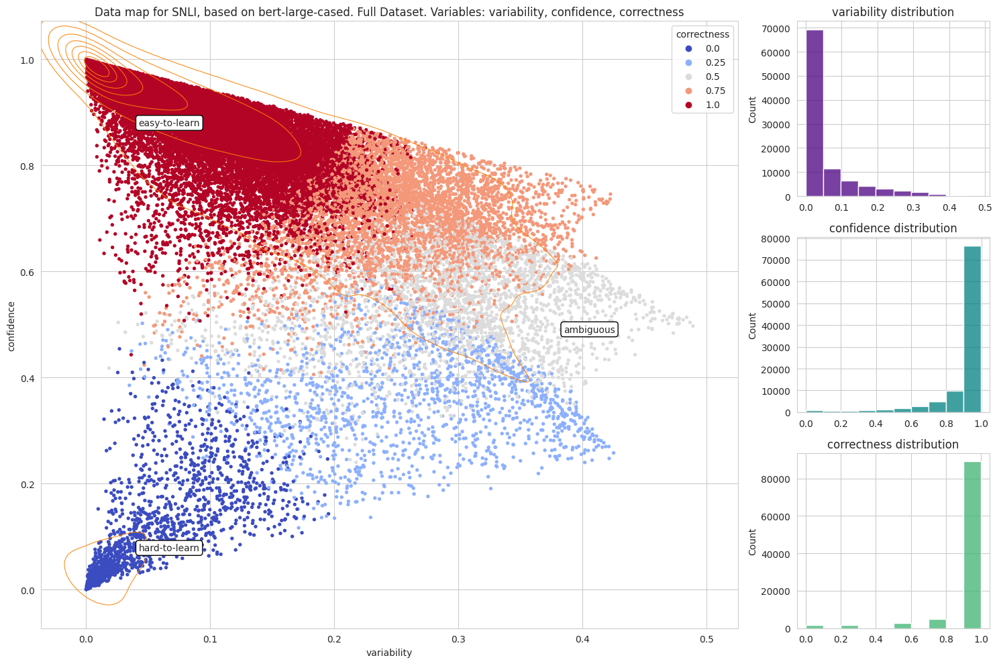

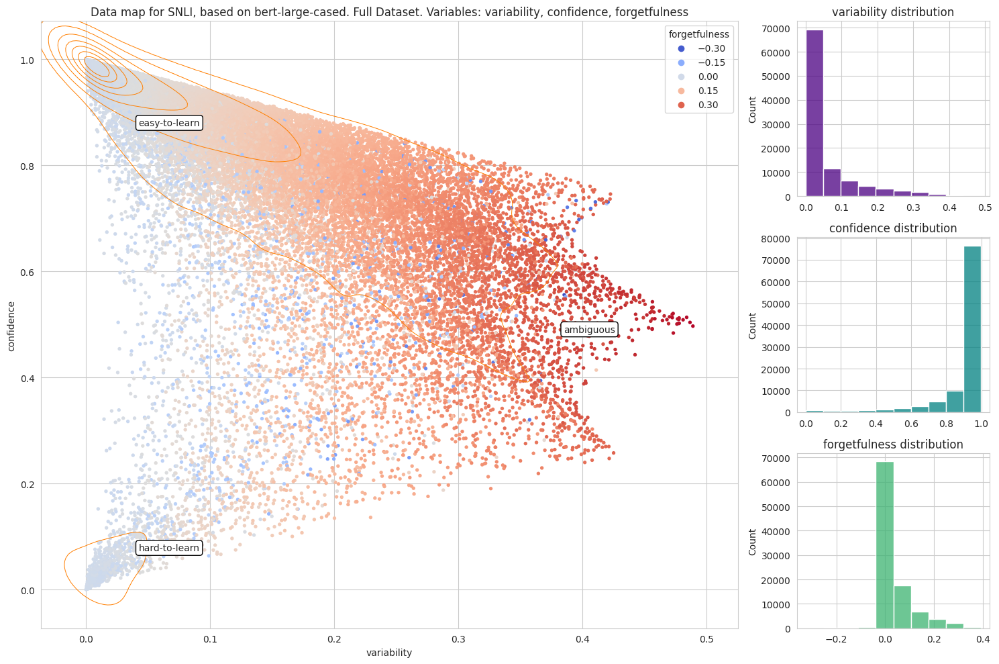

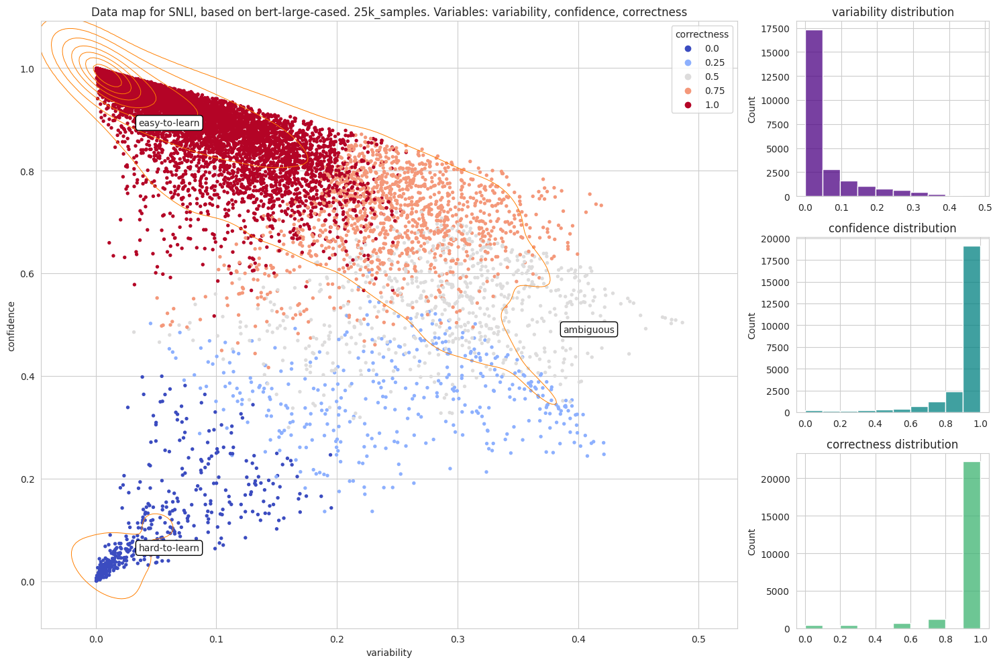

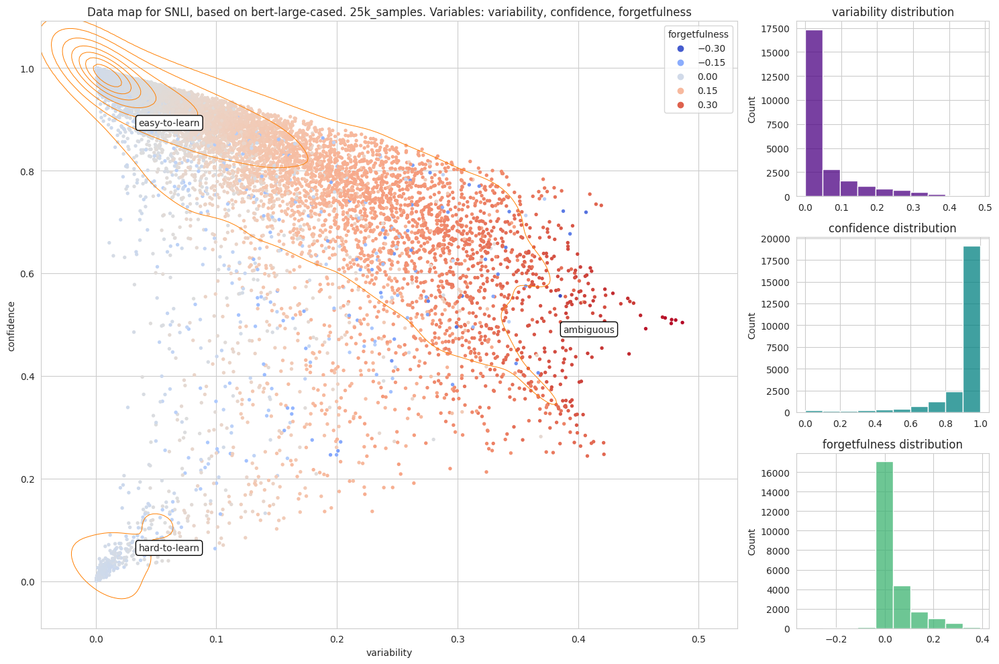

In [ ]:
bert_large_snli_model, bert_large_snli_dataset_map = run_datamap_training(bert_large_snli_hparams)

In [ ]:
print(bert_large_snli_model)
print(bert_large_snli_dataset_map)

# Distil Bert Base QNLI

## Set constants and parameters


In [ ]:
distilbert_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'distilbert-base-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 20,
    # "VALIDATION_AMOUNT": 10,
    # "TEST_AMOUNT": 10,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(distilbert_qnli_hparams)

In [ ]:
rprint(distilbert_qnli_hparams)

{
    'SEED_VALUE': 42,
    'TRAIN_BATCH_SIZE': 128,
    'VALIDATION_BATCH_SIZE': 128,
    'TEST_BATCH_SIZE': 128,
    'DATASET_NAME': 'glue/qnli',
    'MODEL_NAME': 'distilbert-base-cased',
    'EPOCHS': 4,
    'PATIENCE': 3,
    'TRAIN_AMOUNT': None,
    'VALIDATION_AMOUNT': None,
    'TEST_AMOUNT': None,
    'SUBSET_TAG': '',
    'ALREADY_TRAINED': False,
    'EPOCH_TO_LOAD': 2,
    'MODEL_DIR': 'models/glue/qnli/distilbert-base-cased',
    'TRAINING_DYNAMICS_FILE': 'training_dynamics/glue/qnli/distilbert-base-cased'
}

## Run Training

In [ ]:
distilbert_qnli_model, distilbert_qnli_dataset_map = run_datamap_training(distilbert_qnli_hparams)

Output hidden; open in https://colab.research.google.com to view.

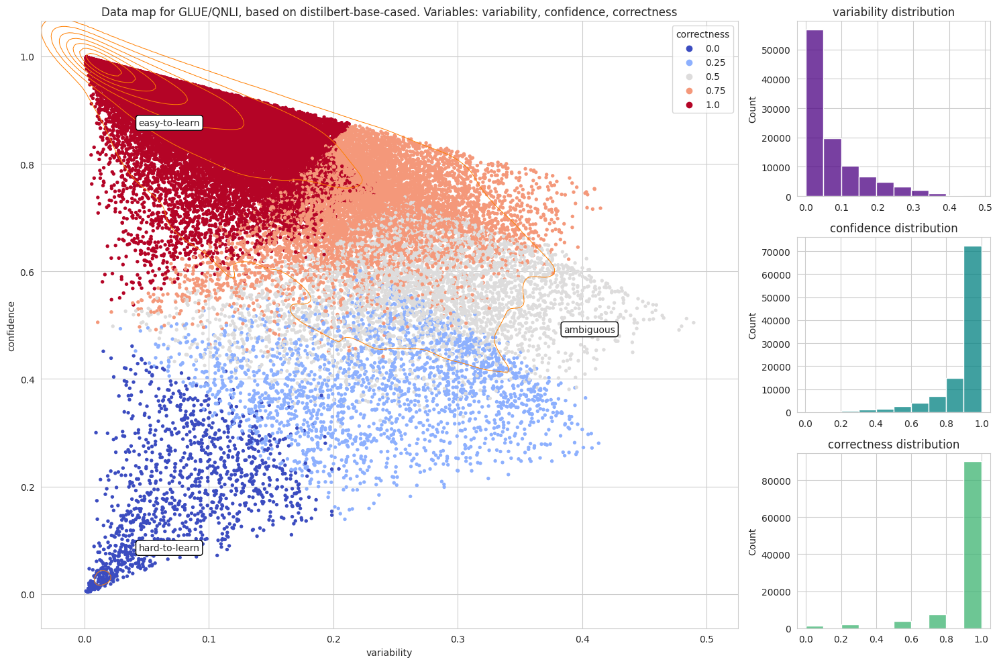

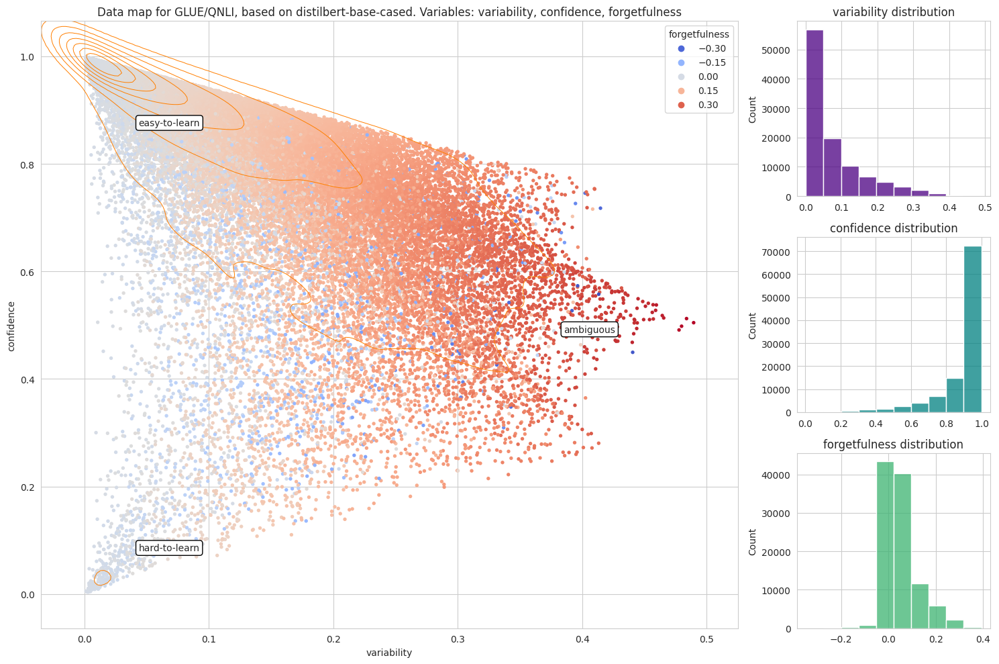

In [ ]:
datamap = plot_datamap(
    distilbert_qnli_dataset_map.variability,
    distilbert_qnli_dataset_map.confidence,
    distilbert_qnli_dataset_map.correctness,
    var1_name='variability',
    var2_name='confidence',
    var3_name='correctness',
    dataset_name=distilbert_qnli_hparams['DATASET_NAME'],
    model_name=distilbert_qnli_hparams['MODEL_NAME']
)

datamap.show()

# using forgetfulness
datamap = plot_datamap(
    distilbert_qnli_dataset_map.variability,
    distilbert_qnli_dataset_map.confidence,
    distilbert_qnli_dataset_map.forgetfulness,
    var1_name='variability',
    var2_name='confidence',
    var3_name='forgetfulness',
    dataset_name=distilbert_qnli_hparams['DATASET_NAME'],
    model_name=distilbert_qnli_hparams['MODEL_NAME']
)

datamap.show()

In [ ]:
print(distilbert_qnli_model)
print(distilbert_qnli_dataset_map)

# Bert Base Cased QNLI

## Set constants and parameters


In [ ]:
bert_base_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'bert-base-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 20,
    # "VALIDATION_AMOUNT": 10,
    # "TEST_AMOUNT": 10,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    "SUBSET_TAG": "",

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(bert_base_qnli_hparams)

## Run Training

In [ ]:
bert_base_qnli_model, bert_base_qnli_dataset_map = run_datamap_training(bert_base_qnli_hparams)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(bert_base_qnli_model)
print(bert_base_qnli_dataset_map)

# Bert Large Cased QNLI

## Set constants and parameters


In [ ]:
bert_large_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'bert-large-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 500,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(bert_large_qnli_hparams)

## Run Training

In [ ]:
bert_large_qnli_model, bert_large_qnli_dataset_map = run_datamap_training(bert_large_qnli_hparams)

Fetching dataset: glue/qnli
Fetching tokenizer for: bert-large-cased
Tokenizer loaded: BertTokenizerFast(name_or_path='bert-large-cased', vocab_size=28996, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: AddedToken("[UNK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	101: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	102: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	103: AddedToken("[MASK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.prefe

Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:40<00:00, 2555.18it/s]
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-17-6b00f72af6b8>", line 1, in <cell line: 1>
    bert_large_qnli_model, bert_large_qnli_dataset_map = run_datamap_training(bert_large_qnli_hparams)
  File "<ipython-input-13-13b2445065ab>", line 83, in run_datamap_training
    model.fit(
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "<ipython-input-10-5b9409548b2a>", line 178, in on_epoch_end
    self.save_training_dynamics_to_json()
  File "<ipython-input-10-5b9409548b2a>", line 220, in save_training_dynamics_to_json
    os.makedirs(directory_path)
  File "/usr/lib/python3.10/os.py", line 215, in makedirs
    makedirs(head, exist_ok=exist_ok)
  File "/usr/lib/python3.10/os.py", line 215, in makedirs
 

In [ ]:
print(bert_large_qnli_model)
print(bert_large_qnli_dataset_map)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-15-95235fba5ac3>", line 1, in <cell line: 1>
    print(bert_large_qnli_model)
NameError: name 'bert_large_qnli_model' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/usr/local/lib/python3.10/dist-pa

# DistilRoberta Base QNLI

In [ ]:
distilroberta_base_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'distilroberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 500,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(distilroberta_base_qnli_hparams)

In [ ]:
distilroberta_base_qnli_model, distilroberta_base_qnli_dataset_map = run_datamap_training(distilroberta_base_qnli_hparams)

Output hidden; open in https://colab.research.google.com to view.

# Roberta Base QNLI

## Set constants and parameters


In [ ]:
roberta_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 20,
    # "VALIDATION_AMOUNT": 10,
    # "TEST_AMOUNT": 10,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

roberta_qnli_hparams['MODEL_DIR'] = f"models/{roberta_qnli_hparams['DATASET_NAME']}/{roberta_qnli_hparams['MODEL_NAME']}"
roberta_qnli_hparams['TRAINING_DYNAMICS_FILE'] = f"training_dynamics/{roberta_qnli_hparams['DATASET_NAME']}/{roberta_qnli_hparams['MODEL_NAME']}.json"
tf.random.set_seed(roberta_qnli_hparams['SEED_VALUE'])

## Run Training

In [ ]:
roberta_qnli_hparams, roberta_qnli_dataset_map = run_datamap_training(roberta_qnli_hparams)

Fetching dataset: glue/qnli
Fetching tokenizer for: roberta-base


config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Converting examples to features. Length of dataset: 104743


/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 73.28 seconds
Converting examples to features. Length of dataset: 104743
Time taken: 65.46 seconds
Batching dataset.
Batching dataset.
Converting examples to features. Length of dataset: 2732
Time taken: 2.37 seconds
Batching dataset.
Converting examples to features. Length of dataset: 2731
Time taken: 2.21 seconds
Batching dataset.
Loading pre-trained models.


model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Initializing DataMapCallback.
Creating directory for model: models/glue/qnli/roberta-base
No model previously trained for roberta-base. Initializing a new one.
Epoch 1/4
   1637/Unknown - 905s 520ms/step - loss: 0.3198 - accuracy: 0.8664
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:33<00:00, 3167.67it/s]


Saving training dynamics to training_dynamics/glue/qnli/roberta-base.json.
1637/1637 [==============================] - 1531s 902ms/step - loss: 0.3198 - accuracy: 0.8664 - val_loss: 0.2157 - val_accuracy: 0.9191
Epoch 2/4
1637/1637 [==============================] - ETA: 0s - loss: 0.2128 - accuracy: 0.9189
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:33<00:00, 3099.46it/s]


Saving training dynamics to training_dynamics/glue/qnli/roberta-base.json.
1637/1637 [==============================] - 1410s 861ms/step - loss: 0.2128 - accuracy: 0.9189 - val_loss: 0.2444 - val_accuracy: 0.9158
Epoch 3/4
1637/1637 [==============================] - ETA: 0s - loss: 0.1533 - accuracy: 0.9437
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:33<00:00, 3138.89it/s]


Saving training dynamics to training_dynamics/glue/qnli/roberta-base.json.
1637/1637 [==============================] - 1411s 862ms/step - loss: 0.1533 - accuracy: 0.9437 - val_loss: 0.2691 - val_accuracy: 0.9165
Epoch 4/4
1637/1637 [==============================] - ETA: 0s - loss: 0.1145 - accuracy: 0.9591
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:33<00:00, 3162.54it/s]


Saving training dynamics to training_dynamics/glue/qnli/roberta-base.json.
1637/1637 [==============================] - 1420s 868ms/step - loss: 0.1145 - accuracy: 0.9591 - val_loss: 0.3155 - val_accuracy: 0.9176
Evaluating model on test set!
22/22 [==============================] - 8s 342ms/step - loss: 0.3084 - accuracy: 0.9158
            DistilBERT
100% Train   91.578174
Plotting datamaps!


NameError: ignored

In [ ]:
print(roberta_qnli_hparams)
print(roberta_qnli_dataset_map)

# Roberta Large QNLI

## Set constants and parameters


In [ ]:
roberta_large_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 64,
    "TEST_BATCH_SIZE": 64,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'roberta-large',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_large_qnli_hparams)

In [ ]:
from rich import print as rprint

rprint(roberta_large_qnli_hparams)

{
    'SEED_VALUE': 42,
    'TRAIN_BATCH_SIZE': 16,
    'VALIDATION_BATCH_SIZE': 64,
    'TEST_BATCH_SIZE': 64,
    'DATASET_NAME': 'glue/qnli',
    'MODEL_NAME': 'roberta-large',
    'EPOCHS': 4,
    'PATIENCE': 3,
    'TRAIN_AMOUNT': None,
    'VALIDATION_AMOUNT': None,
    'TEST_AMOUNT': None,
    'SUBSET_TAG': '',
    'ALREADY_TRAINED': False,
    'EPOCH_TO_LOAD': 1,
    'MODEL_DIR': 'models/glue/qnli/roberta-large',
    'TRAINING_DYNAMICS_FILE': 'training_dynamics/glue/qnli/roberta-large'
}

## Run Training

In [ ]:
roberta_large_qnli_model, roberta_large_qnli_dataset_map = run_datamap_training(roberta_large_qnli_hparams)

Fetching dataset: glue/qnli


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/104743 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/glue/qnli/2.0.0.incomplete6GZRCD/glue-train.tfrecord*...:   0%|          |…

Generating validation examples...:   0%|          | 0/5463 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/glue/qnli/2.0.0.incomplete6GZRCD/glue-validation.tfrecord*...:   0%|      …

Generating test examples...:   0%|          | 0/5463 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/glue/qnli/2.0.0.incomplete6GZRCD/glue-test.tfrecord*...:   0%|          | …

Dataset glue downloaded and prepared to /root/tensorflow_datasets/glue/qnli/2.0.0. Subsequent calls will reuse this data.
Fetching tokenizer for: roberta-large


config.json:   0%|          | 0.00/482 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-large', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
Printing 3 exampl

/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 64.17 seconds
<class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
Printing 3 examples from dataset: <_PrefetchDataset element_spec={'idx': TensorSpec(shape=(), dtype=tf.int32, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None), 'question': TensorSpec(shape=(), dtype=tf.string, name=None), 'sentence': TensorSpec(shape=(), dtype=tf.string, name=None)}>
Sample 1: {'idx': <tf.Tensor: shape=(), dtype=int32, numpy=16399>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'The period of time from 1200 to 1000 BCE is known as what?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'In the Iron Age'>}
Sample 2: {'idx': <tf.Tensor: shape=(), dtype=int32, numpy=1680>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b"Who was the London Weekend Television's managing director?">, 'sentence': <tf.Tensor: shape=(), dtype=string, num

model.safetensors:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Initializing DataMapCallback.
No model previously trained for roberta-large. Initializing a new one.
Model: "tf_roberta_for_sequence_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  354310144 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  1051650   
 ificationHead)                                                  
                                                                 
Total params: 355361794 (1.32 GB)
Trainable params: 355361794 (1.32 GB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model summary is:
None

Epoch 1/4
   6547/Unknown - 3286s 485ms/step - loss: 0.2632 - accuracy: 0.8933
Epoch has ended! Now calculating gold labels p

Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:34<00:00, 3021.54it/s]



Saving training dynamics to training_dynamics/glue/qnli/roberta-large.json.
6547/6547 [==============================] - 4572s 682ms/step - loss: 0.2632 - accuracy: 0.8933 - val_loss: 0.1908 - val_accuracy: 0.9337
Epoch 2/4
6547/6547 [==============================] - ETA: 0s - loss: 0.1626 - accuracy: 0.9411
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:40<00:00, 2555.54it/s]



Saving training dynamics to training_dynamics/glue/qnli/roberta-large.json.
6547/6547 [==============================] - 4564s 697ms/step - loss: 0.1626 - accuracy: 0.9411 - val_loss: 0.2067 - val_accuracy: 0.9345
Epoch 3/4
6547/6547 [==============================] - ETA: 0s - loss: 0.1093 - accuracy: 0.9628
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:37<00:00, 2779.00it/s]



Saving training dynamics to training_dynamics/glue/qnli/roberta-large.json.
6547/6547 [==============================] - 4614s 705ms/step - loss: 0.1093 - accuracy: 0.9628 - val_loss: 0.2052 - val_accuracy: 0.9400
Epoch 4/4
6547/6547 [==============================] - ETA: 0s - loss: 0.0769 - accuracy: 0.9752
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:37<00:00, 2830.68it/s]
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-22-7a9284cdce4b>", line 1, in <cell line: 1>
    roberta_large_qnli_model, roberta_large_qnli_dataset_map = run_datamap_training(roberta_large_qnli_hparams)
  File "<ipython-input-19-e7b12633c749>", line 83, in run_datamap_training
    model.fit(
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "<ipython-input-10-5b9409548b2a>", line 178, in on_epoch_end
    self.save_training_dynamics_to_json()
  File "<ipython-input-10-5b9409548b2a>", line 220, in save_training_dynamics_to_json
    os.makedirs(directory_path)
  File "/usr/lib/python3.10/os.py", line 215, in makedirs
    makedirs(head, exist_ok=exist_ok)
  File "/usr/lib/python3.10/os.py", line 215, in m

In [ ]:
roberta_large_qnli_model, roberta_large_qnli_dataset_map = run_datamap_training(roberta_large_qnli_hparams)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(roberta_large_qnli_model)
print(roberta_large_qnli_dataset_map)

# DistilRoberta (Ambiguous Testing) - SNLI

## DistilRoberta as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/distilroberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/distilroberta-base.json: 100%|██████████| 100000/100000 [00:00<00:00, 746782.52it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
distil_roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_dr", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(distil_roberta_hparams)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: distilroberta-base


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='distilroberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
<class 'tensorfl

model.safetensors:   0%|          | 0.00/331M [00:00<?, ?B/s]

Initializing DataMapCallback.
Creating directory for model: models/snli/033amb_from_dr/distilroberta-base
No model previously trained for distilroberta-base. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x7e49cc110eb0>
Model: "tf_roberta_for_sequence_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  81527808  
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  592899    
 ificationHead)                                                  
                                                                 
Total params: 82120707 (313.27 MB)
Trainable params: 82120707 (313.27 MB)
Non-trainable params: 0 (0.00 Byte)
____

Saving training indexes along with training dynamics to json: 32999it [00:16, 2003.40it/s]



Saving training dynamics to training_dynamics/snli/033amb_from_dr/distilroberta-base.json.
258/258 [==============================] - 662s 2s/step - loss: 1.0085 - accuracy: 0.4616 - val_loss: 0.7518 - val_accuracy: 0.6728
Epoch 2/4
258/258 [==============================] - ETA: 0s - loss: 0.8700 - accuracy: 0.5562
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 32999it [00:20, 1591.87it/s]



Saving training dynamics to training_dynamics/snli/033amb_from_dr/distilroberta-base.json.
258/258 [==============================] - 636s 2s/step - loss: 0.8700 - accuracy: 0.5562 - val_loss: 0.7125 - val_accuracy: 0.7005
Epoch 3/4
258/258 [==============================] - ETA: 0s - loss: 0.7778 - accuracy: 0.6141
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 32999it [00:15, 2091.09it/s]



Saving training dynamics to training_dynamics/snli/033amb_from_dr/distilroberta-base.json.
258/258 [==============================] - 626s 2s/step - loss: 0.7778 - accuracy: 0.6141 - val_loss: 0.7156 - val_accuracy: 0.6965
Epoch 4/4
258/258 [==============================] - ETA: 0s - loss: 0.6944 - accuracy: 0.6623
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 32999it [00:16, 2060.64it/s]



Saving training dynamics to training_dynamics/snli/033amb_from_dr/distilroberta-base.json.
258/258 [==============================] - 632s 2s/step - loss: 0.6944 - accuracy: 0.6623 - val_loss: 0.7133 - val_accuracy: 0.6885
Evaluating model on test set!
77/77 [==============================] - 41s 529ms/step - loss: 0.7251 - accuracy: 0.6899
            distilroberta-base
100% Train           68.994302
Plotting datamaps!


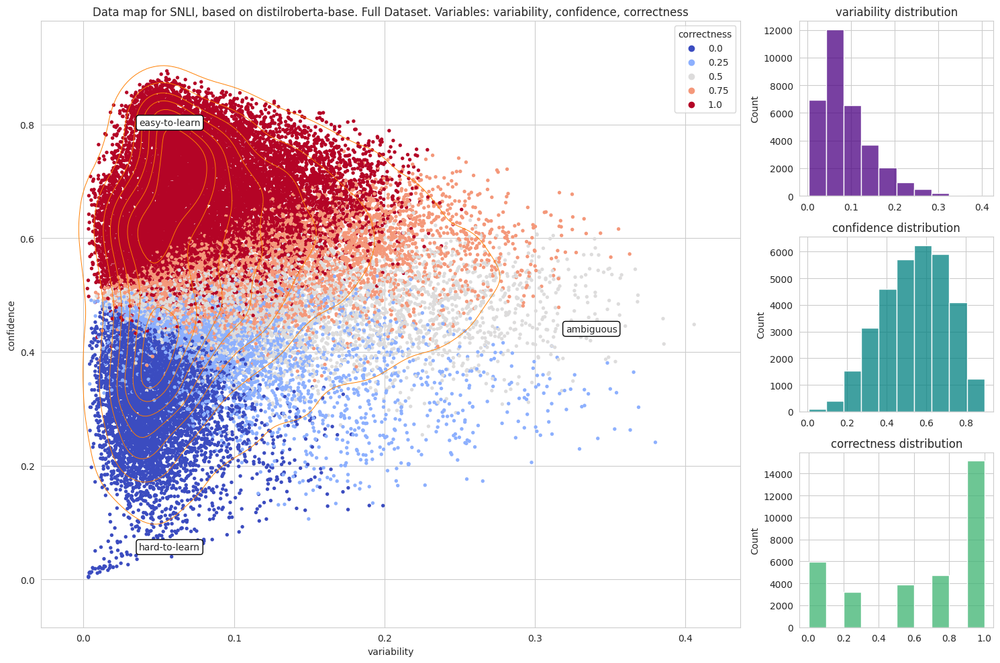

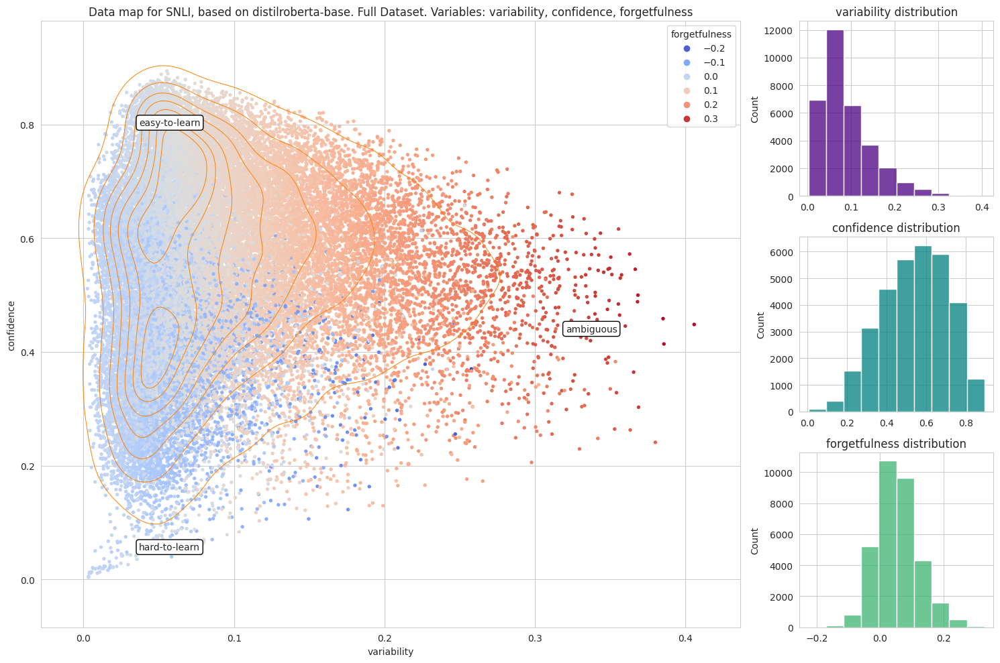

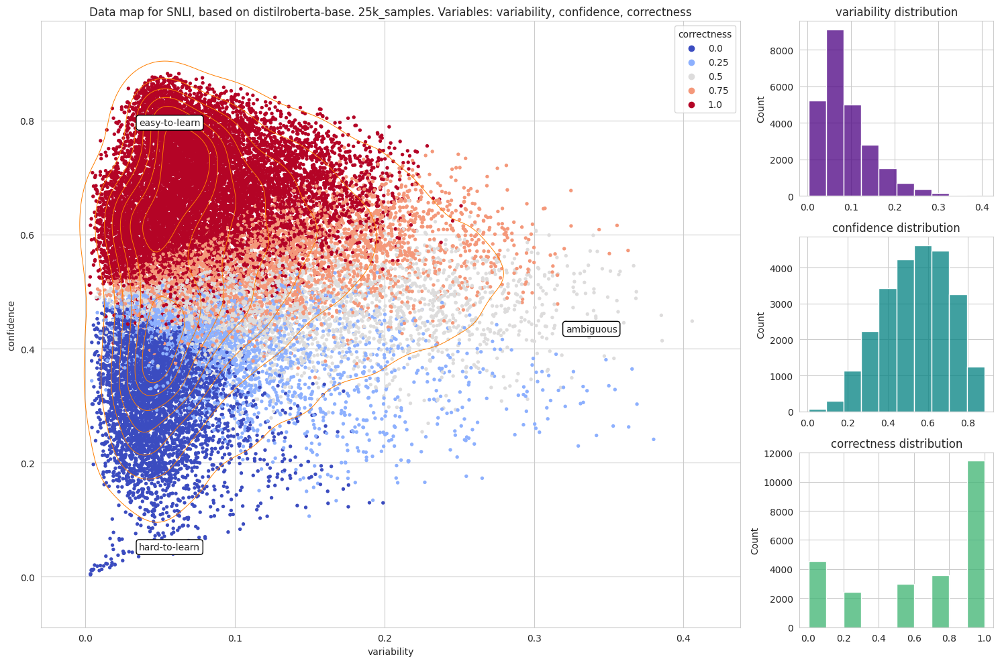

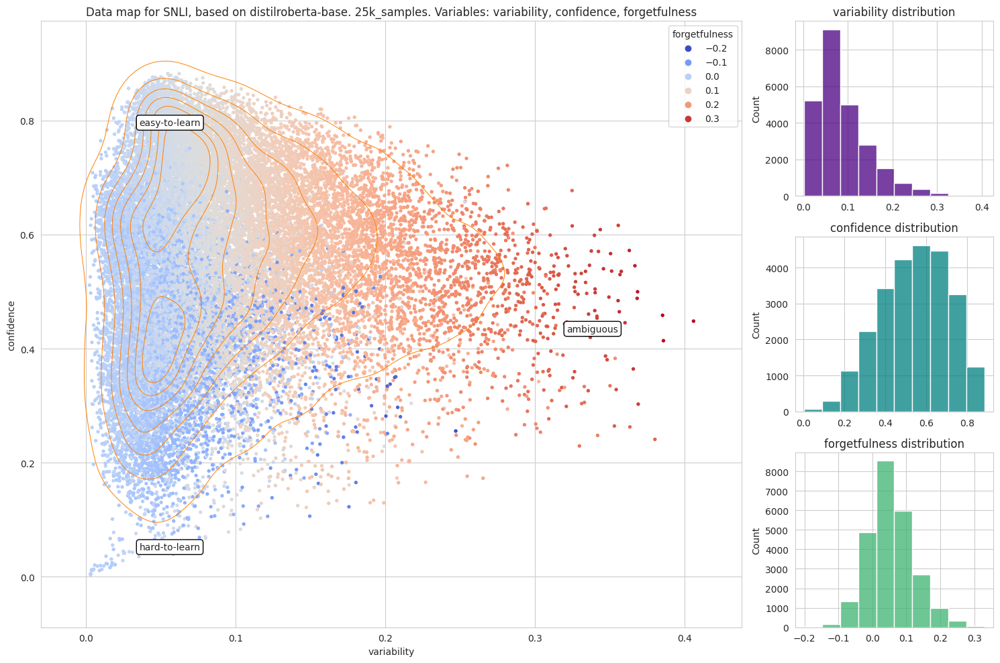

In [ ]:
distil_roberta_033amb_from_dr, distil_roberta_033amb_from_dr_datamap = run_datamap_training(distil_roberta_hparams, train_subset_indices, calculate_training_dynamics=True)

## RobertaBase as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/roberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/roberta-base.json: 100%|██████████| 100000/100000 [00:00<00:00, 517728.38it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'distilroberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_rb", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_rb, roberta_033amb_from_rb_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/snli/1.1.0.incompleteC9MZCM/snli-test.tfrecord*...:   0%|          | 0/100…

Generating validation examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/snli/1.1.0.incompleteC9MZCM/snli-validation.tfrecord*...:   0%|          |…

Generating train examples...:   0%|          | 0/550152 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/snli/1.1.0.incompleteC9MZCM/snli-train.tfrecord*...:   0%|          | 0/55…

Dataset snli downloaded and prepared to /root/tensorflow_datasets/snli/1.1.0. Subsequent calls will reuse this data.
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: distilroberta-base


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='distilroberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
<class 'tensorfl

model.safetensors:   0%|          | 0.00/331M [00:00<?, ?B/s]

Initializing DataMapCallback.
No model previously trained for distilroberta-base. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x7cdbc47d34f0>
Model: "tf_roberta_for_sequence_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  81527808  
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  592899    
 ificationHead)                                                  
                                                                 
Total params: 82120707 (313.27 MB)
Trainable params: 82120707 (313.27 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model summary 

## RobertaLarge as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/roberta-large.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/roberta-large.json: 100%|██████████| 100000/100000 [00:00<00:00, 1136338.24it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'distilroberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_rl", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_rl, roberta_033amb_from_rl_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: distilroberta-base
Tokenizer loaded: RobertaTokenizerFast(name_or_path='distilroberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedT

# RobertaBase (Ambiguous Testing) - SNLI

## DistilRoberta as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/distilroberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/distilroberta-base.json: 100%|██████████| 100000/100000 [00:00<00:00, 539323.67it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_dr", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_dr, roberta_033amb_from_dr_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-base


config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
<class 'tensorflow.pyt

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Initializing DataMapCallback.
Creating directory for model: models/snli/033amb_from_dr/roberta-base
No model previously trained for roberta-base. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x7cdbc0506350>
Model: "tf_roberta_for_sequence_classification_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  124055040 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  592899    
 ificationHead)                                                  
                                                                 
Total params: 124647939 (475.49 MB)
Trainable params: 124647939 (475.49 MB)
Non-trainable params: 0 (0.00 Byte)
____________

## RobertaBase as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/roberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/roberta-base.json: 100%|██████████| 100000/100000 [00:00<00:00, 1048473.77it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_rb", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_rb, roberta_033amb_from_rb_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-base
Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", 

## RobertaLarge as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/roberta-large.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/roberta-large.json: 100%|██████████| 100000/100000 [00:00<00:00, 1106060.74it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_rl", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_rl, roberta_033amb_from_rl_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/snli/1.1.0.incompleteQX3XT4/snli-test.tfrecord*...:   0%|          | 0/100…

Generating validation examples...:   0%|          | 0/10000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/snli/1.1.0.incompleteQX3XT4/snli-validation.tfrecord*...:   0%|          |…

Generating train examples...:   0%|          | 0/550152 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/snli/1.1.0.incompleteQX3XT4/snli-train.tfrecord*...:   0%|          | 0/55…

Dataset snli downloaded and prepared to /root/tensorflow_datasets/snli/1.1.0. Subsequent calls will reuse this data.
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-base


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
<class 'tensorflow.pyt

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Initializing DataMapCallback.
No model previously trained for roberta-base. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x7a9d75934e50>
Model: "tf_roberta_for_sequence_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  124055040 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  592899    
 ificationHead)                                                  
                                                                 
Total params: 124647939 (475.49 MB)
Trainable params: 124647939 (475.49 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model summary is:


# Roberta Large (Ambiguous Testing) - SNLI

## DistilRoberta as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/distilroberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-large',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_dr", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_dr, roberta_033amb_from_dr_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-large


config.json:   0%|          | 0.00/482 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-large', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
<class 'tensorflow.py

model.safetensors:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Initializing DataMapCallback.
No model previously trained for roberta-large. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x7a9d77082b60>
Model: "tf_roberta_for_sequence_classification_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  354310144 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  1052675   
 ificationHead)                                                  
                                                                 
Total params: 355362819 (1.32 GB)
Trainable params: 355362819 (1.32 GB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model summary is:
N

KeyboardInterrupt: 

## RobertaBase as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/roberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/roberta-base.json: 100%|██████████| 100000/100000 [00:00<00:00, 161700.31it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-large',
    "EPOCHS": 4,
    "PATIENCE": 0,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_rb", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_rb, roberta_033amb_from_rb_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-large


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-large', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
<class 'tensorflow.py

## RobertaLarge as Base

In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/snli/100k/roberta-large.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.33)

Fetching training dynamics from saved json file: training_dynamics/snli/100k/roberta-large.json: 100%|██████████| 100000/100000 [00:00<00:00, 1078826.29it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
roberta_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 16,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'snli',
    "MODEL_NAME": 'roberta-large',
    "EPOCHS": 8,
    "PATIENCE": 0,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "033amb_from_rl", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 4,
}

setup_model_directories_and_seed(roberta_hparams)

In [ ]:
roberta_033amb_from_rl, roberta_033amb_from_rl_datamap = run_datamap_training(roberta_hparams, train_subset_indices, calculate_training_dynamics=False, monitor_loss=True)

Fetching dataset: snli
type of train_unshuffled is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of test is: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of test is: <class 'tensorflow.python.data.ops.filter_op._FilterDataset'>
type of train_unshuffled is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
type of test is: <class 'tensorflow.python.data.ops.map_op._ParallelMapDataset'>
Fetching tokenizer for: roberta-large
Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-large', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>"

## Set Constants and Parameters

In [ ]:
distilroberta_advsqu_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'adversarial_squad',
    "MODEL_NAME": 'distilroberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(distilroberta_advsqu_hparams)

## Run Training

Fetching dataset: adversarial_squad


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:72: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:1429: FutureWarning: The repository for squad_adversarial contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/squad_adversarial
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warn

Fetching tokenizer for: distilroberta-base
Tokenizer loaded: RobertaTokenizerFast(name_or_path='distilroberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'datasets.arrow_dataset.Data

100%|██████████| 3560/3560 [00:00<00:00, 3626.39it/s]
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 2.33 seconds
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game woul

100%|██████████| 3560/3560 [00:01<00:00, 3540.23it/s]


Time taken: 2.34 seconds
Batching dataset.
Batching dataset.
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman

100%|██████████| 3560/3560 [00:01<00:00, 3454.44it/s]


Time taken: 2.92 seconds
Batching dataset.
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under w

100%|██████████| 3560/3560 [00:00<00:00, 3575.90it/s]


Time taken: 3.08 seconds
Batching dataset.
Loading pre-trained model.
Number of labels for dataset adversarial_squad is: 2
Initializing DataMapCallback.
No model previously trained for distilroberta-base. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x79f18dee6650>
Model: "tf_roberta_for_sequence_classification_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  81527808  
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  592130    
 ificationHead)                                                  
                                                                 
Total params: 82119938 (313.26 MB)
Trainable params: 82119938 (31

Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 8966.39it/s]



Saving training dynamics to training_dynamics/adversarial_squad/distilroberta-base.json.
28/28 [==============================] - 106s 3s/step - loss: 0.5102 - accuracy: 0.7065 - val_loss: 0.3121 - val_accuracy: 0.8581
Epoch 2/4
28/28 [==============================] - ETA: 0s - loss: 0.2309 - accuracy: 0.9205
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 11670.98it/s]



Saving training dynamics to training_dynamics/adversarial_squad/distilroberta-base.json.
28/28 [==============================] - 87s 3s/step - loss: 0.2309 - accuracy: 0.9205 - val_loss: 0.0914 - val_accuracy: 0.9739
Epoch 3/4
28/28 [==============================] - ETA: 0s - loss: 0.1316 - accuracy: 0.9576
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 11106.68it/s]



Saving training dynamics to training_dynamics/adversarial_squad/distilroberta-base.json.
28/28 [==============================] - 85s 3s/step - loss: 0.1316 - accuracy: 0.9576 - val_loss: 0.0832 - val_accuracy: 0.9744
Epoch 4/4
28/28 [==============================] - ETA: 0s - loss: 0.1096 - accuracy: 0.9671
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 7141.37it/s]



Saving training dynamics to training_dynamics/adversarial_squad/distilroberta-base.json.
28/28 [==============================] - 88s 3s/step - loss: 0.1096 - accuracy: 0.9671 - val_loss: 0.0530 - val_accuracy: 0.9846
Evaluating model on test set!
28/28 [==============================] - 15s 538ms/step - loss: 0.0530 - accuracy: 0.9846
            distilroberta-base
100% Train           98.455054
Plotting datamaps!


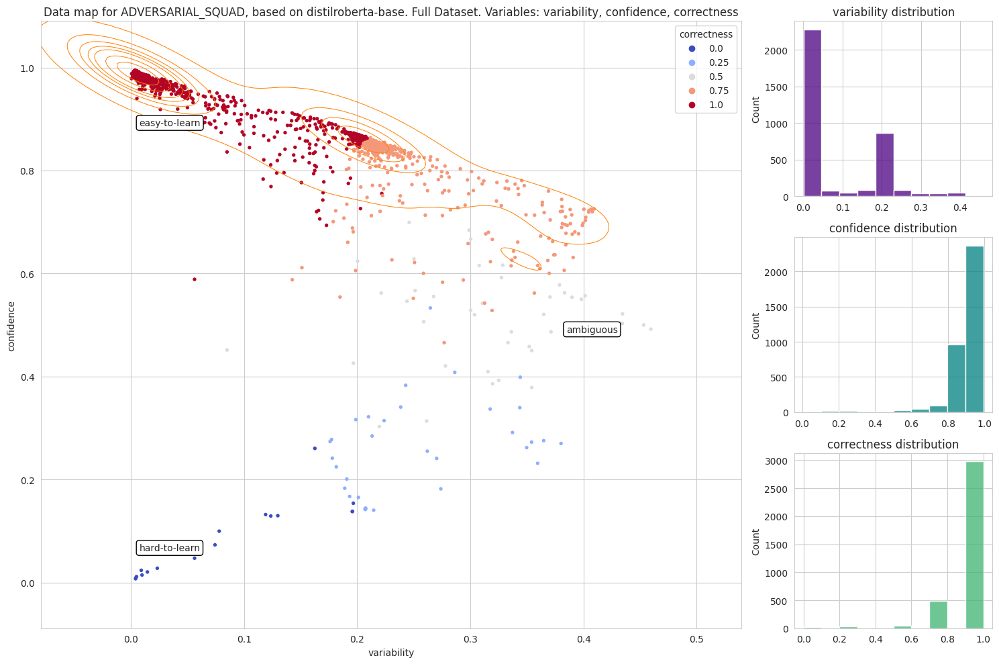

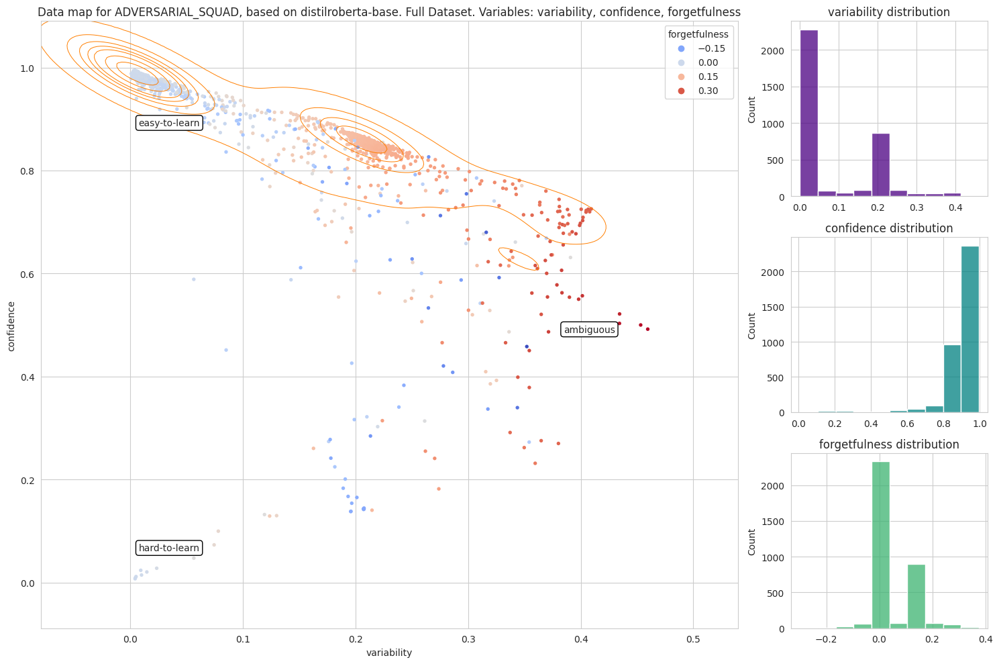

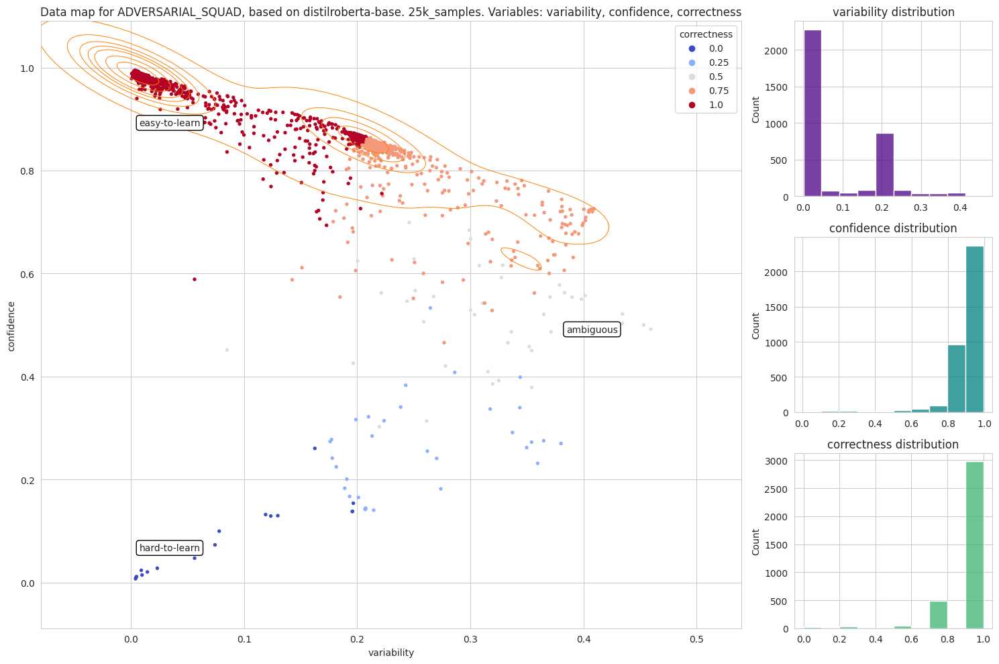

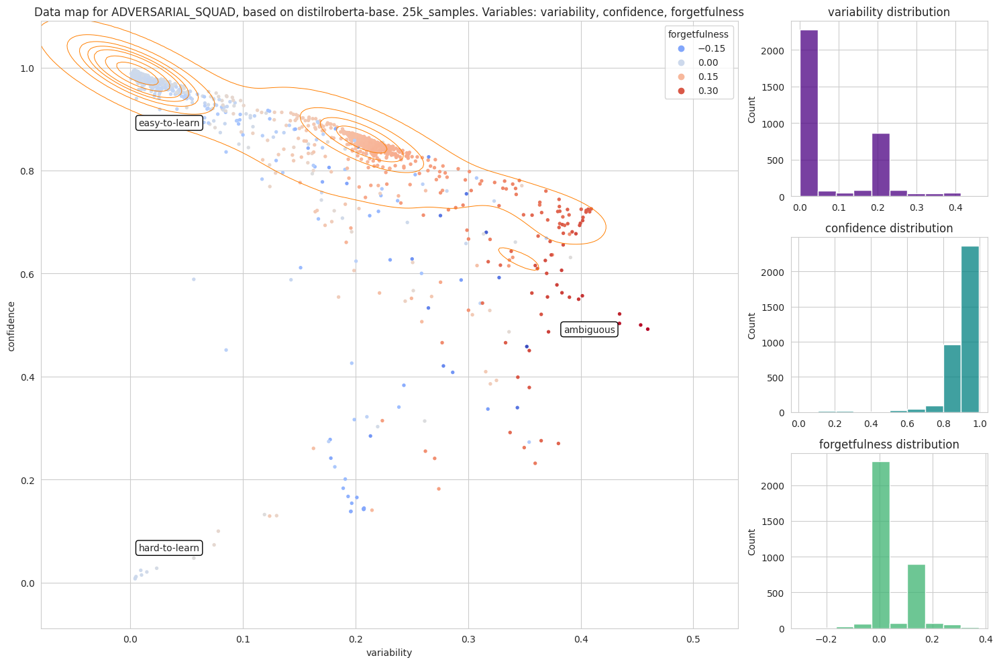

In [ ]:
distilroberta_advsqu_model, distilroberta_advsqu_dataset_map = run_datamap_training(distilroberta_advsqu_hparams)

# Roberta Base Adversarial Squad

## Set Constants and Parameters

In [ ]:
roberta_advsqu_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'adversarial_squad',
    "MODEL_NAME": 'roberta-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(roberta_advsqu_hparams)

## Run Training

Fetching dataset: adversarial_squad
Fetching tokenizer for: roberta-base
Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'dat

100%|██████████| 3560/3560 [00:00<00:00, 3564.88it/s]


Time taken: 2.44 seconds
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game woul

100%|██████████| 3560/3560 [00:01<00:00, 2819.67it/s]


Time taken: 3.38 seconds
Batching dataset.
Batching dataset.
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman

100%|██████████| 3560/3560 [00:01<00:00, 2268.81it/s]


Time taken: 4.20 seconds
Batching dataset.
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under w

100%|██████████| 3560/3560 [00:01<00:00, 3559.48it/s]


Time taken: 2.44 seconds
Batching dataset.
Loading pre-trained model.
Number of labels for dataset adversarial_squad is: 2
Initializing DataMapCallback.
No model previously trained for roberta-base. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x79edcda2f280>
Model: "tf_roberta_for_sequence_classification_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  124055040 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  592130    
 ificationHead)                                                  
                                                                 
Total params: 124647170 (475.49 MB)
Trainable params: 124647170 (475.49

Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 10707.25it/s]



Saving training dynamics to training_dynamics/adversarial_squad/roberta-base.json.
56/56 [==============================] - 216s 3s/step - loss: 0.3336 - accuracy: 0.8315 - val_loss: 0.1692 - val_accuracy: 0.9486
Epoch 2/4
56/56 [==============================] - ETA: 0s - loss: 0.1303 - accuracy: 0.9581
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 7196.63it/s]



Saving training dynamics to training_dynamics/adversarial_squad/roberta-base.json.
56/56 [==============================] - 160s 3s/step - loss: 0.1303 - accuracy: 0.9581 - val_loss: 0.0598 - val_accuracy: 0.9862
Epoch 3/4
56/56 [==============================] - ETA: 0s - loss: 0.1083 - accuracy: 0.9691
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 6815.72it/s]



Saving training dynamics to training_dynamics/adversarial_squad/roberta-base.json.
56/56 [==============================] - 182s 3s/step - loss: 0.1083 - accuracy: 0.9691 - val_loss: 0.0518 - val_accuracy: 0.9843
Epoch 4/4
56/56 [==============================] - ETA: 0s - loss: 0.0549 - accuracy: 0.9862
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 3559/3560 [00:00<00:00, 10704.56it/s]



Saving training dynamics to training_dynamics/adversarial_squad/roberta-base.json.
56/56 [==============================] - 166s 3s/step - loss: 0.0549 - accuracy: 0.9862 - val_loss: 0.0212 - val_accuracy: 0.9947
Evaluating model on test set!
28/28 [==============================] - 30s 1s/step - loss: 0.0212 - accuracy: 0.9947
            roberta-base
100% Train     99.466294
Plotting datamaps!


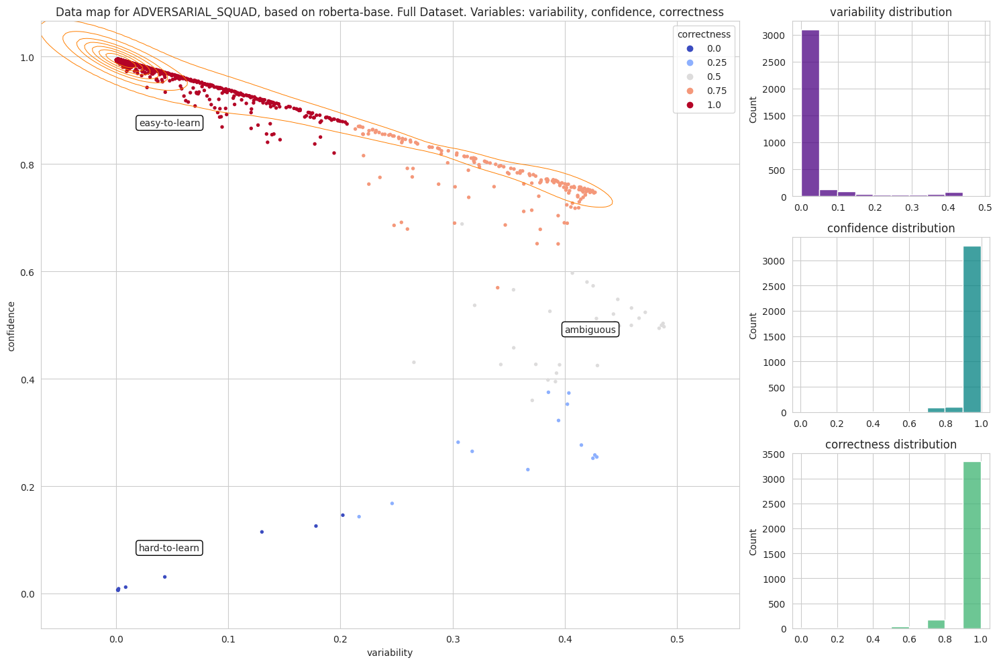

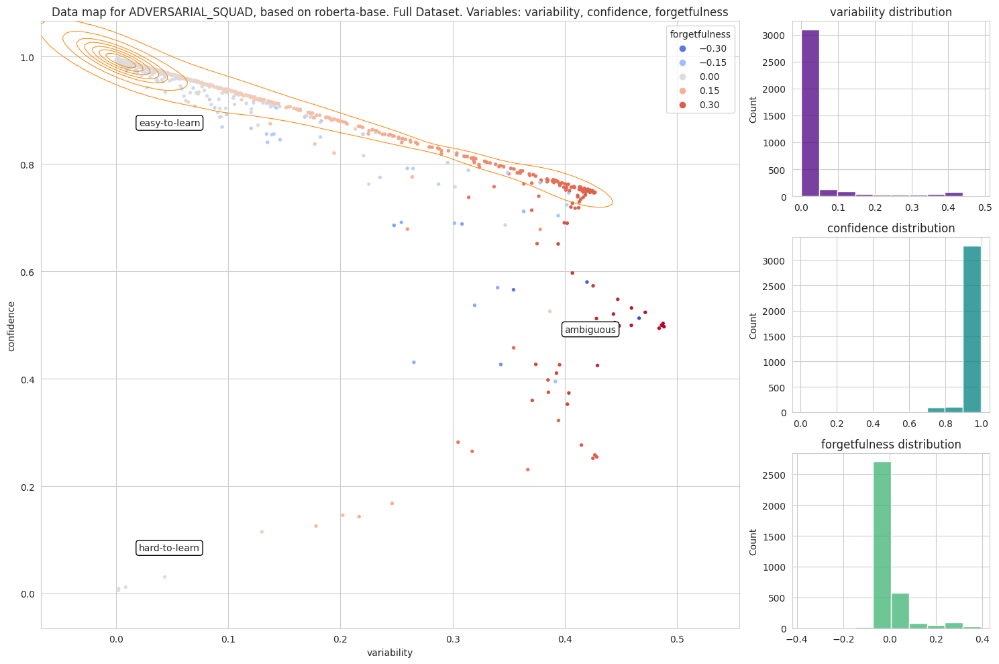

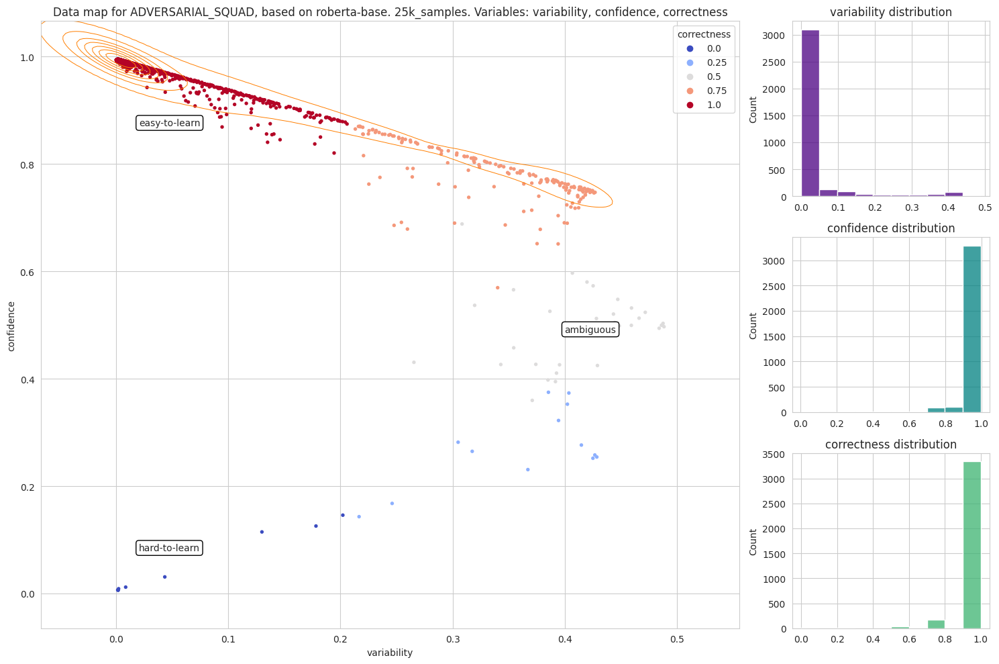

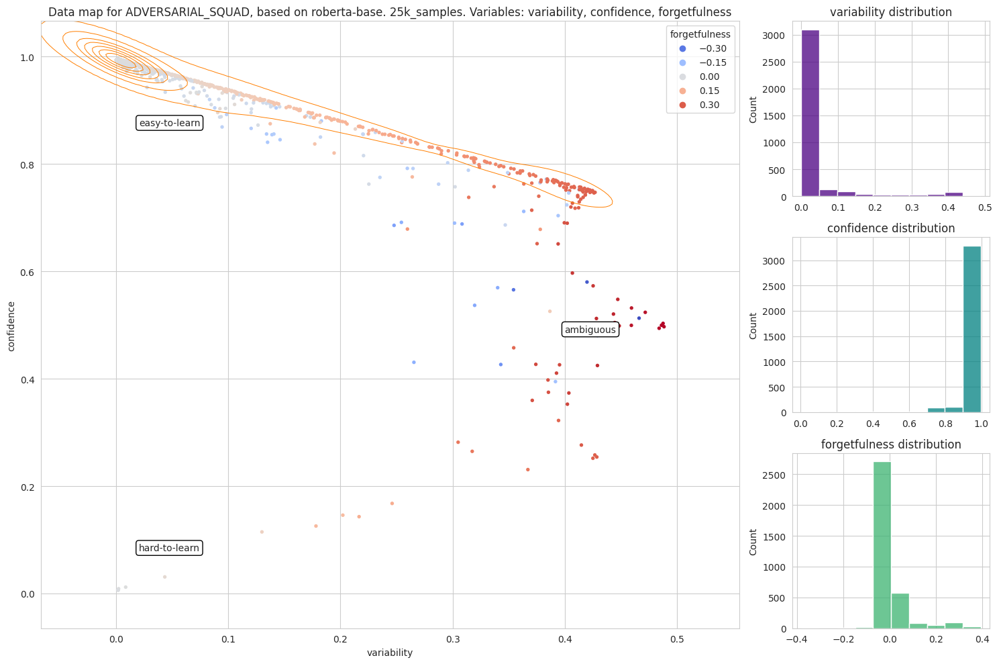

In [ ]:
roberta_advsqu_model, roberta_advsqu_dataset_map = run_datamap_training(roberta_advsqu_hparams)

# Roberta Large Adversarial Squad

## Set Constants and Parameters

In [ ]:
roberta_large_advsqu_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 8,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'adversarial_squad',
    "MODEL_NAME": 'roberta-large',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 100000,
    # "VALIDATION_AMOUNT": 1000,
    # "TEST_AMOUNT": 1000,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "", # set to "" if training on normal, full dataset with no training dynamics filtering

    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 2,  # optional, only if loading from an already trained model
}

setup_model_directories_and_seed(roberta_large_advsqu_hparams)

## Run Training

In [ ]:
roberta_large_advsqu_model, roberta_large_advsqu_dataset_map = run_datamap_training(roberta_large_advsqu_hparams)

Fetching dataset: adversarial_squad
Fetching tokenizer for: roberta-large
Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-large', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'd

100%|██████████| 3560/3560 [00:01<00:00, 3151.79it/s]


Time taken: 2.60 seconds
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game woul

100%|██████████| 3560/3560 [00:01<00:00, 3372.49it/s]


Time taken: 2.44 seconds
Batching dataset.
Batching dataset.
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman

100%|██████████| 3560/3560 [00:01<00:00, 3504.11it/s]


Time taken: 2.48 seconds
Batching dataset.
<class 'datasets.arrow_dataset.Dataset'>
<class 'datasets.arrow_dataset.Dataset'>
Printing 2 examples from dataset: Dataset({
    features: ['id', 'title', 'context', 'question', 'answers', 'idx'],
    num_rows: 3560
})
Sample 1: {'id': '56be4db0acb8001400a502ee', 'title': 'Super_Bowl_50', 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under w

100%|██████████| 3560/3560 [00:01<00:00, 3443.19it/s]


Time taken: 2.41 seconds
Batching dataset.
Loading pre-trained model.
Number of labels for dataset adversarial_squad is: 2
Initializing DataMapCallback.
No model previously trained for roberta-large. Initializing a new one.
type of model is: <transformers.models.roberta.modeling_tf_roberta.TFRobertaForSequenceClassification object at 0x79ed92392860>
Model: "tf_roberta_for_sequence_classification_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  354310144 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  1051650   
 ificationHead)                                                  
                                                                 
Total params: 355361794 (1.32 GB)
Trainable params: 355361794 (1.32 GB

ResourceExhaustedError: Graph execution error:

Detected at node tf_roberta_for_sequence_classification_8/roberta/encoder/layer_._11/intermediate/Gelu/truediv defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 377, in dispatch_queue

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 250, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 748, in __init__

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-71-ca54f360f8a0>", line 1, in <cell line: 1>

  File "<ipython-input-59-b510708bf3ee>", line 83, in run_datamap_training

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1807, in fit

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step

  File "/usr/local/lib/python3.10/dist-packages/transformers/modeling_tf_utils.py", line 1640, in train_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 590, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/transformers/modeling_tf_utils.py", line 1265, in run_call_with_unpacked_inputs

  File "/usr/local/lib/python3.10/dist-packages/transformers/models/roberta/modeling_tf_roberta.py", line 1277, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/transformers/modeling_tf_utils.py", line 1265, in run_call_with_unpacked_inputs

  File "/usr/local/lib/python3.10/dist-packages/transformers/models/roberta/modeling_tf_roberta.py", line 736, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/transformers/models/roberta/modeling_tf_roberta.py", line 528, in call

  File "/usr/local/lib/python3.10/dist-packages/transformers/models/roberta/modeling_tf_roberta.py", line 534, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/transformers/models/roberta/modeling_tf_roberta.py", line 489, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/transformers/models/roberta/modeling_tf_roberta.py", line 391, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/activations.py", line 348, in gelu

failed to allocate memory
	 [[{{node tf_roberta_for_sequence_classification_8/roberta/encoder/layer_._11/intermediate/Gelu/truediv}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_817182]

# TMP

## Set constants and parameters


In [ ]:
bert_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'bert-base-cased',
    "EPOCHS": 6,
    "PATIENCE": 2,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 20,
    # "VALIDATION_AMOUNT": 10,
    # "TEST_AMOUNT": 10,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

bert_qnli_hparams['MODEL_DIR'] = f"models/{bert_qnli_hparams['DATASET_NAME']}/{bert_qnli_hparams['MODEL_NAME']}"
bert_qnli_hparams['TRAINING_DYNAMICS_FILE'] = f"training_dynamics/{bert_qnli_hparams['DATASET_NAME']}/{bert_qnli_hparams['MODEL_NAME']}.json"
tf.random.set_seed(bert_qnli_hparams['SEED_VALUE'])

## Run Training

Fetching dataset: glue/qnli
Fetching tokenizer for: bert-base-cased
Converting examples to features. Length of dataset: 104743


/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 67.10 seconds
Converting examples to features. Length of dataset: 104743
Time taken: 60.36 seconds
Batching dataset.
Batching dataset.
Converting examples to features. Length of dataset: 2732
Time taken: 1.50 seconds
Batching dataset.
Converting examples to features. Length of dataset: 2731
Time taken: 1.26 seconds
Batching dataset.
Loading pre-trained models.
Initializing DataMapCallback.
Creating directory for model: models/glue/qnli/bert-base-cased
No model previously trained for bert-base-cased. Initializing a new one.
Epoch 1/6
   1637/Unknown - 907s 520ms/step - loss: 0.3355 - accuracy: 0.8577
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:34<00:00, 3043.73it/s]


Saving training dynamics to training_dynamics/glue/qnli/bert-base-cased.json.
1637/1637 [==============================] - 1519s 895ms/step - loss: 0.3355 - accuracy: 0.8577 - val_loss: 0.2479 - val_accuracy: 0.8986
Epoch 2/6
1637/1637 [==============================] - ETA: 0s - loss: 0.1919 - accuracy: 0.9267
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:36<00:00, 2904.40it/s]


Saving training dynamics to training_dynamics/glue/qnli/bert-base-cased.json.
1637/1637 [==============================] - 1451s 887ms/step - loss: 0.1919 - accuracy: 0.9267 - val_loss: 0.2731 - val_accuracy: 0.9078
Epoch 3/6
1637/1637 [==============================] - ETA: 0s - loss: 0.1089 - accuracy: 0.9613
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:34<00:00, 3069.28it/s]


Saving training dynamics to training_dynamics/glue/qnli/bert-base-cased.json.
1637/1637 [==============================] - 1471s 899ms/step - loss: 0.1089 - accuracy: 0.9613 - val_loss: 0.3552 - val_accuracy: 0.8982
Evaluating model on test set!
22/22 [==============================] - 8s 339ms/step - loss: 0.3530 - accuracy: 0.9019
            DistilBERT
100% Train   90.186745
Plotting datamaps!


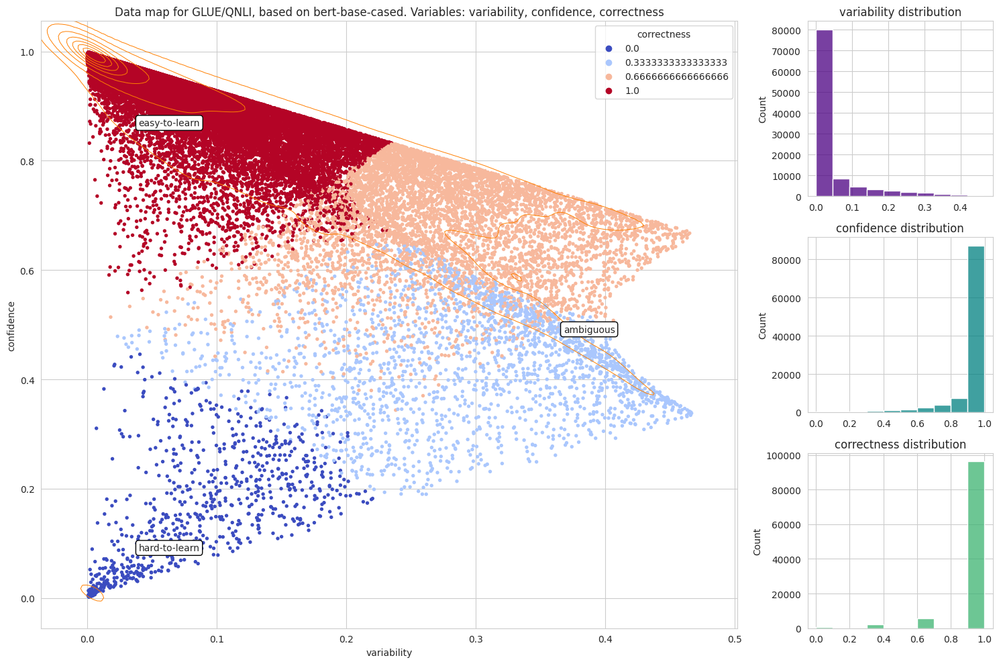

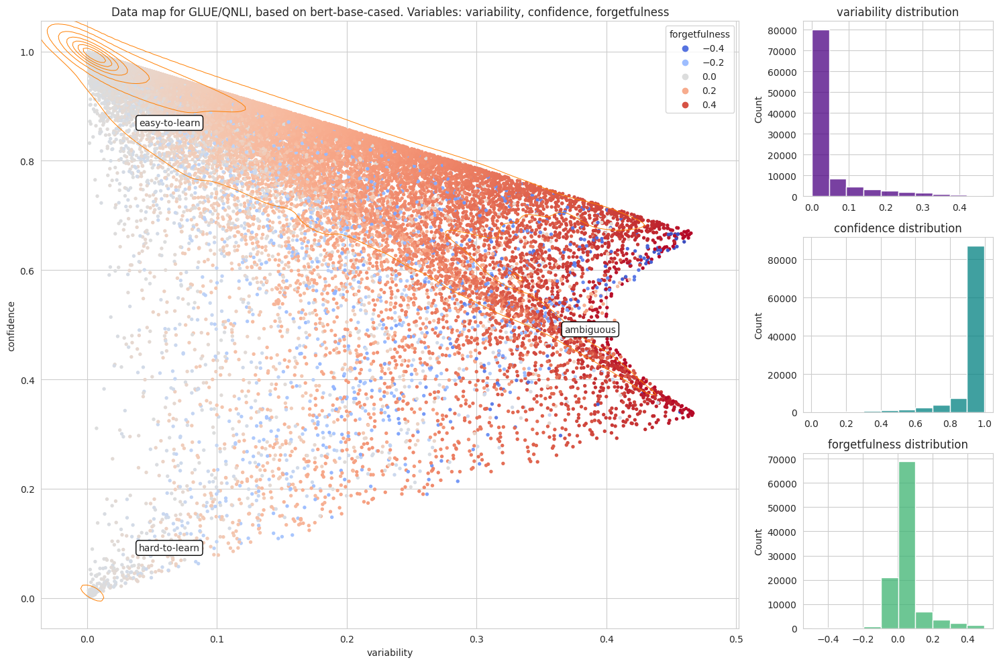

In [ ]:
bert_qnli_model, bert_qnli_dataset_map = run_datamap_training(bert_qnli_hparams)

In [ ]:
print(bert_qnli_model)
print(bert_qnli_dataset_map)

# AlBERT base

In [ ]:
albert_base_qnli_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 64,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'albert-base',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if trianing on full dataset
    # "TRAIN_AMOUNT": 20,
    # "VALIDATION_AMOUNT": 10,
    # "TEST_AMOUNT": 10,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    'SUBSET_TAG': "",

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(albert_base_qnli_hparams)

In [ ]:
albert_base_qnli_model, albert_base_qnli_dataset_map = run_datamap_training(albert_base_qnli_hparams)

Fetching dataset: glue/qnli
Fetching tokenizer for: albert-base
Tokenizer loaded: AlbertTokenizerFast(name_or_path='albert-base-v2', vocab_size=30000, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '[CLS]', 'eos_token': '[SEP]', 'unk_token': '<unk>', 'sep_token': '[SEP]', 'pad_token': '<pad>', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	1: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	2: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	3: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	4: AddedToken("[MASK]", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
<class 'te

Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:34<00:00, 3011.38it/s]



Saving training dynamics to training_dynamics/glue/qnli/albert-base.json.
1637/1637 [==============================] - 1454s 877ms/step - loss: 0.3075 - accuracy: 0.8732 - val_loss: 0.2139 - val_accuracy: 0.9158
Epoch 2/4
1637/1637 [==============================] - ETA: 0s - loss: 0.2103 - accuracy: 0.9188
Epoch has ended! Now calculating gold labels probabilities.

Saving training dynamics at the end of the epoch.


Saving training indexes along with training dynamics to json: 100%|█████████▉| 104742/104743 [00:38<00:00, 2709.07it/s]



Saving training dynamics to training_dynamics/glue/qnli/albert-base.json.
1637/1637 [==============================] - 1441s 881ms/step - loss: 0.2103 - accuracy: 0.9188 - val_loss: 0.2347 - val_accuracy: 0.9081
Epoch 3/4
1193/1637 [====================>.........] - ETA: 3:42 - loss: 0.1605 - accuracy: 0.9396

# DistilBERT on Ambiguous Subset

## Set constants and parameters


In [ ]:
_, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/glue/qnli/roberta-base.json')
train_subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_ambiguous=0.15)

Fetching training dynamics from saved json file: training_dynamics/glue/qnli/roberta-base.json: 100%|██████████| 104743/104743 [00:00<00:00, 562860.64it/s]


Fetching indices of specified training dynamics subset.


In [ ]:
distilbert_0_15amb_from_roberta_base_hparams = {
    "SEED_VALUE": 42,
    "TRAIN_BATCH_SIZE": 128,
    "VALIDATION_BATCH_SIZE": 128,
    "TEST_BATCH_SIZE": 128,
    "DATASET_NAME": 'glue/qnli',
    "MODEL_NAME": 'distilbert-base-cased',
    "EPOCHS": 4,
    "PATIENCE": 3,

    # set amounts to None if training on full dataset
    # "TRAIN_AMOUNT": 2000,
    # "VALIDATION_AMOUNT": 100,
    # "TEST_AMOUNT": 100,
    "TRAIN_AMOUNT": None,
    "VALIDATION_AMOUNT": None,
    "TEST_AMOUNT": None,

    # set specific subset combinations
    "SUBSET_TAG": "0.15_ambiguous_roberta_base", # else, set to "" if training on normal dataset

    # If training has crashed, and we wish to resume, please modify these options accordingly!
    "ALREADY_TRAINED": False,
    "EPOCH_TO_LOAD": 1,
}

setup_model_directories_and_seed(distilbert_0_15amb_from_roberta_base_hparams)

## Run Training

In [ ]:
distilbert_0_15amb_from_roberta_base_qnli_model, distilbert_0_15amb_from_roberta_base_qnli_datamap = run_datamap_training(distilbert_0_15amb_from_roberta_base_hparams, train_subset_indices)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(roberta_large_qnli_model)
print(roberta_large_qnli_dataset_map)

# Testing on Adv Squad

In [ ]:
results_dict = evaluate_model_on_test_set(
    roberta_qnli_hparams['MODEL_DIR'],
    roberta_qnli_hparams['MODEL_NAME'],
    roberta_qnli_hparams['EPOCH_TO_LOAD'],
    roberta_qnli_hparams['DATASET_NAME']
)

Loading pre-trained model.


config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

['1.data-00000-of-00001', '1.index', '2.data-00000-of-00001', '2.index', '3.data-00000-of-00001', '3.index', '4.index', '4.data-00000-of-00001', 'checkpoint']
Initializing model from SAVED DIRECTORY.
Fetching tokenizer for: roberta-base


vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50264: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}.
Fetching dataset: glue/qnli


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/104743 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/glue/qnli/2.0.0.incompleteTH4064/glue-train.tfrecord*...:   0%|          |…

Generating validation examples...:   0%|          | 0/5463 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/glue/qnli/2.0.0.incompleteTH4064/glue-validation.tfrecord*...:   0%|      …

Generating test examples...:   0%|          | 0/5463 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/glue/qnli/2.0.0.incompleteTH4064/glue-test.tfrecord*...:   0%|          | …

Dataset glue downloaded and prepared to /root/tensorflow_datasets/glue/qnli/2.0.0. Subsequent calls will reuse this data.
<class 'tensorflow.python.data.ops.shard_op._ShardDataset'>
Printing 3 examples from dataset: <_ShardDataset element_spec={'idx': TensorSpec(shape=(), dtype=tf.int32, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None), 'question': TensorSpec(shape=(), dtype=tf.string, name=None), 'sentence': TensorSpec(shape=(), dtype=tf.string, name=None)}>
Sample 1: {'idx': <tf.Tensor: shape=(), dtype=int32, numpy=3547>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'How might gravity effects be observed differently according to Newton?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'Newton came to realize that the effects of gravity might be observed in different ways at larger distances.'>}
Sample 2: {'idx': <tf.Tensor: shape=(), dtype=int32, numpy=878>, 'label': <tf.Tensor: shape=(), dty

/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 1.51 seconds
Batching dataset.
Predicting on batches from batched test set.
2/2 [==============================] - 5s 198ms/step


In [ ]:
results_dict

{'accuracy': 0.9102892713291835,
 'precision': 0.9279346210995543,
 'recall': 0.8940586972083036,
 'f1': 0.9106817353262852}

In [ ]:
results_dict_advsquad = evaluate_model_on_test_set(
    roberta_qnli_hparams['MODEL_DIR'],
    roberta_qnli_hparams['MODEL_NAME'],
    roberta_qnli_hparams['EPOCH_TO_LOAD'],
    'adversarial_squad'
)

Loading pre-trained model.
['1.data-00000-of-00001', '1.index', '2.data-00000-of-00001', '2.index', '3.data-00000-of-00001', '3.index', '4.index', '4.data-00000-of-00001', 'checkpoint']
Initializing model from SAVED DIRECTORY.
Fetching tokenizer for: roberta-base
Tokenizer loaded: RobertaTokenizerFast(name_or_path='roberta-base', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	3: AddedToken("<unk>", rstrip=Fal

100%|██████████| 3560/3560 [00:04<00:00, 854.86it/s] 


<class 'tensorflow.python.data.ops.from_tensor_slices_op._TensorSliceDataset'>
{'idx': <tf.Tensor: shape=(), dtype=string, numpy=b'56be4db0acb8001400a502ee'>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'Where did Super Bowl 50 take place?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b"The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California.">, 'label': <tf.Tensor: shape=(), dtype=int32, numpy=0>}
{'idx': <tf.Tensor: shape=(), dtype=string, numpy=b'56bea9923aeaaa14008c91bb'>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'What day was the Super Bowl played on?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b"The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California.">, 'label': <tf.Tensor: shape=(), dtype=int32, numpy=0>}
{'idx': <tf.Tensor: shape=(), dtype=string, numpy=b'56beace93aeaaa14008c91e0'>, 'question': <tf.Tensor: shap

In [ ]:
results_dict_advsquad

{'accuracy': 0.6014044943820225,
 'precision': 0.9345011424219345,
 'recall': 0.479296875,
 'f1': 0.6336173508907824}

In [ ]:
distilbert_results_dict_advsquad = evaluate_model_on_test_set(
    distilbert_qnli_hparams['MODEL_DIR'],
    distilbert_qnli_hparams['MODEL_NAME'],
    distilbert_qnli_hparams['EPOCH_TO_LOAD'],
    'adversarial_squad'
)

Loading pre-trained model.


config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/263M [00:00<?, ?B/s]

['1.index', '1.data-00000-of-00001', '2.data-00000-of-00001', '2.index', '3.data-00000-of-00001', '3.index', '4.data-00000-of-00001', '4.index', 'checkpoint']
Initializing model from SAVED DIRECTORY.
Fetching tokenizer for: distilbert-base-cased


tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

Tokenizer loaded: DistilBertTokenizerFast(name_or_path='distilbert-base-cased', vocab_size=28996, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: AddedToken("[UNK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	101: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	102: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	103: AddedToken("[MASK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}.
Fetching dataset: adversarial_squad
<class 'datasets.arrow_dataset.Dataset'>
Printing 3 examples f

100%|██████████| 3560/3560 [00:01<00:00, 3135.47it/s]
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


<class 'tensorflow.python.data.ops.from_tensor_slices_op._TensorSliceDataset'>
{'idx': <tf.Tensor: shape=(), dtype=string, numpy=b'56be4db0acb8001400a502ee'>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'Where did Super Bowl 50 take place?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b"The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California.">, 'label': <tf.Tensor: shape=(), dtype=int32, numpy=0>}
{'idx': <tf.Tensor: shape=(), dtype=string, numpy=b'56bea9923aeaaa14008c91bb'>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'What day was the Super Bowl played on?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b"The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California.">, 'label': <tf.Tensor: shape=(), dtype=int32, numpy=0>}
{'idx': <tf.Tensor: shape=(), dtype=string, numpy=b'56beace93aeaaa14008c91e0'>, 'question': <tf.Tensor: shap

4/4 [==============================] - 6s 64ms/step


In [ ]:
distilbert_results_dict_advsquad

{'accuracy': 0.28623595505617977,
 'precision': 0.5283582089552239,
 'recall': 0.069140625,
 'f1': 0.122279792746114}

# Testing subset data creation

In [ ]:
def get_data_subset(
        indexes,
        variability,
        confidence,
        correctness,
        forgetfulness,

        p_easytolearn=0.0,
        p_ambiguous=0.0,
        p_hardtolearn=0.0,

        p_random=0.0,

        p_variability=0.0,
        selector_variability='top',
        p_confidence=0.0,
        selector_confidence='top',
        p_correctness=0.0,
        selector_correctness='top',
        p_forgetfulness=0.0,
        selector_forgetfulness='top'):
    """
    Function to select subsets of data based on various criteria.
    """
    length = len(indexes)
    coordinates = np.hstack([np.expand_dims(variability, -1), np.expand_dims(confidence, -1)])
    selected_indices = set()

    # Handling KNN based selectors
    if p_easytolearn or p_ambiguous or p_hardtolearn:
        kdt = KDTree(coordinates, metric='euclidean')
        if p_ambiguous:
            n_ambiguous = int(p_ambiguous * length)
            _, ambiguous_idx = kdt.query([[1, 0.5]], k=n_ambiguous)
            selected_indices.update(indexes[i] for i in ambiguous_idx.flatten())
        if p_easytolearn:
            n_easytolearn = int(p_easytolearn * length)
            _, easy2learn_idx = kdt.query([[0, 1]], k=n_easytolearn)
            selected_indices.update(indexes[i] for i in easy2learn_idx.flatten())
        if p_hardtolearn:
            n_hardtolearn = int(p_hardtolearn * length)
            _, hardtolearn_idx = kdt.query([[0, 0]], k=n_hardtolearn)
            selected_indices.update(indexes[i] for i in hardtolearn_idx.flatten())
        return list(selected_indices)

    # Handling random selection
    if p_random > 0:
        n_random = int(p_random * length)
        random_indices = np.random.choice(indexes, n_random, replace=False)
        selected_indices.update(random_indices)
        return list(selected_indices)

    # Helper function for variability, confidence, correctness, forgetfulness
    def select_top_or_bottom(data, p_value, selector, indexes):
        if p_value > 0:
            n_select = int(p_value * length)
            sorted_idx = np.argsort(data)
            if selector == 'top':
                selected = sorted_idx[-n_select:]
            else:  # bottom
                selected = sorted_idx[:n_select]
            return set(indexes[i] for i in selected)
        return set()

    # Selecting based on variability, confidence, correctness, forgetfulness
    selected_indices.update(select_top_or_bottom(variability, p_variability, selector_variability, indexes))
    selected_indices.update(select_top_or_bottom(confidence, p_confidence, selector_confidence, indexes))
    selected_indices.update(select_top_or_bottom(correctness, p_correctness, selector_correctness, indexes))
    selected_indices.update(select_top_or_bottom(forgetfulness, p_forgetfulness, selector_forgetfulness, indexes))

    return list(selected_indices)

In [ ]:
gold_labels_probabilities, confidence, variability, correctness, forgetfulness, indexes, td_dict = load_training_dynamics_from_json('training_dynamics/glue/qnli/roberta-base.json')

Fetching training dynamics from saved json file: training_dynamics/glue/qnli/roberta-base.json: 100%|██████████| 104743/104743 [00:00<00:00, 383637.14it/s]


In [ ]:
for i, (id, v,c,g) in enumerate(zip(indexes, variability, confidence, gold_labels_probabilities)):
    if id in [76961, 15779, 71174, 11432, 99514, 92560, 54807, 86520, 81306, 65342]:
        print(i,id, v,c,g)


8583 99514 0.45858737532777716 0.5142354629933834 [0.98086768 0.96424073 0.03533746 0.07649598]
11595 76961 0.47350573878787244 0.5173496985808015 [0.9908728  0.98969978 0.07723056 0.01159566]
33457 65342 0.4760333442860037 0.486614300403744 [0.92793697 0.99613613 0.01091356 0.01147054]
37905 81306 0.4559457646941437 0.5169572267914191 [0.95765132 0.9842726  0.12087758 0.00502741]
39530 92560 0.4185284461727355 0.560908380895853 [0.9880932  0.94689244 0.29319775 0.01545013]
40046 15779 0.4217803866380165 0.5790512283565477 [0.97931254 0.98725826 0.34502599 0.00460813]
64015 86520 0.44855908579093656 0.5427474547177553 [0.99306375 0.98862457 0.12336077 0.06594073]
71677 11432 0.45001953429333774 0.5344741004519165 [0.98805922 0.9749018  0.16069627 0.01423912]
77675 71174 0.4734521083785834 0.48900486406637356 [0.94167429 0.98262286 0.02869296 0.00302934]
95089 54807 0.47766241574100315 0.49453637399710715 [0.98074144 0.96342558 0.02904224 0.00493624]


In [ ]:
subset_indices = get_data_subset(indexes, variability, confidence, correctness, forgetfulness, p_forgetfulness=0.0001, selector_forgetfulness='bottom')

In [ ]:
subset_indices

[76961, 15779, 71174, 11432, 99514, 92560, 54807, 86520, 81306, 65342]

In [ ]:
td_dict['4']

{'gold_label_probs': [0.005289348773658276,
  0.0056094215251505375,
  0.003174918470904231,
  0.002473597414791584],
 'confidence': 0.004136821546126157,
 'variability': 0.0013405634771990957,
 'correctness': 0.0,
 'forgetfulness': -0.0010881757130846395}

In [ ]:
tmp_train_unshuffled, tmp_train, tmp_validation, tmp_test = get_datasets('glue/qnli', subset_indices)

Fetching dataset: glue/qnli


In [ ]:
for d in tmp_train_unshuffled:
    print(d)

{'idx': <tf.Tensor: shape=(), dtype=int32, numpy=99514>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b"How many citizen's were in the year 2000 census?">, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'As of the census of 2000, there are 84,084 people, 44,497 households, and 16,775 families in the city.'>}
{'idx': <tf.Tensor: shape=(), dtype=int32, numpy=76961>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=0>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'Where are the semi finals played?'>, 'sentence': <tf.Tensor: shape=(), dtype=string, numpy=b'The semi-finals have been played exclusively at the rebuilt Wembley Stadium since 2008, one year after it opened and after it had already hosted a final (in 2007).'>}
{'idx': <tf.Tensor: shape=(), dtype=int32, numpy=65342>, 'label': <tf.Tensor: shape=(), dtype=int64, numpy=1>, 'question': <tf.Tensor: shape=(), dtype=string, numpy=b'Which administration call

In [ ]:
def distill(datamap: np.ndarray, n_ambiguous: int, n_easy2learn: int):
    """
    Get the indices of a distilled dataset
    """
    kdt = KDTree(datamap, metric='euclidean')

    if n_ambiguous:
        _, ambiguous_idx = kdt.query([[1, 0.5]],
                                 k=n_ambiguous)

    if n_easy2learn:
        _, easy2learn_idx = kdt.query([[0, 1]],
                                      k=n_easy2learn)

        return np.hstack([ambiguous_idx, easy2learn_idx])

    return ambiguous_idx

In [ ]:

# Distill bert
bert_distilled_idx = distill(bert_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
np.random.shuffle(bert_distilled_idx)

# Distill roberta
roberta_distilled_idx = distill(roberta_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
np.random.shuffle(roberta_distilled_idx)

# # Distill sdsn
# sdsn_distilled_idx = distill(sdsn_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
# np.random.shuffle(sdsn_distilled_idx)

# Blockage

In [ ]:
if 'TRAIN_AMOUNT' in hparams:
    train_amount = hparams['TRAIN_AMOUNT']
    train = convert_dataset(train_raw.take(train_amount), tokenizer, hparams['DATASET_NAME'])
    train_unshuffled = convert_dataset(train_unshuffled_raw.take(train_amount), tokenizer, hparams['DATASET_NAME'])
else:
    train = convert_dataset(train_raw, tokenizer, hparams['DATASET_NAME'])
    train_unshuffled = convert_dataset(train_unshuffled_raw, tokenizer, hparams['DATASET_NAME'])

train_batched = batch_dataset(train, hparams['TRAIN_BATCH_SIZE'])
train_unshuffled_batched = batch_dataset(train_unshuffled, hparams['TRAIN_BATCH_SIZE'])

if 'VALIDATION_AMOUNT' in hparams:
    validation_amount = hparams['VALIDATION_AMOUNT']
    validation = convert_dataset(validation_raw.take(validation_amount), tokenizer, hparams['DATASET_NAME'])
else:
    validation = convert_dataset(validation_raw, tokenizer, hparams['DATASET_NAME'])

validation_batched = batch_dataset(validation, hparams['VALIDATION_BATCH_SIZE'])

if 'TEST_AMOUNT' in hparams:
    test_amount = hparams['TEST_AMOUNT']
    test = convert_dataset(test_raw.take(test_amount), tokenizer, hparams['DATASET_NAME'])
else:
    test = convert_dataset(test_raw, tokenizer, hparams['DATASET_NAME'])

test_batched = batch_dataset(test, hparams['VALIDATION_BATCH_SIZE'])


Fetching dataset: glue/qnli
Fetching tokenizer for: distilbert-base-cased
Converting examples to features. Length of dataset: 20


/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 0.31 seconds
Batching dataset.
Converting examples to features. Length of dataset: 20
Time taken: 0.27 seconds
Batching dataset.
Converting examples to features. Length of dataset: 20
Time taken: 0.23 seconds
Batching dataset.
Converting examples to features. Length of dataset: 20
Time taken: 0.23 seconds
Batching dataset.


In [ ]:
pretrained_model = get_model(hparams['MODEL_DIR'], hparams['MODEL_NAME'])

if hparams['ALREADY_TRAINED']:
    gold_labels_probabilities, _, _, _, _ = load_training_dynamics_from_json(hparams['TRAINING_DYNAMICS_FILE'])
else:
    gold_labels_probabilities = None

# Here we batch the dataset but without prefetching
dataset_map = get_dataset_map(train_unshuffled, hparams['VALIDATION_BATCH_SIZE'], gold_labels_probabilities)
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(hparams['MODEL_DIR'], '{epoch}'),
    save_weights_only=True,
    save_best_only=False,  # False if we want to save epoch at every time step
    save_freq='epoch'
)
callbacks = [
    dataset_map,
    tf.keras.callbacks.EarlyStopping(patience=2),
    model_checkpoint_callback
]
model = initialize_model(pretrained_model, hparams['MODEL_DIR'], hparams['MODEL_NAME'], dataset_map)

Loading pre-trained models.
Initiatializing DataMapCallback.
No model previously trained for distilbert-base-cased. Initializing a new one.


In [ ]:
# Fit
model.fit(
    train_batched,
    epochs=3,
    validation_data=validation_batched,
    callbacks=callbacks
)

Epoch 1/3
      1/Unknown - 21s 21s/step - loss: 0.6871 - accuracy: 0.6000
Epoch has ended! Now calculating gold labels probabilities.

1/1 [==============================] - 33s 33s/step - loss: 0.6871 - accuracy: 0.6000 - val_loss: 0.6882 - val_accuracy: 0.5500
Epoch 2/3
1/1 [==============================] - ETA: 0s - loss: 0.6581 - accuracy: 0.6000
Epoch has ended! Now calculating gold labels probabilities.

1/1 [==============================] - 13s 13s/step - loss: 0.6581 - accuracy: 0.6000 - val_loss: 0.6884 - val_accuracy: 0.5500
Epoch 3/3
1/1 [==============================] - ETA: 0s - loss: 0.6474 - accuracy: 0.6000
Epoch has ended! Now calculating gold labels probabilities.

1/1 [==============================] - 11s 11s/step - loss: 0.6474 - accuracy: 0.6000 - val_loss: 0.6888 - val_accuracy: 0.5500


In [ ]:
save_training_dynamics(dataset_map, train_unshuffled_raw, hparams["MODEL_NAME"])

Saving training default dataset to json:   0%|          | 19/104743 [00:00<16:32, 105.51it/s]


In [ ]:
# Evaluate performance on test set
results = pd.DataFrame(index=['100% Train'],
                       columns=['DistilBERT'],
                       data=[model.evaluate(test_batched)[1]*100])

results

22/22 [==============================] - 11s 507ms/step - loss: 0.6930 - accuracy: 0.5115


,DistilBERT
100% Train,51.153421


## OLD

## (OLD) Helper functions

In [ ]:
def plot_datamap(
        var1, # x axis
        var2, # y axis
        var3, # (z axis)
        var1_name='variability',
        var2_name='confidence',
        var3_name='correctness',
        dataset_name='qnli',
        model_name='DistilBERT-base'
    ):

    # Adjusting the layout to match the provided example
    graph_title = f"Data map for {dataset_name.upper()}, based on {model_name}. Variables: {var1_name}, {var2_name}, {var3_name}"
    graph_save_name = f"datamap_{dataset_name.upper()}_{model_name}_v1{var1_name}_v2{var2_name}_v3{var3_name}"


    # Creating a new figure with a 3x4 grid
    fig = plt.figure(figsize=(15, 10))
    gs = fig.add_gridspec(3, 4)

    # Main scatter plot with KDE will occupy the first 3x3 grid
    ax_main = fig.add_subplot(gs[:, :3])
    cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
    sns.scatterplot(x=var1, y=var2, hue=var3, palette=cmap, size=0.7, legend='auto', ax=ax_main, edgecolor='none')
    sns.kdeplot(x=var1, y=var2,
                levels=8, color=sns.color_palette("Paired")[7], linewidths=0.5, ax=ax_main)

    ax_main.set(title=graph_title,
                xlabel=var1_name, ylabel=var2_name,
                #xlim=(-0.005, 0.505), ylim=(-0.005, 1.005)
                )

    # Annotations
    box_style = {'boxstyle': 'round', 'facecolor': 'white', 'ec': 'black'}
    ax_main.text(0.14, 0.84, 'easy-to-learn', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.text(0.75, 0.5, 'ambiguous', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.text(0.14, 0.14, 'hard-to-learn', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.legend(title=var3_name)

    # Confidence distribution plot will occupy the top-right grid
    ax_confidence = fig.add_subplot(gs[0, 3])
    sns.histplot(var1, bins=10, ax=ax_confidence, color='indigo')
    ax_confidence.set(title=f'{var1_name} distribution')

    # Variability distribution plot will occupy the middle-right grid
    ax_variability = fig.add_subplot(gs[1, 3])
    sns.histplot(var2, bins=10, ax=ax_variability, color='teal')
    ax_variability.set(title=f'{var2_name} distribution')

    # Correctness distribution plot will occupy the bottom-right grid
    ax_correctness = fig.add_subplot(gs[2, 3])
    sns.histplot(var3, bins=10, ax=ax_correctness, color='mediumseagreen')
    ax_correctness.set(title=f'{var3_name} distribution')

    # Adjusting layout
    plt.tight_layout()
    plt.savefig(f'images/{graph_save_name}')

    return fig

In [ ]:
def run_datamap_training(hparams):
    # =======================================
    # PREPARE DATA
    # - fetching dataset
    # - converting using tokenizer
    # - batching
    # =======================================
    train_unshuffled_raw, train_raw, validation_raw, test_raw = get_datasets(hparams['DATASET_NAME'])

    tokenizer = get_tokenizer(hparams['MODEL_NAME'])

    if hparams['TRAIN_AMOUNT']:
        train_amount = hparams['TRAIN_AMOUNT']
        train = convert_dataset(train_raw.take(train_amount), tokenizer, hparams['DATASET_NAME'])
        train_unshuffled = convert_dataset(train_unshuffled_raw.take(train_amount), tokenizer, hparams['DATASET_NAME'])
    else:
        train = convert_dataset(train_raw, tokenizer, hparams['DATASET_NAME'])
        train_unshuffled = convert_dataset(train_unshuffled_raw, tokenizer, hparams['DATASET_NAME'])

    train_batched = batch_dataset(train, hparams['TRAIN_BATCH_SIZE'])
    train_unshuffled_batched = batch_dataset(train_unshuffled, hparams['TRAIN_BATCH_SIZE'])

    if hparams['VALIDATION_AMOUNT']:
        validation_amount = hparams['VALIDATION_AMOUNT']
        validation = convert_dataset(validation_raw.take(validation_amount), tokenizer, hparams['DATASET_NAME'])
    else:
        validation = convert_dataset(validation_raw, tokenizer, hparams['DATASET_NAME'])

    validation_batched = batch_dataset(validation, hparams['VALIDATION_BATCH_SIZE'])

    if hparams['TEST_AMOUNT']:
        test_amount = hparams['TEST_AMOUNT']
        test = convert_dataset(test_raw.take(test_amount), tokenizer, hparams['DATASET_NAME'])
    else:
        test = convert_dataset(test_raw, tokenizer, hparams['DATASET_NAME'])

    test_batched = batch_dataset(test, hparams['TEST_BATCH_SIZE'])


    # =======================================
    # PREPARE MODEL
    # - load pre-trained model
    # - initialize datamap callback object
    # - initialize model (including optimizer, loss objective, loading from checkpoint)
    # =======================================
    pretrained_model = get_model(hparams['MODEL_DIR'], hparams['MODEL_NAME'])

    if hparams['ALREADY_TRAINED']:
        gold_labels_probabilities, _, _, _, _ = load_training_dynamics_from_json(hparams['TRAINING_DYNAMICS_FILE'])
    else:
        gold_labels_probabilities = None

    # Here we batch the dataset but without prefetching
    dataset_map = get_dataset_map(train_unshuffled, hparams['VALIDATION_BATCH_SIZE'], gold_labels_probabilities)
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(hparams['MODEL_DIR'], '{epoch}'),
        save_weights_only=True,
        save_best_only=False,  # False if we want to save epoch at every time step
        save_freq='epoch'
    )
    callbacks = [
        dataset_map,
        tf.keras.callbacks.EarlyStopping(patience=hparams['PATIENCE']),
        model_checkpoint_callback
    ]
    model = initialize_model(pretrained_model, hparams['MODEL_DIR'], hparams['MODEL_NAME'], dataset_map)

    # =======================================
    # TRAIN MODEL
    # - includes automatic checkpoint saving
    # =======================================
    model.fit(
        train_batched,
        epochs=hparams['EPOCHS'],
        validation_data=validation_batched,
        callbacks=callbacks
    )

    # =======================================
    # TEST MODEL
    # =======================================
    results = pd.DataFrame(index=['100% Train'],
                        columns=['DistilBERT'],
                        data=[model.evaluate(test_batched)[1]*100])
    print(results)

    # =======================================
    # SAVE TRAINING DYNAMICS
    # =======================================
    #save_training_dynamics(dataset_map, train_unshuffled_raw, hparams["MODEL_NAME"])

    # =======================================
    # PLOT DATAMAPS
    # =======================================
    # using correctness
    datamap = plot_datamap(
        bert_dataset_map.variability,
        bert_dataset_map.confidence,
        bert_dataset_map.correctness,
        var1_name='variability',
        var2_name='confidence',
        var3_name='correctness',
        model_name=hparams['MODEL_NAME']
    )

    datamap.show()

    # using forgetfulness
    datamap = plot_datamap(
        bert_dataset_map.variability,
        bert_dataset_map.confidence,
        bert_dataset_map.forgetfulness,
        var1_name='variability',
        var2_name='confidence',
        var3_name='forgetfulness',
        model_name=['MODEL_NAME']
    )

    datamap.show()

In [ ]:
def get_samples_by_index(dataset: tf.data.Dataset, indices: List[int]) -> List[dict]:
    """
    Get samples by their index

    :param dataset:
    :param indices:
    :return:
    """

    # Convert to tensor
    indices_ = tf.convert_to_tensor(indices, dtype=tf.int32)

    samples = list()
    for sample in dataset.filter(lambda x: tf.reduce_any(tf.equal(x['idx'], indices_))).as_numpy_iterator():
        sample['question'], sample['sentence'] = sample['question'].decode(), sample['sentence'].decode()
        samples.append(sample)

        # Early stop
        if len(samples) == len(indices):
            break

    return samples

class InnerDict(TypedDict):
    gold_label_probs: List[float]
    confidence: float
    variability: float
    correctness: float
    forgetfulness: float

TrainingDynamicsDictType = Dict[str, InnerDict]

def get_training_dynamics_by_index(training_dynamics: TrainingDynamicsDictType, indices: List[int]) -> TrainingDynamicsDictType:
    return {k: v for k, v in training_dynamics.items() if int(k) in indices}

def get_samples_and_training_dynamics_by_index(dataset: tf.data.Dataset, training_dynamics: TrainingDynamicsDictType, indices: List[int]):
    return get_samples_by_index(dataset, indices), get_training_dynamics_by_index(training_dynamics, indices)

def save_training_dynamics(tdd_map, reference_set, tag):
    gold_label_probs = tdd_map.gold_labels_probabilities
    confidence = tdd_map.confidence
    variability = tdd_map.variability
    correctness = tdd_map.correctness
    forgetfulness = tdd_map.forgetfulness
    # For partial dataset training, track the count to limit when to stop looping over reference_set
    dataset_map_length = len(gold_label_probs)

    # MUST MAKE ABSOLUTE SURE
    json_dict = {}
    for i, example in enumerate(tqdm(tfds.as_numpy(reference_set), desc='Saving training default dataset to json')):
        idx = convert_numpy(example["idx"])
        json_dict[idx] = {
            "gold_label_probs": convert_numpy(gold_label_probs[i]),
            "confidence": confidence[i],
            "variability": variability[i],
            "correctness": correctness[i],
            "forgetfulness": forgetfulness[i],
        }

        if i == (dataset_map_length-1):
            break

    with open(f'training_dynamics/{tag}.json', 'w') as file:
        # Dump the list of dictionaries to the file
        json.dump(json_dict, file)

def pretty_print_samples(samples: List[dict], title: Optional[str]):
    """
    Print samples as Markdown

    :param samples: Samples to print
    :param title: Title
    :return:
    """

    # Convert samples to markdown
    samples_as_markdown = list()
    for sample in samples:
        samples_as_markdown.append(f"""
 - **Question**: {sample['question']}

   **Sentence**: {sample['sentence']}

   **Label**: {'True' if sample['label'] == 0 else 'False'}


""")
    samples_as_markdown = "\n".join(samples_as_markdown)

    markdown_output = f"""
### {title}
{samples_as_markdown}
"""

    display(Markdown(markdown_output))

def convert_numpy(obj):
    if isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, bytes):
        return obj.decode('utf-8')
    else:
        return obj

def extract_by_training_dynamics(datamap: np.ndarray,
                                 n_ambiguous: int = 0,
                                 n_easy2learn: int = 0,
                                 n_hard2learn: int = 0) -> Tuple[list, list, list]:
    """
    Extract indices of different types of samples

    :param datamap: Datamap
    :param n_ambiguous: Number of ambiguous samples to extract
    :param n_easy2learn: Number of easy-to-learn samples to extract
    :param n_hard2learn: Number of hard-to-learn samples to extract
    :return: Three lists of ambiguous, easy-to-learn and hard-to-learn indices
    """

    kdt = KDTree(datamap, metric='euclidean')
    ambiguous = list()
    easy2learn = list()
    hard2learn = list()

    if n_easy2learn:
        _, easy2learn = kdt.query([[0, 1]],
                                  k=n_easy2learn)

    if n_ambiguous:
        _, ambiguous = kdt.query([[1, 0.5]],
                                 k=n_ambiguous)

    if n_hard2learn:
        _, hard2learn = kdt.query([[0, 0]],
                                  k=n_hard2learn)

    return list(ambiguous[0]), list(easy2learn[0]), list(hard2learn[0])

def load_training_dynamics_from_json(path_to_json):
    with open(path_to_json, 'r') as file:
        training_dynamics_dict = json.load(file)

    gold_labels_probabilities = []
    confidences = []
    variabilities = []
    correctnesses = []
    forgetfulnesses = []
    for idx, td_dict in tqdm(training_dynamics_dict.items(), desc=f'Fetching training dynamics from saved json file: {path_to_json}'):
        gold_labels_probabilities.append(td_dict['gold_label_probs'])
        confidences.append(td_dict['confidence'])
        variabilities.append(td_dict['variability'])
        correctnesses.append(td_dict['correctness'])
        forgetfulnesses.append(td_dict['forgetfulness'])

    gold_labels_probabilities = np.array(gold_labels_probabilities)


    return gold_labels_probabilities, confidences, variabilities, correctnesses, forgetfulnesses

In [ ]:
# Load datasets
train_unshuffled = tfds.load('glue/qnli', split='train', shuffle_files=False, try_gcs=False)
train, info = tfds.load('glue/qnli', split='train', shuffle_files=True, with_info=True)
validation_ = tfds.load('glue/qnli', split='validation', shuffle_files=True)

# using sharded validation set only
validation = validation_.shard(2, index=0)  # Split validation into test and validation
test = validation_.shard(2, index=1)

# using validation and test set from tensorflow dataset
# why is test not working?
# validation = validation_
# test = tfds.load('glue/qnli', split='test', shuffle_files=True)

# Prepare datasets for Huggingface's transformers
bert_tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-cased')
roberta_tokenizer = RobertaTokenizerFast.from_pretrained("roberta-base")

In [ ]:
# Save unshuffled training data to json
json_train_unshuffled_dicts = []
for i, example in enumerate(tqdm(tfds.as_numpy(train_unshuffled), desc='Saving unshuffled training dataset to json')):
    json_train_unshuffled_dicts.append(
        {k: convert_numpy(v) for k, v in example.items()}
    )

# Save shuffled training data to json
json_train_dicts = []
for i, example in enumerate(tqdm(tfds.as_numpy(train), desc='Saving shuffled training dataset to json')):
    json_train_dicts.append(
        {k: convert_numpy(v) for k, v in example.items()}
    )

# Save validation data to json
json_validation_dicts = []
for i, example in enumerate(tqdm(tfds.as_numpy(validation), desc='Saving shuffled validation dataset to json')):
    json_validation_dicts.append(
        {k: convert_numpy(v) for k, v in example.items()}
    )

# Save test data to json
json_test_dicts = []
for i, example in enumerate(tqdm(tfds.as_numpy(test), desc='Saving shuffled testing dataset to json')):
    json_test_dicts.append(
        {k: convert_numpy(v) for k, v in example.items()}
    )

Saving shuffled testing dataset to json: 100%|██████████| 2731/2731 [00:00<00:00, 3282.42it/s]


In [ ]:
with open('data/train_shuffled.json', 'w') as file:
    # Dump the list of dictionaries to the file
    json.dump(json_train_dicts, file)

with open('data/train_unshuffled.json', 'w') as file:
    # Dump the list of dictionaries to the file
    json.dump(json_train_unshuffled_dicts, file)

with open('data/validation.json', 'w') as file:
    # Dump the list of dictionaries to the file
    json.dump(json_validation_dicts, file)

with open('data/test.json', 'w') as file:
    # Dump the list of dictionaries to the file
    json.dump(json_test_dicts, file)

In [ ]:
# Count the number of examples in the train dataset
train_size = sum(1 for _ in train)

# Count the number of examples in the validation dataset
validation_size = sum(1 for _ in validation)

print(f"Train dataset size: {train_size}")
print(f"Validation dataset size: {validation_size}")

Train dataset size: 104743
Validation dataset size: 2732


In [ ]:
for example in train.take(3):
    # Print each key and value
    for key, value in example.items():
        print(f"{key}: {value}")
    print()

idx: 16399
label: 0
question: b'The period of time from 1200 to 1000 BCE is known as what?'
sentence: b'In the Iron Age'

idx: 1680
label: 0
question: b"Who was the London Weekend Television's managing director?"
sentence: b'The managing director of London Weekend Television (LWT), Greg Dyke, met with the representatives of the "big five" football clubs in England in 1990.'

idx: 103740
label: 0
question: b'What percentage of Swiss people claimed no church affiliation in 2012?'
sentence: b'21.4% in 2012 declared themselves as unchurched i.e. not affiliated with any church or other religious body (Agnostic, Atheist, or just not related to any official religion).'



In [ ]:
train = train
train_unshuffled = train_unshuffled
validation = validation

In [ ]:
# ========================================
# BERT DATA
# ========================================

start = time.time()
print(f"Using berttokenizer to convert {len(train)} train data.")
bert_train = glue_convert_examples_to_features(train, bert_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

start = time.time()
print(f"Using berttokenizer to convert {len(train_unshuffled)} train_unshuffled data.")
bert_train_unshuffled = glue_convert_examples_to_features(train_unshuffled, bert_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

start = time.time()
print(f"Using berttokenizer to convert {len(validation)} validation data.")
bert_validation = glue_convert_examples_to_features(validation, bert_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

start = time.time()
print(f"Using bert_tokenizer to convert {len(test)} test data.")
bert_test = glue_convert_examples_to_features(test, bert_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

# ========================================
# ROBERTA DATA
# ========================================


start = time.time()
print(f"Using roberta_tokenizer to convert {len(train)} train data.")
roberta_train = glue_convert_examples_to_features(train, roberta_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

start = time.time()
print(f"Using roberta_tokenizer to convert {len(train_unshuffled)} train_unshuffled data.")
roberta_train_unshuffled = glue_convert_examples_to_features(train_unshuffled, roberta_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

start = time.time()
print(f"Using roberta_tokenizer to convert {len(validation)} validation data.")
roberta_validation = glue_convert_examples_to_features(validation, roberta_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

start = time.time()
print(f"Using roberta_tokenizer to convert {len(test)} test data.")
roberta_test = glue_convert_examples_to_features(test, roberta_tokenizer, max_length=128, task='qnli')
print(f"Time taken: {time.time() - start:.2f} seconds")

Using berttokenizer to convert 104743 train data.


/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


Time taken: 191.64 seconds
Using berttokenizer to convert 104743 train_unshuffled data.
Time taken: 135.88 seconds
Using berttokenizer to convert 2732 validation data.
Time taken: 3.06 seconds
Using roberta_tokenizer to convert 104743 train data.
Time taken: 49.01 seconds
Using roberta_tokenizer to convert 104743 train_unshuffled data.
Time taken: 62.80 seconds
Using roberta_tokenizer to convert 2732 validation data.
Time taken: 1.22 seconds


In [ ]:
# Adjusted dataset preparation
bert_validation = bert_validation.batch(128).prefetch(1)
bert_train = bert_train.shuffle(1000).batch(32).prefetch(1)
roberta_validation = roberta_validation.batch(128).prefetch(1)
roberta_train = roberta_train.shuffle(1000).batch(32).prefetch(1)

In [ ]:
# Test sets
bert_test = glue_convert_examples_to_features(test, bert_tokenizer, max_length=128, task='qnli')
bert_test = bert_test.batch(128).prefetch(1)
roberta_test = glue_convert_examples_to_features(test, roberta_tokenizer, max_length=128, task='qnli')
roberta_test = roberta_test.batch(128).prefetch(1)

In [ ]:
# Dataset checkpoints
bert_best_weights_path = tempfile.NamedTemporaryFile()
roberta_best_weights_path = tempfile.NamedTemporaryFile()
sdsn_best_weights_path = tempfile.NamedTemporaryFile()

## Dataset info

In [ ]:
print(info)

tfds.core.DatasetInfo(
    name='glue',
    full_name='glue/qnli/2.0.0',
    description="""
    GLUE, the General Language Understanding Evaluation benchmark
    (https://gluebenchmark.com/) is a collection of resources for training,
    evaluating, and analyzing natural language understanding systems.
    """,
    config_description="""
    The Stanford Question Answering Dataset is a question-answering
    dataset consisting of question-paragraph pairs, where one of the sentences in the paragraph (drawn
    from Wikipedia) contains the answer to the corresponding question (written by an annotator). We
    convert the task into sentence pair classification by forming a pair between each question and each
    sentence in the corresponding context, and filtering out pairs with low lexical overlap between the
    question and the context sentence. The task is to determine whether the context sentence contains
    the answer to the question. This modified version of the original task rem

_Notice_: When the label is 0, it means the sentence (answer) does match the question. **0 = right, 1 = wrong.**

# Bert

## Train model

In [ ]:
MODEL_NAME = 'distilbert-base-cased'
MODEL_DIR = f'models/{MODEL_NAME}'
TRAINING_DYNAMICS_FILE = f'training_dynamics/{MODEL_NAME}.json'
BATCH_SIZE = 128

In [ ]:
bert = TFDistilBertForSequenceClassification.from_pretrained(MODEL_NAME)
gold_labels_probabilities = None
if os.path.exists(MODEL_DIR) and os.listdir(MODEL_DIR):
    dirs_inside_model_dir = [d for d in os.listdir(MODEL_DIR) if os.path.isdir(os.path.join(MODEL_DIR, d))]

    if len(dirs_inside_model_dir) == 1: # grab the saved checkpoint
        checkpoint_dir = dirs_inside_model_dir[0]
        print(f'Loading from saved checkpoint. Found model checkpoint: {checkpoint_dir}')
        best_checkpoint_dir = os.path.join(MODEL_DIR, checkpoint_dir)
        bert.load_weights(best_checkpoint_dir)

        # this also means that gold labels probabilities have been calculated for a few epochs already
        print(f'Loading training dynamics from file: {checkpoint_dir}')
        gold_labels_probabilities, _, _, _, _ = load_training_dynamics_from_json(TRAINING_DYNAMICS_FILE)



    else:
        raise ValueError("There should be exactly one directory inside MODEL_DIR for loading the model weights. Please specify which one is to be loaded.")
else:
    print('No trained model found, initializing from scratch.')




No trained model found, initializing from scratch.


In [ ]:
# Compile model
bert_dataset_map = tdd.DataMapCallback(bert_train_unshuffled.batch(BATCH_SIZE),
                                        outputs_to_probabilities=lambda x: tf.nn.softmax(x[0]), # Model outputs a tuple, where the logits are at the first index
                                        sparse_labels=True,
                                        gold_labels_probabilities=gold_labels_probabilities)

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=os.path.join(MODEL_DIR, '{epoch}'),
    save_weights_only=True,
    save_best_only=False, # False if we want to save epoch at every time step
    save_freq='epoch'
)

callbacks = [bert_dataset_map,
             tf.keras.callbacks.EarlyStopping(patience=2),
             model_checkpoint_callback]

# optimizer = tf.keras.optimizers.Adam(
#     learning_rate=3e-5,
#     beta_1=0.9,
#     beta_2=0.999,
#     epsilon=1e-07,
#     amsgrad=False,
#     name='Adam',
# )
optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
bert.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

In [ ]:
# Fit
bert.fit(
    bert_train,
    epochs=8,
    validation_data=bert_validation,
    callbacks=callbacks
)

Epoch 1/8
   3274/Unknown - 547s 159ms/step - loss: 0.4141 - accuracy: 0.8145Epoch has ended! Now calculating gold labels probabilities.
3274/3274 [==============================] - 880s 260ms/step - loss: 0.4141 - accuracy: 0.8145 - val_loss: 0.3369 - val_accuracy: 0.8561
Epoch 2/8
3274/3274 [==============================] - 837s 255ms/step - loss: 0.2727 - accuracy: 0.8878 - val_loss: 0.3209 - val_accuracy: 0.8679
Epoch 3/8
3274/3274 [==============================] - 843s 257ms/step - loss: 0.1689 - accuracy: 0.9343 - val_loss: 0.3872 - val_accuracy: 0.8627
Epoch 4/8
3274/3274 [==============================] - 838s 256ms/step - loss: 0.1032 - accuracy: 0.9621 - val_loss: 0.4340 - val_accuracy: 0.8712


In [ ]:
saved_model_path = 'models/distilbert_base_cased_2epochs'
bert.save(saved_model_path, save_format='tf')

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-136-625afad976d1>", line 2, in <cell line: 2>
    bert.save(saved_model_path, save_format='tf')
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/lib/io/file_io.py", line 513, in recursive_create_dir_v2
    _pywrap_file_io.RecursivelyCreateDir(compat.path_to_bytes(path))
tensorflow.python.framework.errors_impl.FailedPreconditionError: models; Transport endpoint is not connected

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb 

In [ ]:
save_training_dynamics(bert_dataset_map, train_unshuffled, 'distilbert_cased_train_all_callback_all_training_dynamics') # also include epoch?

Saving training default dataset to json: 100%|██████████| 104743/104743 [00:34<00:00, 3014.45it/s]


# Roberta

## Load model

In [ ]:
roberta = TFRobertaForSequenceClassification.from_pretrained('distilroberta-base')
roberta_init_weights_path = tempfile.NamedTemporaryFile()
roberta.save_weights(roberta_init_weights_path.name)

config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/331M [00:00<?, ?B/s]

## Train model

In [ ]:
# Compile model
roberta_dataset_map = tdd.DataMapCallback(roberta_train_unshuffled.batch(128),
                                                   outputs_to_probabilities=lambda x: tf.nn.softmax(x[0]), # Model outputs a tuple, where the logits are at the first index
                                                   sparse_labels=True)

optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
callbacks = [roberta_dataset_map,
             tf.keras.callbacks.EarlyStopping(patience=5),
             tf.keras.callbacks.ModelCheckpoint(roberta_best_weights_path.name, save_best_only=True, save_weights_only=True)]

roberta.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

In [ ]:
# Fit
roberta.fit(
    roberta_train,
    epochs=10,
    validation_data=roberta_validation,
    callbacks=callbacks
)

Epoch 1/10
1/1 [==============================] - 45s 45s/step - loss: 0.6636 - accuracy: 0.6000 - val_loss: 0.6880 - val_accuracy: 0.5500
Epoch 2/10
1/1 [==============================] - 0s 384ms/step - loss: 0.6613 - accuracy: 0.6000 - val_loss: 0.6885 - val_accuracy: 0.5500
Epoch 3/10
1/1 [==============================] - 0s 355ms/step - loss: 0.6585 - accuracy: 0.6000 - val_loss: 0.6888 - val_accuracy: 0.5500
Epoch 4/10
1/1 [==============================] - 0s 344ms/step - loss: 0.6609 - accuracy: 0.6000 - val_loss: 0.6882 - val_accuracy: 0.5500
Epoch 5/10
1/1 [==============================] - 5s 5s/step - loss: 0.6706 - accuracy: 0.6000 - val_loss: 0.6855 - val_accuracy: 0.5500
Epoch 6/10
1/1 [==============================] - 7s 7s/step - loss: 0.6410 - accuracy: 0.6000 - val_loss: 0.6820 - val_accuracy: 0.5500
Epoch 7/10
1/1 [==============================] - 5s 5s/step - loss: 0.6378 - accuracy: 0.6000 - val_loss: 0.6789 - val_accuracy: 0.5500
Epoch 8/10
1/1 [==============

In [ ]:
save_training_dynamics(roberta_dataset_map, train_unshuffled, 'distilroberta_training_dynamics')

Saving training default dataset to json: 100%|██████████| 20/20 [00:00<00:00, 124.81it/s]


## Siamese DSN

### Train model

In [ ]:
# Create embedding matrix
embedding_matrix = np.zeros(shape=(vectorizer.vocabulary_size(), wv.vector_size))

oovs = set()  # Count out of vocabulary words
for i, word in enumerate(vectorizer.get_vocabulary()):
    try:
        embedding_matrix[i, :] = wv[word]
    except KeyError:
        oovs.add(word)

In [ ]:
# Model architecture
class SiameseDSN(tf.keras.Model):
    """
    Siamese deep sum network
    """

    def __init__(self, embedding_matrix: np.ndarray):
        super().__init__()

        # Embedding matrix
        self.embedding_matrix = tf.keras.layers.Embedding(
            input_dim=embedding_matrix.shape[0],
            output_dim=embedding_matrix.shape[1],
            embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix),
            trainable=False,
            mask_zero=True)

        # Feed forward layers
        self.hidden1 = tf.keras.layers.Dense(units=128,
                                             kernel_regularizer='l2',
                                             activation='relu',
                                             name='hidden1')
        self.hidden2 = tf.keras.layers.Dense(units=64,
                                             kernel_regularizer='l2',
                                             activation='relu',
                                             name='hidden2')

    @tf.function
    def exp_neg_manhattan_distance(self, left, right):
        """
        Distance metric from the MaLSTM paper
        """
        return tf.math.exp(-tf.reduce_sum(tf.math.abs(left - right), axis=1, keepdims=True))  # shape=(batch_size, 1)

    @tf.function
    def as_class_probability(self, out):
        """
        Convert a single probability output to probability per class
        """

        # Interleave ones and zeros
        ones = tf.ones_like(out)
        zeros = tf.zeros_like(out)
        interleaved = tf.reshape(
            tf.concat([ones[..., tf.newaxis], zeros[..., tf.newaxis]], axis=-1),
            [tf.shape(ones)[0], -1])  # shape=(batch_size, 2)

        # Tile
        out_tiled = tf.tile(out, [1, 2])  # shape=(batch_size, 2)

        # As probabilities per class
        class_probabilities = tf.abs(interleaved - out_tiled)

        return class_probabilities

    def call(self, inputs):
        # Unpack
        question, sentence = inputs['question'], inputs['sentence']  # shape=(batch_size, sequence_length)

        # Embed
        question_mask = self.embedding_matrix.compute_mask(question)  # shape=(batch_size, seq_length)
        question = self.embedding_matrix(question)  # shape=(batch_size, seq_length, emb_dim)
        sentence_mask = self.embedding_matrix.compute_mask(sentence)  # shape=(batch_size, seq_length)
        sentence = self.embedding_matrix(sentence)  # shape=(batch_size, seq_length, emb_dim)

        # Sum along embedding dim
        question = tf.reduce_sum(question, axis=1)  # shape=(batch_size, emb_dim)
        sentence = tf.reduce_sum(sentence, axis=1)  # shape=(batch_size, emb_dim)

        # Feed forward
        question = self.hidden2(self.hidden1(question))  # shape=(batch_size, hidden2_dim)
        sentence = self.hidden2(self.hidden1(sentence))  # shape=(batch_size, hidden2_dim)

        # Calculate distance
        distance = self.exp_neg_manhattan_distance(question, sentence)  # shape=(batch_size, 1)

        # Convert to class probabilities
        return self.as_class_probability(distance)

In [ ]:
sdsn = SiameseDSN(embedding_matrix=embedding_matrix)
sdsn.predict(next(iter(sdsn_train))[0])  # Workaround to initial weights
sdsn_init_weights_path = tempfile.NamedTemporaryFile()
sdsn.save_weights(sdsn_init_weights_path.name)

In [ ]:
# Compile model
sdsn_dataset_map = tvl.learning.DataMapCallback(sdsn_train_unshuffled,
                                                sparse_labels=True)
optimizer = tf.keras.optimizers.Adam()
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
callbacks = [sdsn_dataset_map,
             tf.keras.callbacks.EarlyStopping(patience=5),
             tf.keras.callbacks.ModelCheckpoint(sdsn_best_weights_path.name, save_best_only=True, save_weights_only=True)]

sdsn.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

In [ ]:
sdsn.fit(sdsn_train, epochs=100, validation_data=sdsn_validation, steps_per_epoch=150, callbacks=callbacks)

Epoch 1/100
150/150 [==============================] - 1s 3ms/step - loss: 3.3443 - accuracy: 0.4945 - val_loss: 3.2635 - val_accuracy: 0.4850
Epoch 2/100
150/150 [==============================] - 0s 2ms/step - loss: 2.6991 - accuracy: 0.4842 - val_loss: 2.3056 - val_accuracy: 0.4989
Epoch 3/100
150/150 [==============================] - 0s 2ms/step - loss: 2.3104 - accuracy: 0.4879 - val_loss: 2.1671 - val_accuracy: 0.5018
Epoch 4/100
150/150 [==============================] - 0s 2ms/step - loss: 2.2096 - accuracy: 0.4957 - val_loss: 3.2306 - val_accuracy: 0.4916
Epoch 5/100
150/150 [==============================] - 0s 2ms/step - loss: 2.1700 - accuracy: 0.5033 - val_loss: 2.2072 - val_accuracy: 0.4945
Epoch 6/100
150/150 [==============================] - 0s 2ms/step - loss: 1.9375 - accuracy: 0.4973 - val_loss: 1.8779 - val_accuracy: 0.5139
Epoch 7/100
150/150 [==============================] - 0s 2ms/step - loss: 1.8279 - accuracy: 0.5118 - val_loss: 1.8234 - val_accuracy: 0.5227

Epoch 58/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7504 - accuracy: 0.5786 - val_loss: 0.7565 - val_accuracy: 0.5736
Epoch 59/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7445 - accuracy: 0.5715 - val_loss: 0.7395 - val_accuracy: 0.5802
Epoch 60/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7396 - accuracy: 0.5756 - val_loss: 0.7353 - val_accuracy: 0.5933
Epoch 61/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7373 - accuracy: 0.5699 - val_loss: 0.7298 - val_accuracy: 0.5882
Epoch 62/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7304 - accuracy: 0.5745 - val_loss: 0.7261 - val_accuracy: 0.5827
Epoch 63/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7295 - accuracy: 0.5702 - val_loss: 0.7282 - val_accuracy: 0.5787
Epoch 64/100
150/150 [==============================] - 0s 2ms/step - loss: 0.7242 - accuracy: 0.5715 - val_loss: 0.7244 - val_accuracy:

## 100% Train results

In [ ]:
bert.load_weights(bert_best_weights_path.name)
roberta.load_weights(roberta_best_weights_path.name)
# sdsn.load_weights(sdsn_best_weights_path.name)

NameError: ignored

In [ ]:
# Evaluate performance on test set
results = pd.DataFrame(index=['100% Train'],
                       columns=['DistilBERT'],
                       data=[bert.evaluate(bert_test)[1]*100])

results

22/22 [==============================] - 5s 203ms/step - loss: 0.4954 - accuracy: 0.8605


,DistilBERT
100% Train,86.049068


In [ ]:
# Evaluate performance on test set
results = pd.DataFrame(index=['100% Train'],
                       columns=['DistilRoBERTA', 'DistilBERT'],
                       data=[[roberta.evaluate(roberta_test)[1]*100, bert.evaluate(bert_test)[1]*100]])

results

NameError: ignored

## Plot Data Maps

By now we have in the `*_dataset_map` all the information we need to plot the data map for the QNLI training set, for all models

### DistilBert scatter plot

In [ ]:
def plot_datamap(
        var1, # x axis
        var2, # y axis
        var3, # (z axis)
        var1_name='variability',
        var2_name='confidence',
        var3_name='correctness',
        dataset_name='qnli',
        model_name='DistilBERT-base'
    ):

    # Adjusting the layout to match the provided example
    graph_title = f"Data map for {dataset_name.upper()}, based on {model_name}. Variables: {var1_name}, {var2_name}, {var3_name}"
    graph_save_name = f"datamap_{dataset_name.upper()}_{model_name}_v1{var1_name}_v2{var2_name}_v3{var3_name}"


    # Creating a new figure with a 3x4 grid
    fig = plt.figure(figsize=(15, 10))
    gs = fig.add_gridspec(3, 4)

    # Main scatter plot with KDE will occupy the first 3x3 grid
    ax_main = fig.add_subplot(gs[:, :3])
    # cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
    # sns.scatterplot(x=var1, y=var2, hue=var3, palette=cmap, size=0.7, legend='auto', ax=ax_main, edgecolor='none')

    palette = sns.diverging_palette(220, 20, n=256)
    sns.scatterplot(x=var1, y=var2, hue=var3, palette=palette, size=0.7, legend='auto', ax=ax_main, edgecolor='none')

    sns.kdeplot(x=var1, y=var2,
                levels=8, color=sns.color_palette("Paired")[7], linewidths=0.5, ax=ax_main)

    ax_main.set(title=graph_title,
                xlabel=var1_name, ylabel=var2_name,
                #xlim=(-0.005, 0.505), ylim=(-0.005, 1.005)
                )

    # Annotations
    box_style = {'boxstyle': 'round', 'facecolor': 'white', 'ec': 'black'}
    ax_main.text(0.14, 0.84, 'easy-to-learn', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.text(0.75, 0.5, 'ambiguous', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.text(0.14, 0.14, 'hard-to-learn', transform=ax_main.transAxes, verticalalignment='top', bbox=box_style)
    ax_main.legend(title=var3_name)

    # Confidence distribution plot will occupy the top-right grid
    ax_confidence = fig.add_subplot(gs[0, 3])
    sns.histplot(var1, bins=10, ax=ax_confidence, color='indigo')
    ax_confidence.set(title=f'{var1_name} distribution')

    # Variability distribution plot will occupy the middle-right grid
    ax_variability = fig.add_subplot(gs[1, 3])
    sns.histplot(var2, bins=10, ax=ax_variability, color='teal')
    ax_variability.set(title=f'{var2_name} distribution')

    # Correctness distribution plot will occupy the bottom-right grid
    ax_correctness = fig.add_subplot(gs[2, 3])
    sns.histplot(var3, bins=10, ax=ax_correctness, color='mediumseagreen')
    ax_correctness.set(title=f'{var3_name} distribution')

    # Adjusting layout
    plt.tight_layout()
    plt.savefig(f'images/{graph_save_name}')

    return fig

In [ ]:
# gold_labels_probs, confidence, variability, correctness, forgetfulness = load_training_dynamics_from_json("results/bert_training_dynamics.json")

# # re-initialize bert_dataset_map with gold_label_probabilities
# bert_dataset_map = tdd.DataMapCallback(bert_train_unshuffled.batch(128),
#                                         outputs_to_probabilities=lambda x: tf.nn.softmax(x[0]), # Model outputs a tuple, where the logits are at the first index
#                                         sparse_labels=True,
#                                         gold_labels_probabilities = gold_labels_probs)

In [ ]:
bert.save('models/distilbert_3epochs')

In [ ]:
from tensorflow.keras.models import load_model
test_load_model = load_model('models/distilbert-base-cased/distilbert_3epochs')

In [ ]:
# Evaluate performance on test set
results = pd.DataFrame(index=['100% Train'],
                       columns=['DistilBERT'],
                       data=[bert.evaluate(bert_test)[1]*100])

results

TypeError: ignored

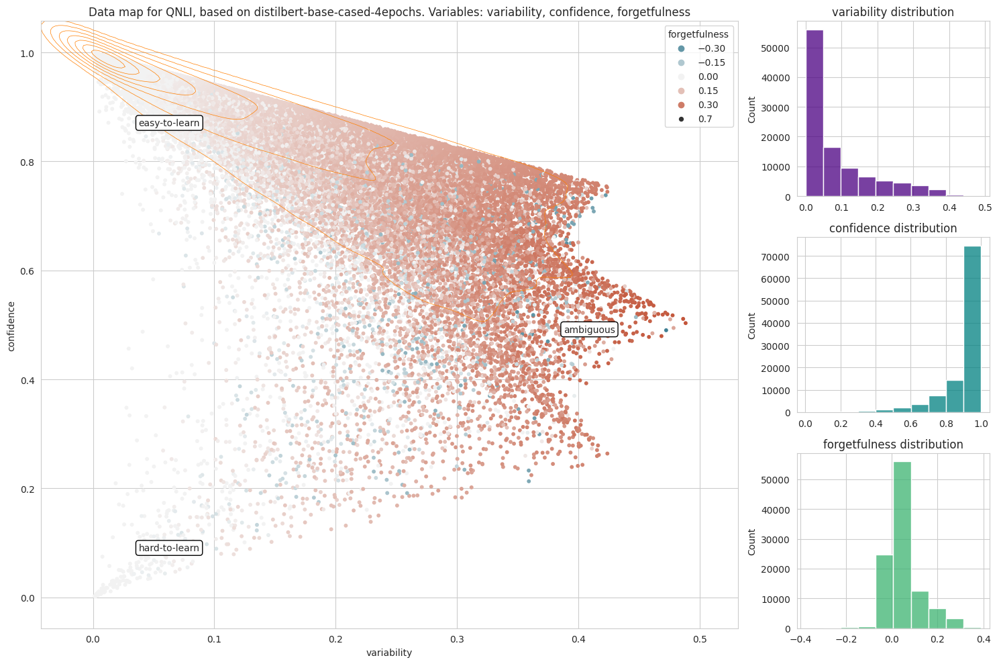

In [ ]:
# if bert_dataset_map is available
bert_datamap = plot_datamap(
    bert_dataset_map.variability,
    bert_dataset_map.confidence,
    bert_dataset_map.forgetfulness,
    var1_name='variability',
    var2_name='confidence',
    var3_name='forgetfulness',
    model_name='distilbert-base-cased-4epochs'
)

bert_datamap.show()

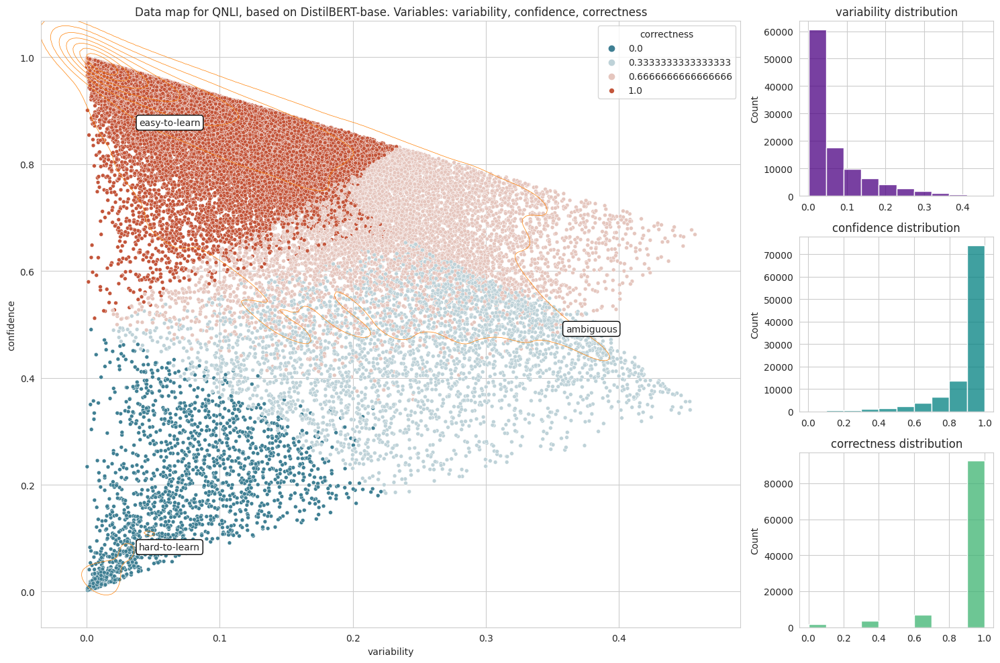

In [ ]:
# if bert_dataset_map is available
bert_datamap = plot_datamap(
    bert_dataset_map.variability,
    bert_dataset_map.confidence,
    bert_dataset_map.correctness,
    var1_name='variability',
    var2_name='confidence',
    var3_name='correctness'
)

bert_datamap.show()

In [ ]:
bert_dataset_map.gold_labels_probabilities[:10]

array([[0.51192856, 0.4939974 ],
       [0.51034945, 0.49013633],
       [0.51588672, 0.49774575],
       [0.48281881, 0.50780815],
       [0.48286107, 0.50844204],
       [0.47964641, 0.50309265],
       [0.49421528, 0.5172019 ],
       [0.4918882 , 0.51844764],
       [0.51551145, 0.49534729],
       [0.4975712 , 0.52360761]])

In [ ]:
bert_dataset_map.forgetfulness[:10]

array([-0.01793116, -0.02021313, -0.01814097,  0.02498934,  0.02558097,
        0.02344623,  0.02298662,  0.02655944, -0.02016416,  0.02603641])

In [ ]:
bert_dataset_map.confidence[:10]

array([0.50296298, 0.50024289, 0.50681624, 0.49531348, 0.49565156,
       0.49136953, 0.50570859, 0.50516792, 0.50542937, 0.51058941])

### DistilRoberta scatter plot

In [ ]:
gold_labels_probs, confidence, variability, correctness, forgetfulness = load_training_dynamics_from_json("results/roberta_training_dynamics.json")

# re-initialize bert_dataset_map with gold_label_probabilities
roberta_dataset_map = tdd.DataMapCallback(roberta_train_unshuffled.batch(128),
                                        outputs_to_probabilities=lambda x: tf.nn.softmax(x[0]), # Model outputs a tuple, where the logits are at the first index
                                        sparse_labels=True,
                                        gold_labels_probabilities = gold_labels_probs)

Fetching training dynamics from saved json file: results/roberta_training_dynamics.json: 100%|██████████| 20/20 [00:00<00:00, 116185.71it/s]


TypeError: ignored

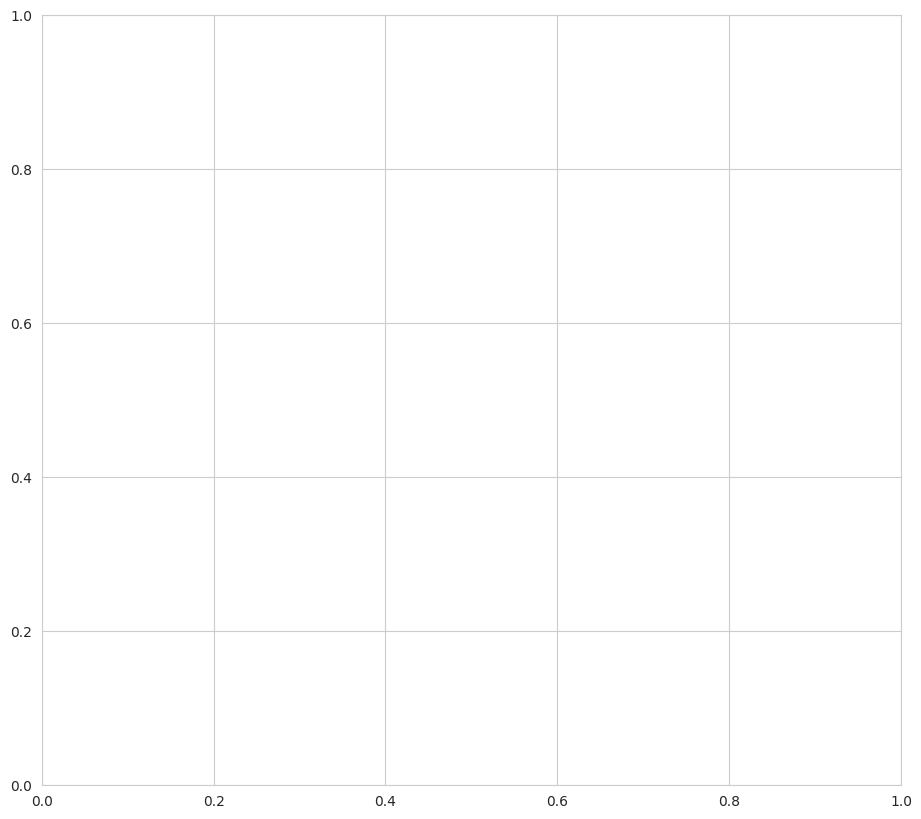

In [ ]:
roberta_datamap = plot_datamap(confidence, variability, correctness)
roberta_datamap.show()

## Visualizing Forgetfulness

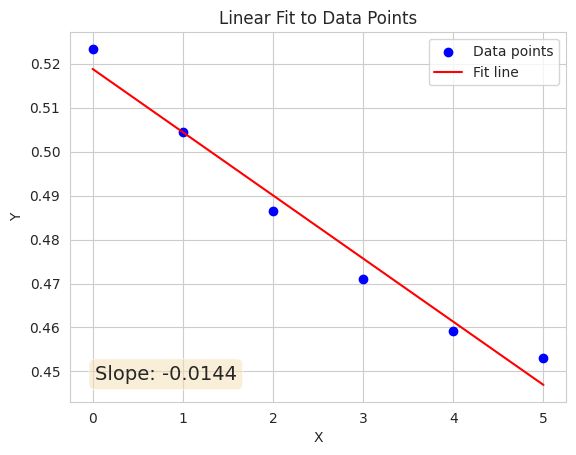

In [ ]:
example_probabilities = [0.5233744978904724, 0.5044159293174744, 0.48639848828315735, 0.47096383571624756, 0.459157794713974, 0.45296889543533325]
dpoints = [d for d in enumerate(example_probabilities)]

# Calculating the necessary sums
n = len(dpoints)
sum_x = sum(x for x, _ in dpoints)
sum_y = sum(y for _, y in dpoints)
sum_xy = sum(x * y for x, y in dpoints)
sum_x2 = sum(x**2 for x, y in dpoints)

# Calculating the slope (m)
slope = (n * sum_xy - sum_x * sum_y) / (n * sum_x2 - sum_x**2)

# Calculate the y-intercept (b)
mean_x = sum_x / n
mean_y = sum_y / n
intercept = mean_y - slope * mean_x

# Create the fit line
fit_line_x = [min(x for x, y in dpoints), max(x for x, y in dpoints)]
fit_line_y = [slope * x + intercept for x in fit_line_x]

# Plotting the data points
plt.scatter(*zip(*dpoints), color='blue', label='Data points')

# Plotting the fit line
plt.plot(fit_line_x, fit_line_y, color='red', label='Fit line')

# Adding labels and legend
plt.xlabel('Epoch')
plt.ylabel('Confidence')
plt.title('Linear Fit to Data Points')
plt.legend()

# Adding the slope value in a textbox
textstr = f'Slope: {slope:.4f}'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
plt.text(0.05, 0.1, textstr, transform=plt.gca().transAxes, fontsize=14,
         verticalalignment='top', bbox=props)

# Show the plot
plt.show()


## Loading Models

In [ ]:
# Replace with your model name and checkpoint directory
MODEL_NAME = "distilbert-base-cased"
CHECKPOINT_DIR = f"models/{MODEL_NAME}"
EPOCH_TO_LOAD = 1  # Change this to the epoch number you want to load

# Create a new instance of the model
model = TFDistilBertForSequenceClassification.from_pretrained(MODEL_NAME)

# Construct the checkpoint path
checkpoint_path = os.path.join(CHECKPOINT_DIR, str(EPOCH_TO_LOAD))

# Load the weights
model.load_weights(checkpoint_path)
optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])


In [ ]:
# Evaluate performance on test set
results = pd.DataFrame(index=['100% Train'],
                       columns=['DistilBERT'],
                       data=[model.evaluate(test_batched)[1]*100])

results

22/22 [==============================] - 12s 526ms/step - loss: 0.6930 - accuracy: 0.5115


,DistilBERT
100% Train,51.153421


## Training on distilled datasets

In [ ]:
# Get the mapping between a sample ID in the dataset, to its index in the order of samples
dataset_id2index = {sample['idx']: i for i, sample in enumerate(train_unshuffled.as_numpy_iterator())}
index2dataset_id = {v: k for k, v in dataset_id2index.items()}

KeyboardInterrupt: ignored

In [ ]:
dataset_id2index = {}
index2dataset_id = {}

# Wrapping the iterator with tqdm for the progress bar
for i, sample in tqdm(enumerate(train_unshuffled.as_numpy_iterator())):
    dataset_id2index[sample['idx']] = i
    index2dataset_id[i] = sample['idx']


104743it [00:43, 2431.53it/s]


In [ ]:
# Calculate agreement on clustering
def get_datamap(data: tdd.DataMapCallback) -> np.ndarray:
    """
    Extract variability and confidence as a matrix of (samples, 2) for clustering
    """

    return np.hstack([np.expand_dims(data.variability, -1), np.expand_dims(data.confidence, -1)])

kmeans = KMeans(n_clusters=3, init=np.array([[0, 0], [1, 0.5], [0, 1]]))


In [ ]:
def distill(datamap: np.ndarray, n_ambiguous: int, n_easy2learn: int):
    """
    Get the indices of a distilled dataset
    """
    kdt = KDTree(datamap, metric='euclidean')

    _, ambiguous_idx = kdt.query([[1, 0.5]],
                                 k=n_ambiguous)

    if n_easy2learn:
        _, easy2learn_idx = kdt.query([[0, 1]],
                                      k=n_easy2learn)

        return np.hstack([ambiguous_idx, easy2learn_idx])

    return ambiguous_idx

In [ ]:
# Get datamaps
bert_datamap = get_datamap(bert_dataset_map)
# roberta_datamap = get_datamap(roberta_dataset_map)
#sdsn_datamap = get_datamap(sdsn_dataset_map)

In [ ]:
bert_datamap

array([[0.41224756, 0.53650293],
       [0.01024448, 0.98926765],
       [0.05470867, 0.93351074],
       ...,
       [0.09331755, 0.94348226],
       [0.00360554, 0.99563582],
       [0.01757197, 0.98439986]])

In [ ]:
n_train_samples = sum(1 for _ in train_unshuffled)
n_ambiguous = int(n_train_samples * 0.12)  # 12 percent
n_easy2learn = int(n_train_samples * 0.03)  # 3 percent

In [ ]:
bert_distilled_idx = distill(bert_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
np.random.shuffle(bert_distilled_idx)

In [ ]:
bert_distilled_idx

array([[ 2978,  3579, 75086, ..., 29842, 97544, 41617]])

In [ ]:
# Distill bert
bert_distilled_idx = distill(bert_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
np.random.shuffle(bert_distilled_idx)

# Distill roberta
roberta_distilled_idx = distill(roberta_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
np.random.shuffle(roberta_distilled_idx)

# # Distill sdsn
# sdsn_distilled_idx = distill(sdsn_datamap, n_ambiguous=n_ambiguous, n_easy2learn=n_easy2learn)
# np.random.shuffle(sdsn_distilled_idx)

In [ ]:
bert_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(bert_distilled_idx, dtype=tf.int32)))), bert_tokenizer, max_length=128, task='qnli')
bert_distilled_train = bert_distilled_train.shuffle(1000).batch(
    32).prefetch(1)

/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


In [ ]:
# Build distilled datasets
bert_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(bert_distilled_idx, dtype=tf.int32)))), bert_tokenizer, max_length=128, task='qnli')
bert_distilled_train = bert_distilled_train.shuffle(1000).batch(
    32).prefetch(1)

roberta_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(roberta_distilled_idx, dtype=tf.int32)))), roberta_tokenizer, max_length=128, task='qnli')
roberta_distilled_train = roberta_distilled_train.shuffle(1000).batch(
    32).prefetch(1)

# sdsn_distilled_train = train.filter(
#     lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(sdsn_distilled_idx, dtype=tf.int32)))).shuffle(1000).batch(
#     32).map(lambda x: ({'question': vectorizer(tf.strings.regex_replace(x['question'], '\d', '#')),
#                         'sentence': vectorizer(tf.strings.regex_replace(x['sentence'], '\d', '#'))},
#                        x['label'])).prefetch(1)

/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:66: FutureWarning: This function will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("function"), FutureWarning)
/usr/local/lib/python3.10/dist-packages/transformers/data/processors/glue.py:474: FutureWarning: This processor will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/text-classification/run_glue.py
  warnings.warn(DEPRECATION_WARNING.format("processor"), FutureWarning)


In [ ]:
# Load initial weights
bert.load_weights(bert_init_weights_path.name)
roberta.load_weights(roberta_init_weights_path.name)
# sdsn.load_weights(sdsn_init_weights_path.name)

# Recompile
bert.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
roberta.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
# sdsn.compile(optimizer=tf.keras.optimizers.Adam(),
#              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

NameError: ignored

In [ ]:
bert.fit(bert_distilled_train, epochs=100, validation_data=bert_validation,
         callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                    tf.keras.callbacks.ModelCheckpoint(bert_best_weights_path.name, save_best_only=True, save_weights_only=True)])

Epoch 1/100
491/491 [==============================] - 58s 110ms/step - loss: 0.5202 - accuracy: 0.7406 - val_loss: 0.3858 - val_accuracy: 0.8291
Epoch 2/100
491/491 [==============================] - 54s 109ms/step - loss: 0.3511 - accuracy: 0.8542 - val_loss: 0.4222 - val_accuracy: 0.8177
Epoch 3/100
491/491 [==============================] - 54s 109ms/step - loss: 0.2087 - accuracy: 0.9208 - val_loss: 0.5123 - val_accuracy: 0.8316
Epoch 4/100
491/491 [==============================] - 54s 109ms/step - loss: 0.1175 - accuracy: 0.9594 - val_loss: 0.6090 - val_accuracy: 0.8177
Epoch 5/100
491/491 [==============================] - 54s 109ms/step - loss: 0.0737 - accuracy: 0.9749 - val_loss: 0.7782 - val_accuracy: 0.8203
Epoch 6/100
491/491 [==============================] - 54s 110ms/step - loss: 0.0566 - accuracy: 0.9810 - val_loss: 0.7199 - val_accuracy: 0.8280


In [ ]:
roberta.fit(roberta_distilled_train, epochs=100, validation_data=roberta_validation,
            callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                       tf.keras.callbacks.ModelCheckpoint(roberta_best_weights_path.name, save_best_only=True, save_weights_only=True)])

Epoch 1/100
491/491 [==============================] - 62s 116ms/step - loss: 0.4947 - accuracy: 0.7612 - val_loss: 0.3392 - val_accuracy: 0.8569
Epoch 2/100
491/491 [==============================] - 57s 115ms/step - loss: 0.3447 - accuracy: 0.8553 - val_loss: 0.3292 - val_accuracy: 0.8627
Epoch 3/100
491/491 [==============================] - 57s 115ms/step - loss: 0.2371 - accuracy: 0.9090 - val_loss: 0.3660 - val_accuracy: 0.8635
Epoch 4/100
491/491 [==============================] - 57s 115ms/step - loss: 0.1553 - accuracy: 0.9448 - val_loss: 0.4604 - val_accuracy: 0.8463
Epoch 5/100
491/491 [==============================] - 57s 115ms/step - loss: 0.1071 - accuracy: 0.9612 - val_loss: 0.4500 - val_accuracy: 0.8583
Epoch 6/100
491/491 [==============================] - 57s 115ms/step - loss: 0.0743 - accuracy: 0.9743 - val_loss: 0.5717 - val_accuracy: 0.8547
Epoch 7/100
491/491 [==============================] - 57s 115ms/step - loss: 0.0577 - accuracy: 0.9801 - val_loss: 0.6594 -

In [ ]:
sdsn.fit(sdsn_distilled_train, epochs=100, validation_data=sdsn_validation,
         callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                    tf.keras.callbacks.ModelCheckpoint(sdsn_best_weights_path.name, save_best_only=True, save_weights_only=True)])

Epoch 1/100
491/491 [==============================] - 3s 5ms/step - loss: 2.7320 - accuracy: 0.4891 - val_loss: 2.0492 - val_accuracy: 0.4989
Epoch 2/100
491/491 [==============================] - 2s 4ms/step - loss: 1.8044 - accuracy: 0.5221 - val_loss: 1.6053 - val_accuracy: 0.5421
Epoch 3/100
491/491 [==============================] - 2s 4ms/step - loss: 1.5144 - accuracy: 0.5333 - val_loss: 1.3774 - val_accuracy: 0.5421
Epoch 4/100
491/491 [==============================] - 2s 5ms/step - loss: 1.3782 - accuracy: 0.5280 - val_loss: 1.2979 - val_accuracy: 0.5362
Epoch 5/100
491/491 [==============================] - 2s 5ms/step - loss: 1.1867 - accuracy: 0.5559 - val_loss: 1.1326 - val_accuracy: 0.5344
Epoch 6/100
491/491 [==============================] - 3s 5ms/step - loss: 1.0668 - accuracy: 0.5628 - val_loss: 1.0282 - val_accuracy: 0.5516
Epoch 7/100
491/491 [==============================] - 3s 5ms/step - loss: 0.9705 - accuracy: 0.5780 - val_loss: 0.9578 - val_accuracy: 0.5542

In [ ]:
bert.load_weights(bert_best_weights_path.name)
roberta.load_weights(roberta_best_weights_path.name)
sdsn.load_weights(sdsn_best_weights_path.name)

In [ ]:
distilled_results = pd.DataFrame(index=['15% Distilled'],
                                 columns=['SDSN', 'DistilRoBERTA', 'DistilBERT'],
                                 data=[[sdsn.evaluate(sdsn_test)[1]*100, roberta.evaluate(roberta_test)[1]*100, bert.evaluate(bert_test)[1]*100]])
results = results.append(distilled_results)

22/22 [==============================] - 3s 113ms/step - loss: 0.4153 - accuracy: 0.8242


In [ ]:
results

,SDSN,DistilRoBERTA,DistilBERT
100% Train,58.916146,89.051628,86.378616
15% Distilled,57.707798,84.474552,82.424021


## Agreement on clusters

In [ ]:
# Bert
bert_clusters = kmeans.fit_predict(bert_datamap)

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [ ]:
# Roberta
roberta_clusters = kmeans.fit_predict(roberta_datamap)

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [ ]:
# SDSN
sdsn_clusters = kmeans.fit_predict(sdsn_datamap)

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)


In [ ]:
# Calculate mutual information
adjusted_mutual_info = np.zeros(shape=(3, 3))
mask = np.zeros_like(adjusted_mutual_info)
mask[np.triu_indices_from(mask)] = True

adjusted_mutual_info[1, 0] = adjusted_mutual_info_score(roberta_clusters, sdsn_clusters)
adjusted_mutual_info[2, 0] = adjusted_mutual_info_score(bert_clusters, sdsn_clusters)
adjusted_mutual_info[2, 1] = adjusted_mutual_info_score(bert_clusters, roberta_clusters)

<IPython.core.display.Javascript object>


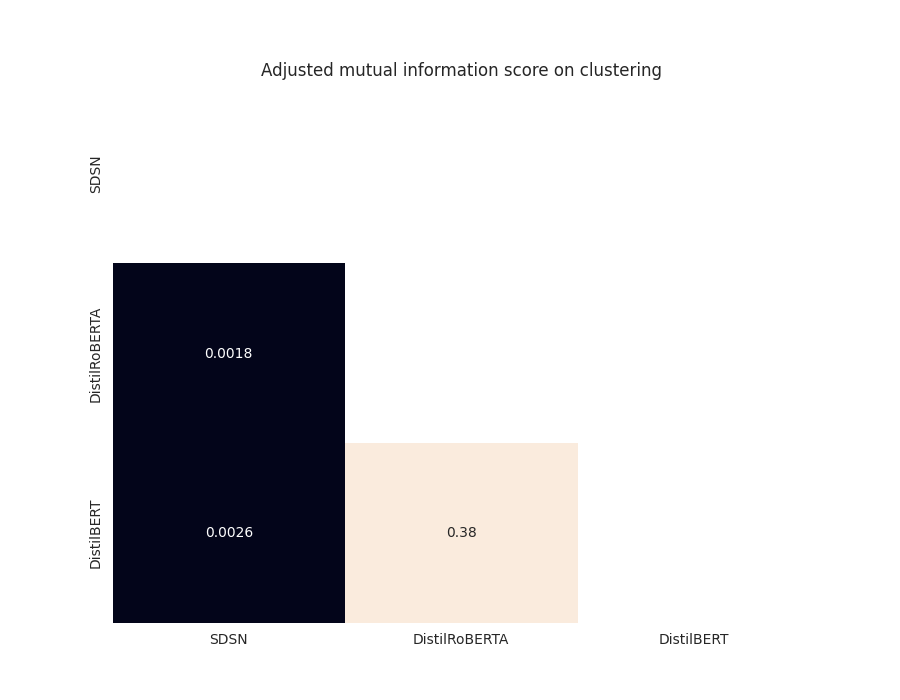

In [ ]:
# Plot
_, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(adjusted_mutual_info, annot=True, mask=mask, cbar=False,
            xticklabels=['SDSN', 'DistilRoBERTA', 'DistilBERT'], yticklabels=['SDSN', 'DistilRoBERTA', 'DistilBERT'])
ax.set(title='Adjusted mutual information score on clustering');

In [ ]:
average_location = np.mean(np.stack([bert_datamap, roberta_datamap, sdsn_datamap], axis=-1), axis=-1)

# Calculate average distance from average location
average_distance = np.mean(np.stack([
    np.linalg.norm(bert_datamap - average_location, axis=-1),
    np.linalg.norm(roberta_datamap - average_location, axis=-1),
    np.linalg.norm(sdsn_datamap - average_location, axis=-1)
], axis=-1), axis=-1)

# Sort for visibility of high distance points
sorted_idx = np.argsort(average_distance)

<IPython.core.display.Javascript object>


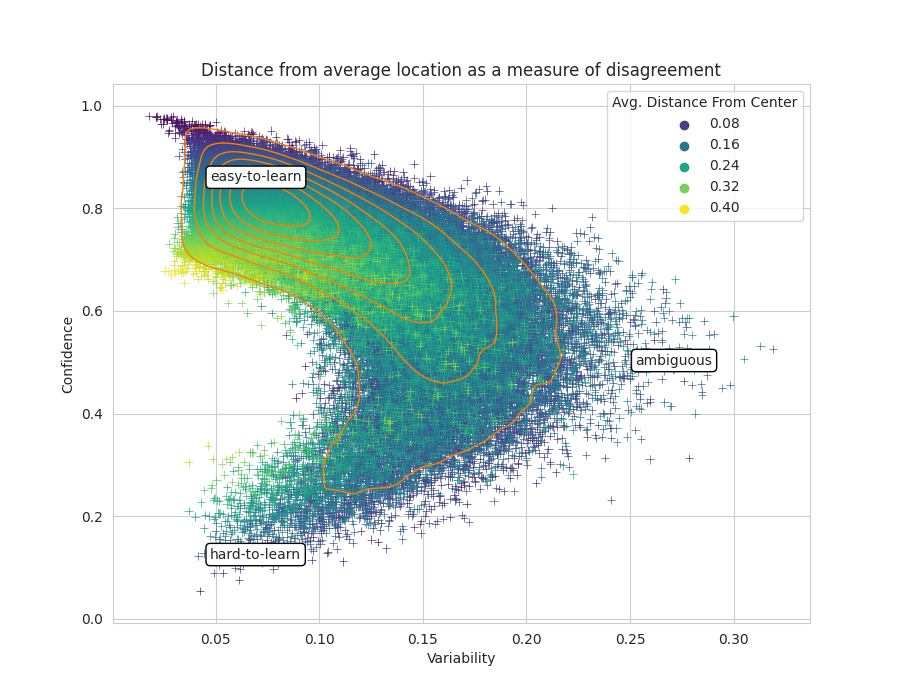

In [ ]:
# Plot
_, ax = plt.subplots(figsize=(9, 7))


sns.scatterplot(x=average_location[sorted_idx, 0],
                y=average_location[sorted_idx, 1],
                hue=average_distance[sorted_idx],
                ax=ax, marker="+",
                palette=sns.color_palette("viridis", as_cmap=True))
sns.kdeplot(x=average_location[:, 0], y=average_location[:, 1],
            levels=8, color=sns.color_palette("Paired")[7], linewidths=1, ax=ax)

ax.set(title='Distance from average location as a measure of disagreement',
       xlabel='Variability', ylabel='Confidence')

# Annotations
box_style = {'boxstyle': 'round', 'facecolor': 'white', 'ec': 'black'}
ax.text(0.14, 0.84,
        'easy-to-learn',
        transform=ax.transAxes,
        verticalalignment='top',
        bbox=box_style)
ax.text(0.75, 0.5,
        'ambiguous',
        transform=ax.transAxes,
        verticalalignment='top',
        bbox=box_style)
ax.text(0.14, 0.14,
        'hard-to-learn',
        transform=ax.transAxes,
        verticalalignment='top',
        bbox=box_style)

ax.legend(title='Avg. Distance From Center');

In [ ]:
# Do the same only for bert + roberta
average_location = np.mean(np.stack([bert_datamap, roberta_datamap], axis=-1), axis=-1)

# Calculate average distance from average location
average_distance = np.mean(np.stack([
    np.linalg.norm(bert_datamap - average_location, axis=-1),
    np.linalg.norm(roberta_datamap - average_location, axis=-1)
], axis=-1), axis=-1)

# Sort for visibility of high distance points
sorted_idx = np.argsort(average_distance)

<IPython.core.display.Javascript object>


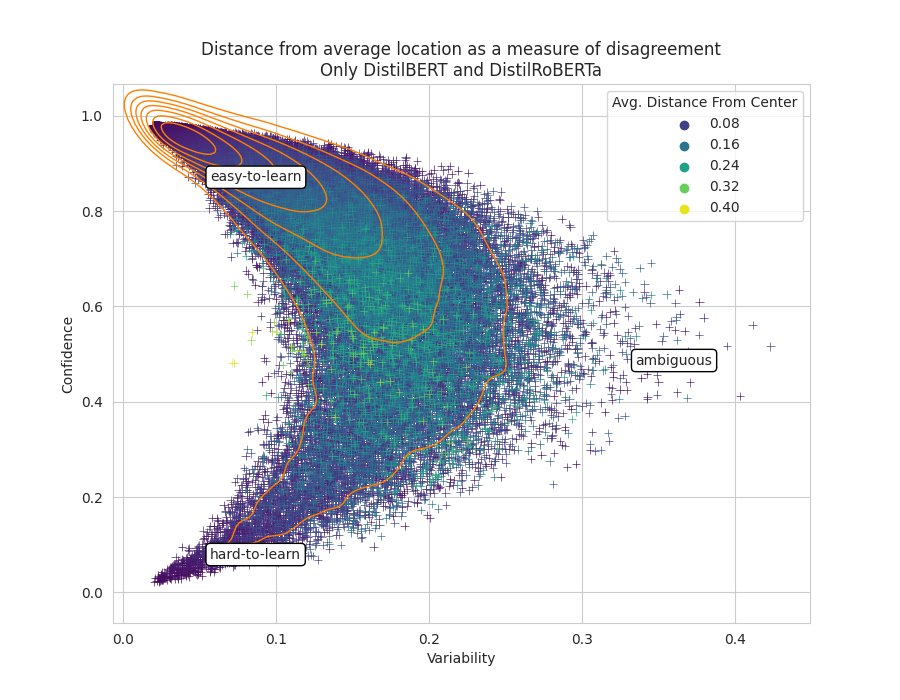

In [ ]:
# Plot
_, ax = plt.subplots(figsize=(9, 7))


sns.scatterplot(x=average_location[sorted_idx, 0],
                y=average_location[sorted_idx, 1],
                hue=average_distance[sorted_idx],
                ax=ax, marker="+",
                palette=sns.color_palette("viridis", as_cmap=True))
sns.kdeplot(x=average_location[:, 0], y=average_location[:, 1],
            levels=8, color=sns.color_palette("Paired")[7], linewidths=1, ax=ax)

ax.set(title='Distance from average location as a measure of disagreement\nOnly DistilBERT and DistilRoBERTa',
       xlabel='Variability', ylabel='Confidence')

# Annotations
box_style = {'boxstyle': 'round', 'facecolor': 'white', 'ec': 'black'}
ax.text(0.14, 0.84,
        'easy-to-learn',
        transform=ax.transAxes,
        verticalalignment='top',
        bbox=box_style)
ax.text(0.75, 0.5,
        'ambiguous',
        transform=ax.transAxes,
        verticalalignment='top',
        bbox=box_style)
ax.text(0.14, 0.14,
        'hard-to-learn',
        transform=ax.transAxes,
        verticalalignment='top',
        bbox=box_style)

ax.legend(title='Avg. Distance From Center');

# Data sub-problems

## BERT

In [ ]:
bert_ambiguous_idx, bert_easy2learn_idx, bert_hard2learn_idx = extract_by_training_dynamics(bert_datamap, 10, 10, 10)

bert_ambiguous_samples = get_samples_by_index(train_unshuffled, bert_ambiguous_idx)
bert_easy2learn_samples = get_samples_by_index(train_unshuffled, bert_easy2learn_idx)
bert_hard2learn_samples = get_samples_by_index(train_unshuffled, bert_hard2learn_idx)

pretty_print_samples(bert_ambiguous_samples, "BERT Ambiguous")
pretty_print_samples(bert_easy2learn_samples, "BERT Easy-to-learn")
pretty_print_samples(bert_hard2learn_samples, "BERT Hard-to-learn")


### BERT Ambiguous

 - **Question**: What was the English title of Le scandale?
 
   **Sentence**: Except for the two first films it produced, Claude Chabrol's Le scandale (English title The Champagne Murders) and Romain Gary's Les oiseaux vont mourir au Pérou (English title Birds in Peru), it was only involved in French or other European co-productions, the most noticeable ones being Louis Malle's Lacombe, Lucien, Bertrand Blier's Les Valseuses (English title Going Places), and Fred Zinnemann's The Day of the Jackal.
   
   **Label**: True
   
   


 - **Question**: All entities, being unable to predict behavior, are because of what?
 
   **Sentence**: Moreover, inability to predict an electron's movement (for instance) is not due to faulty understanding or inadequate technology; rather, the fundamental creativity/freedom of all entities means that there will always remain phenomena that are unpredictable.
   
   **Label**: True
   
   


 - **Question**: Where did Beyoncé perform on January 20, 2009?
 
   **Sentence**: On January 20, 2009, Beyoncé performed James' "
   
   **Label**: False
   
   


 - **Question**: How do dogs establish their territory as far as scent is concerned?
 
   **Sentence**: There are a vast range of commodity forms available to transform a pet dog into an ideal companion.
   
   **Label**: False
   
   


 - **Question**: Who is the founder of Dell?
 
   **Sentence**: Michael Dell, the founder of the company, serves as chairman of the board and chief executive officer.
   
   **Label**: True
   
   


 - **Question**: Which British territory received independence in 1962?
 
   **Sentence**: Most of the UK's Caribbean territories achieved independence after the departure in 1961 and 1962 of Jamaica and Trinidad from the West Indies Federation, established in 1958 in an attempt to unite the British Caribbean colonies under one government, but which collapsed following the loss of its two largest members.
   
   **Label**: True
   
   


 - **Question**: The original Veda of the rishis was altered by a few Brahmins who introduced what?
 
   **Sentence**: He names the Vedic rishis, and declared that the original Veda of the rishis[note 25] was altered by a few Brahmins who introduced animal sacrifices.
   
   **Label**: True
   
   


 - **Question**: What year was Tuscon's largest office building built?
 
   **Sentence**: Tucson's largest office building is 5151 East Broadway in east Tucson, completed in 1975.
   
   **Label**: True
   
   


 - **Question**: What happens as the scope of economically viable applications increases?
 
   **Sentence**: As the cost of renewable power falls, the scope of economically viable applications increases.
   
   **Label**: True
   
   


 - **Question**: In 2006, which Northwestern linebacker became the youngest Division/FBS coach at the time?
 
   **Sentence**: At one time, Northwestern had the longest losing streak in Division I-A, losing 34 consecutive games between 1979 and 1982.
   
   **Label**: False
   
   




### BERT Easy-to-learn

 - **Question**: What were CD-V's video capacities usually used for?
 
   **Sentence**: A CD-V carried up to five minutes of analog LaserDisc-type video content (usually a music video), as well as up to 20 minutes of digital audio CD tracks.
   
   **Label**: True
   
   


 - **Question**: What company manufactured Elixir Sulfanilamide?
 
   **Sentence**: In 1937 over 100 people died after ingesting "Elixir Sulfanilamide" manufactured by S.E. Massengill Company of Tennessee.
   
   **Label**: True
   
   


 - **Question**: What government took over from the Manchu dynasty?
 
   **Sentence**: , also called the Empire of the Great Qing, or the Manchu dynasty, was the last imperial dynasty of China, ruling from 1644 to 1912 with a brief, abortive restoration in 1917.
   
   **Label**: False
   
   


 - **Question**: When did the war in Europe end?
 
   **Sentence**: Many prematurely considered that victory in Europe would come by summer's end—however the Germans did not capitulate for almost a year.
   
   **Label**: False
   
   


 - **Question**: What structure did Jens Galschiøt build to monumentalize the Tianamen Square protests in 1989?
 
   **Sentence**: The Color Orange democracy group, led by Danish sculptor Jens Galschiøt, originally planned to join the Hong Kong Alliance relay and paint the "Pillar of Shame", a structure he built in Hong Kong to commemorate the 1989 Tiananmen Square protests.
   
   **Label**: True
   
   


 - **Question**: How many number one singles did Queen release?
 
   **Sentence**: The band have released a total of eighteen number one albums, eighteen number one singles, and ten number one DVDs worldwide, making them one of the world's best-selling music artists.
   
   **Label**: True
   
   


 - **Question**: Where does the mandolin that Gaetano Vinaccia reside?
 
   **Sentence**: There is confusion currently as to the name of the eldest Vinaccia luthier who first ran the shop.
   
   **Label**: False
   
   


 - **Question**: Is the structure of hardwood simple or complex?
 
   **Sentence**: The structure of hardwoods is more complex.
   
   **Label**: True
   
   


 - **Question**: Avoiding drugs and using condoms are other forms of what?
 
   **Sentence**: There are other forms of prevention such as avoiding the use of illicit drugs, using a condom, and having a healthy lifestyle with a balanced diet and regular exercise.
   
   **Label**: True
   
   


 - **Question**: What can a citizen of Georgia not be compelled to do?
 
   **Sentence**: No person within this state shall, upon any pretense, be deprived of the inestimable privilege of worshipping God in any manner agreeable to his own conscience, nor be compelled to attend any place of worship contrary to his own faith and judgment; nor shall he ever be obliged to pay tithes, taxes, or any other rate, for the building or repairing any place of worship, or for the maintenance of any minister or ministry, contrary to what he believes to be right, or hath voluntarily engaged to do.
   
   **Label**: True
   
   




### BERT Hard-to-learn

 - **Question**: Which is the tallest mountain in Sicily?
 
   **Sentence**: The tallest peak of the range is La Pizzuta, about 1,333 m (4,373 ft.) high.
   
   **Label**: True
   
   


 - **Question**: What threat was John worried about?
 
   **Sentence**: By 1213, though, John was increasingly worried about the threat of French invasion.
   
   **Label**: True
   
   


 - **Question**: What is there little coherent relationships between?
 
   **Sentence**: There is "little coherent relationship between the amount and mix of homosexual and heterosexual behavior in a person's biography and that person's choice to label himself or herself as bisexual, homosexual, or heterosexual".
   
   **Label**: True
   
   


 - **Question**: How much was the signing payment for Diego Maradona?
 
   **Sentence**: In June 1982, Diego Maradona was signed for a world record fee of £5 million from Boca Juniors.
   
   **Label**: True
   
   


 - **Question**: When did the Montevideo Cabildo become a National Heritage Site?
 
   **Sentence**: Built between 1804 and 1869 in Neoclassical style, with a series of Doric and Ionic columns, it became a National Heritage Site in 1975.
   
   **Label**: True
   
   


 - **Question**: How many members compose the legislature?
 
   **Sentence**: At the legislative level, a unicameral Assembleia Nacional Popular (National People's Assembly) is made up of 100 members.
   
   **Label**: True
   
   


 - **Question**: Towards the end of what year did That's Solent begin broadcasting?
 
   **Sentence**: That's Solent is an local television channel that began broadcasting in November 2014, which will be based in and serve Southampton and Portsmouth.
   
   **Label**: True
   
   


 - **Question**: When did Peter Lombard die?
 
   **Sentence**: Scholars such as Peter Abelard (d. 1142) and Peter Lombard (d. 1164) introduced Aristotelian logic into theology.
   
   **Label**: True
   
   


 - **Question**: Which cities are called Stadtstaaten, other than Bremen?
 
   **Sentence**: Since today's Germany was formed from an earlier collection of several states, it has a federal constitution, and the constituent states retain a measure of sovereignty.
   
   **Label**: False
   
   


 - **Question**: What disagreements did the  Luftwaffe staff center around?
 
   **Sentence**: Disputes among the OKL staff revolved more around tactics than strategy.
   
   **Label**: True
   
   



## RoBERTa

In [ ]:
roberta_ambiguous_idx, roberta_easy2learn_idx, roberta_hard2learn_idx = extract_by_training_dynamics(roberta_datamap, 10, 10, 10)

roberta_ambiguous_samples = get_samples_by_index(train_unshuffled, roberta_ambiguous_idx)
roberta_easy2learn_samples = get_samples_by_index(train_unshuffled, roberta_easy2learn_idx)
roberta_hard2learn_samples = get_samples_by_index(train_unshuffled, roberta_hard2learn_idx)

pretty_print_samples(roberta_ambiguous_samples, "RoBERTa Ambiguous")
pretty_print_samples(roberta_easy2learn_samples, "RoBERTa Easy-to-learn")
pretty_print_samples(roberta_hard2learn_samples, "RoBERTa Hard-to-learn")


### RoBERTa Ambiguous

 - **Question**: In 1995, who decided to manage the girls singing group?
 
   **Sentence**: They were placed into a group with three other girls as Girl's Tyme, and rapped and danced on the talent show circuit in Houston.
   
   **Label**: False
   
   


 - **Question**: What was the grand total of German casualties and those missing in action?
 
   **Sentence**: A grand total of 20,163 German troops were killed, wounded or missing in action during the August 18 battle.
   
   **Label**: True
   
   


 - **Question**: Where did Libya manufacture mustard gas?
 
   **Sentence**: The period also saw a growth in domestic Islamist opposition, formulated into groups like the Muslim Brotherhood and the Libyan Islamic Fighting Group.
   
   **Label**: False
   
   


 - **Question**: Before 1919 what were the German states called?
 
   **Sentence**: Before this time, the constituent states of the German Empire were called Staaten (States).
   
   **Label**: True
   
   


 - **Question**: How do dogs establish their territory as far as scent is concerned?
 
   **Sentence**: There are a vast range of commodity forms available to transform a pet dog into an ideal companion.
   
   **Label**: False
   
   


 - **Question**: When did Governor Christie say that the state would consider a referendum?
 
   **Sentence**: With casino revenue declining from $5.2 billion in 2006 to $2.9 billion in 2013, the state saw a drop in money from its 8% tax on those earnings, which is used to fund programs for senior citizens and the disabled.
   
   **Label**: False
   
   


 - **Question**: Around what year did the International Gothic style flourish?
 
   **Sentence**: Northern Europe and Spain continued to use Gothic styles, which became increasingly elaborate in the 15th century, until almost the end of the period.
   
   **Label**: False
   
   


 - **Question**: Conversely the scholars who did view the Serbs' acts as constituting genocide, were backed up by what Tribunal?
 
   **Sentence**: The ECHR also noted that in the 21st century "Amongst scholars, the majority have taken the view that ethnic cleansing, in the way in which it was carried out by the Serb forces in Bosnia and Herzegovina in order to expel Muslims and Croats from their homes, did not constitute genocide.
   
   **Label**: False
   
   


 - **Question**: What type of establishment was Wan Mee?
 
   **Sentence**: This success brought an influx of new residents with a population increase within city limits of almost 50,000 between 1990 and 2000, and saw Seattle's real estate become some of the most expensive in the country.
   
   **Label**: False
   
   


 - **Question**: What is the backbone of a DNA double helix made of?
 
   **Sentence**: The two strands in a double helix must therefore be complementary, with their sequence of bases matching such that the adenines of one strand are paired with the thymines of the other strand, and so on.:4.1
   
   **Label**: False
   
   




### RoBERTa Easy-to-learn

 - **Question**: Smyth wrote a tract titled what?
 
   **Sentence**: He was convinced on the basis of his interpretation of Scripture that infants would not be damned should they die in infancy.
   
   **Label**: False
   
   


 - **Question**: What is supposed to be the last resort for police?
 
   **Sentence**: The use of firearms or deadly force is typically a last resort only to be used when necessary to save human life, although some jurisdictions (such as Brazil) allow its use against fleeing felons and escaped convicts.
   
   **Label**: True
   
   


 - **Question**: What year did the Queen and Albert purchase Balmoral Castle?
 
   **Sentence**: She agreed to visit the gardens of the Royal Horticultural Society at Kensington and take a drive through London in an open carriage.
   
   **Label**: False
   
   


 - **Question**: How was the suit settled?
 
   **Sentence**: It was settled out of court by her lawyers in June 2013 who said that they had cancelled because GateFive had lost its financial backers.
   
   **Label**: True
   
   


 - **Question**: What does EAL stand for?
 
   **Sentence**: Many common operating systems meet the EAL4 standard of being "Methodically Designed, Tested and Reviewed", but the formal verification required for the highest levels means that they are uncommon.
   
   **Label**: False
   
   


 - **Question**: Why are long sentences in a modern preamble formatted into multiple paragraphs?
 
   **Sentence**: Modern preambles are sometimes structured as a single very long sentence formatted into multiple paragraphs for readability, in which each of the paragraphs begins with a verb (desiring, recognizing, having, and so on).
   
   **Label**: True
   
   


 - **Question**: Has there been a recent increase or decrease in international students studying in Melbourne?
 
   **Sentence**: Of the top twenty high schools in Australia according to the Better Education ranking, six are located in Melbourne.
   
   **Label**: False
   
   


 - **Question**: What does the Dutch word "kroes" mean in English?
 
   **Sentence**: Vowel length is not always considered a distinctive feature in Dutch phonology, because it normally co-occurs with changes in vowel quality.
   
   **Label**: False
   
   


 - **Question**: How many world series have the Cubs appeared in?
 
   **Sentence**: The team has appeared in seven World Series following their 1908 title, most recently in 1945.
   
   **Label**: True
   
   


 - **Question**: How did Whitehead define religion?
 
   **Sentence**: His most famous remark on religion is that "religion is what the individual does with his own solitariness ... and if you are never solitary, you are never religious."
   
   **Label**: False
   
   




### RoBERTa Hard-to-learn

 - **Question**: Which is the tallest mountain in Sicily?
 
   **Sentence**: The tallest peak of the range is La Pizzuta, about 1,333 m (4,373 ft.) high.
   
   **Label**: True
   
   


 - **Question**: Who else did the BSA issues a report in 2011 with?
 
   **Sentence**: The ninth annual "BSA Global Software Piracy Study" claims that the "commercial value of this shadow market of pirated software" was worth US$63.4 billion in 2011, with the highest commercial value of pirated PC software existent in the U.S. during that time period (US$9,773,000).
   
   **Label**: False
   
   


 - **Question**: What's the main focus of a Technische Universität?
 
   **Sentence**: Technische Universität (abbreviation: TU) are the common terms for universities of technology or technical university.
   
   **Label**: False
   
   


 - **Question**: What does URL stand for?
 
   **Sentence**: Prefixes that the web browser cannot directly handle are often handed off to another application entirely.
   
   **Label**: False
   
   


 - **Question**: How much was the signing payment for Diego Maradona?
 
   **Sentence**: In June 1982, Diego Maradona was signed for a world record fee of £5 million from Boca Juniors.
   
   **Label**: True
   
   


 - **Question**: What is the home field of Plymouth Argyle F.C.?
 
   **Sentence**: The team's home ground is called Home Park and is located in Central Park.
   
   **Label**: True
   
   


 - **Question**: Are albums ever reproduced?
 
   **Sentence**: Old records and out-of-print recordings in particular are in much demand by collectors the world over.
   
   **Label**: False
   
   


 - **Question**: What disagreements did the  Luftwaffe staff center around?
 
   **Sentence**: Disputes among the OKL staff revolved more around tactics than strategy.
   
   **Label**: True
   
   


 - **Question**: How are the King and Queen of J'ouvert chosen?
 
   **Sentence**: J'ouvert, or "Dirty Mas", takes place before dawn on the Monday (known as Carnival Monday) before Ash Wednesday.
   
   **Label**: False
   
   


 - **Question**: What culture is most represented in the food of Hyderabad?
 
   **Sentence**: The influence of Mughlai culture is also evident in the city's distinctive cuisine, which includes Hyderabadi biryani and Hyderabadi haleem.
   
   **Label**: True
   
   



In [ ]:
sdsn_ambiguous_idx, sdsn_easy2learn_idx, sdsn_hard2learn_idx = extract_by_training_dynamics(sdsn_datamap, 10, 10, 10)

sdsn_ambiguous_samples = get_samples_by_index(train_unshuffled, sdsn_ambiguous_idx)
sdsn_easy2learn_samples = get_samples_by_index(train_unshuffled, sdsn_easy2learn_idx)
sdsn_hard2learn_samples = get_samples_by_index(train_unshuffled, sdsn_hard2learn_idx)

pretty_print_samples(sdsn_ambiguous_samples, "SDSN Ambiguous")
pretty_print_samples(sdsn_easy2learn_samples, "SDSN Easy-to-learn")
pretty_print_samples(sdsn_hard2learn_samples, "SDSN Hard-to-learn")


### SDSN Ambiguous

 - **Question**: Why did Encyclopedias and dictionaries become more popular during the Age of Reason?
 
   **Sentence**: Encyclopedias and dictionaries also became more popular during the Age of Reason as the number of educated consumers who could afford such texts began to multiply.
   
   **Label**: True
   
   


 - **Question**: What setting have anthropologists done more research in recently?
 
   **Sentence**: There has also been a related shift toward broadening the focus beyond the daily life of ordinary people; increasingly, research is set in settings such as scientific laboratories, social movements, governmental and nongovernmental organizations and businesses.
   
   **Label**: True
   
   


 - **Question**: When was the last senate election in St. Barts?
 
   **Sentence**: One senator represents the island in the French Senate.
   
   **Label**: False
   
   


 - **Question**: Which system in the body controls urination?
 
   **Sentence**: In addition to all of the above, the brain and spinal cord contain extensive circuitry to control the autonomic nervous system, which works by secreting hormones and by modulating the "smooth" muscles of the gut.
   
   **Label**: False
   
   


 - **Question**: Who was elected and was the first multiracial president of the United States?
 
   **Sentence**: In 2008 Barack Obama was elected as the first multiracial President of the United States; he acknowledges both sides of his family and identifies as African American.
   
   **Label**: True
   
   


 - **Question**: Between August 24th and October 26th how many German's left the Oblast to the Soviet Occupation zone?
 
   **Sentence**: Between 24 August and 26 October 1948 21 transports with in total 42,094 Germans left the Oblast to the Soviet Occupation Zone (which became East Germany).
   
   **Label**: True
   
   


 - **Question**: What was the first year in which RIBA's Royal Gold Medal was given?
 
   **Sentence**: The RIBA European Award was inaugurated in 2005 for work in the European Union, outside the UK.
   
   **Label**: False
   
   


 - **Question**: In what century were the operating hours of drinking establishments first limited?
 
   **Sentence**: From the mid-19th century on the opening hours of licensed premises in the UK were restricted.
   
   **Label**: True
   
   


 - **Question**: When did the Ginkgo evolve?
 
   **Sentence**: As well, the extant genus Sequoia is believed to have evolved in the Mesozoic.
   
   **Label**: True
   
   


 - **Question**: What theory states that space expanded and the universe cooled too rapidly for hydrogen to completely fuse into heavier elements?
 
   **Sentence**: At that time, according to theory, space expanded and the universe cooled too rapidly for hydrogen to completely fuse into heavier elements.
   
   **Label**: False
   
   




### SDSN Easy-to-learn

 - **Question**: What influenced Nicki Minaj to join the Pepsi global campaign?
 
   **Sentence**: American indie rock band White Rabbits also cited her an inspiration for their third album Milk Famous (2012), friend Gwyneth Paltrow studied Beyoncé at her live concerts while learning to become a musical performer for the 2010 film Country Strong.
   
   **Label**: False
   
   


 - **Question**: What group organised guerrilla warfare against the Japanese in China?
 
   **Sentence**: The Japanese found its aggression against the retreating and regrouping Chinese army was stalled by the mountainous terrain in southwestern China while the Communists organised widespread guerrilla and saboteur activities in northern and eastern China behind the Japanese front line.
   
   **Label**: True
   
   


 - **Question**: By using UTC, applications get out of adjusting to changes around clock shifts and what other factor?
 
   **Sentence**: Some applications standardize on UTC to avoid problems with clock shifts and time zone differences.
   
   **Label**: True
   
   


 - **Question**: Chinese troops attacked the UN forces when they crossed what river?
 
   **Sentence**: North Korean forces struck massively in the summer of 1950 and nearly drove the outnumbered US and ROK defenders into the sea.
   
   **Label**: False
   
   


 - **Question**: What was the NAS primarily a base for?
 
   **Sentence**: The original NAS Bermuda on the west side of the island, a seaplane base until the mid-1960s, was designated as the Naval Air Station Bermuda Annex.
   
   **Label**: True
   
   


 - **Question**: In Whitehead's view, identities do not define people, but what?
 
   **Sentence**: But in Whitehead's cosmology, the only fundamentally existent things are discrete "occasions of experience" that overlap one another in time and space, and jointly make up the enduring person or thing.
   
   **Label**: False
   
   


 - **Question**: How much of London's population left?
 
   **Sentence**: The lack of bombing in the Phoney War contributed significantly to the return of people to the cities, but class conflict was not eased a year later when evacuation operations had to be put into effect again.
   
   **Label**: False
   
   


 - **Question**: With Alsatian language on the decline, what is the ration of children using the language regularly today?
 
   **Sentence**: Like all regional languages in France, however, the transmission of Alsatian is on the decline.
   
   **Label**: False
   
   


 - **Question**: What facet of religion was not an issue for Roman?
 
   **Sentence**: For example, religious disputes helped cause the First Jewish–Roman War and the Bar Kokhba revolt.
   
   **Label**: False
   
   


 - **Question**: What famous singer made claims of racism after Jennifer Hudson was eliminated from American Idol?
 
   **Sentence**: The prolonged stays of John Stevens and Jasmine Trias in the finals, despite negative comments from the judges, had aroused resentment, so much so that John Stevens reportedly received a death threat, which he dismissed as a joke 'blown out of proportion'.
   
   **Label**: False
   
   




### SDSN Hard-to-learn

 - **Question**: Who was the ruler when the new city wall was constructed?
 
   **Sentence**: The town grew, and during the reign of Abd al-Aziz a new city wall was built, remains of which are preserved throughout the Old City (Ciutat Vella) today.
   
   **Label**: True
   
   


 - **Question**: What was Hitler's Directive 23?
 
   **Sentence**: Hitler's interest in this strategy forced Göring and Jeschonnek to review the air war against Britain in January 1941.
   
   **Label**: False
   
   


 - **Question**: Who is TrainOSE a subsidiary of?
 
   **Sentence**: Most of the country's network is standard gauge (1,565 km), while the country also has 983 km of narrow gauge.
   
   **Label**: False
   
   


 - **Question**: What causes the timing of migration?
 
   **Sentence**: Migrating birds navigate using celestial cues from the sun and stars, the earth's magnetic field, and probably also mental maps.
   
   **Label**: False
   
   


 - **Question**: How did James Gamble Rogers faux age the windows?
 
   **Sentence**: Many of Yale's buildings were constructed in the Collegiate Gothic architecture style from 1917 to 1931, financed largely by Edward S. Harkness Stone sculpture built into the walls of the buildings portray contemporary college personalities such as a writer, an athlete, a tea-drinking socialite, and a student who has fallen asleep while reading.
   
   **Label**: False
   
   


 - **Question**: Who did the British deport from Lie Saint-Jean?
 
   **Sentence**: The British also continued the process of deporting the Acadian population with a wave of major operations against Île Saint-Jean (present-day Prince Edward Island), the St. John River valley, and the Petitcodiac River valley.
   
   **Label**: True
   
   


 - **Question**: What is Canada's defense policy based on?
 
   **Sentence**: Based on that strategy, the Canadian military is oriented and being equipped to carry out six core missions within Canada, in North America and globally.
   
   **Label**: False
   
   


 - **Question**: What country invaded Panama to capture Noriega?
 
   **Sentence**: Later the U.S. invaded Panama and captured Noriega.
   
   **Label**: False
   
   


 - **Question**: Between what two years did Picasso paint La Famille de Saltimbanques and Les Demoiselles d'Avignon?
 
   **Sentence**: Picasso, living in Montmartre, painted his famous La Famille de Saltimbanques and Les Demoiselles d'Avignon between 1905 and 1907.
   
   **Label**: True
   
   


 - **Question**: during the Iraq war, what color did anti-war activists paint the "A"?
 
   **Sentence**: This was followed by a paint scuffle where the "A" was painted various colors until the city council intervened.
   
   **Label**: False
   
   



## Cross distillation accuracy

In [ ]:
cross_results = defaultdict(dict)

In [ ]:
# Train bert on roberta distilled data
bert.load_weights(bert_init_weights_path.name)
bert.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
bert_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(roberta_distilled_idx, dtype=tf.int32)))), bert_tokenizer, max_length=128, task='qnli')
bert_distilled_train = bert_distilled_train.shuffle(1000).repeat().batch(
    64).prefetch(1)
bert.fit(bert_distilled_train, epochs=100, validation_data=bert_validation, steps_per_epoch=150, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                                                                                                            tf.keras.callbacks.ModelCheckpoint(bert_best_weights_path.name, save_best_only=True, save_weights_only=True)])

bert.load_weights(bert_best_weights_path.name)

cross_results['bert']['roberta'] = bert.evaluate(bert_test)[1]*100

In [ ]:
# Train bert on roberta distilled data
bert.load_weights(bert_init_weights_path.name)
bert.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
bert_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(sdsn_distilled_idx, dtype=tf.int32)))), bert_tokenizer, max_length=128, task='qnli')
bert_distilled_train = bert_distilled_train.shuffle(1000).repeat().batch(
    64).prefetch(1)
bert.fit(bert_distilled_train, epochs=100, validation_data=bert_validation, steps_per_epoch=150, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                                                                                                            tf.keras.callbacks.ModelCheckpoint(bert_best_weights_path.name, save_best_only=True, save_weights_only=True)])

bert.load_weights(bert_best_weights_path.name)

cross_results['bert']['sdsn'] = bert.evaluate(bert_test)[1]*100

In [ ]:
# Train roberta on bert distilled data
roberta.load_weights(roberta_init_weights_path.name)
roberta.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
roberta_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(bert_distilled_idx, dtype=tf.int32)))), roberta_tokenizer, max_length=128, task='qnli')
roberta_distilled_train = roberta_distilled_train.shuffle(1000).repeat().batch(
    64).prefetch(1)
roberta.fit(roberta_distilled_train, epochs=100, validation_data=roberta_validation, steps_per_epoch=150, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                                                                                                                     tf.keras.callbacks.ModelCheckpoint(roberta_best_weights_path.name, save_best_only=True, save_weights_only=True)])

roberta.load_weights(roberta_best_weights_path.name)

cross_results['roberta']['bert'] = roberta.evaluate(roberta_test)[1]*100

In [ ]:
# Train roberta on sdsn distilled data
roberta.load_weights(roberta_init_weights_path.name)
roberta.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])
roberta_distilled_train = glue_convert_examples_to_features(train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(sdsn_distilled_idx, dtype=tf.int32)))), roberta_tokenizer, max_length=128, task='qnli')
roberta_distilled_train = roberta_distilled_train.shuffle(1000).repeat().batch(
    64).prefetch(1)
roberta.fit(roberta_distilled_train, epochs=100, validation_data=roberta_validation, steps_per_epoch=150, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                                                                                                                     tf.keras.callbacks.ModelCheckpoint(roberta_best_weights_path.name, save_best_only=True, save_weights_only=True)])

roberta.load_weights(roberta_best_weights_path.name)

cross_results['roberta']['sdsn'] = roberta.evaluate(roberta_test)[1]*100

In [ ]:
# Train sdsn on bert distilled data
sdsn.load_weights(sdsn_init_weights_path.name)
sdsn.compile(optimizer=tf.keras.optimizers.Adam(),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])
sdsn_distilled_train = train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(bert_distilled_idx, dtype=tf.int32)))).shuffle(1000).repeat().batch(
    64).map(lambda x: ({'question': vectorizer(tf.strings.regex_replace(x['question'], '\d', '#')),
                        'sentence': vectorizer(tf.strings.regex_replace(x['sentence'], '\d', '#'))},
                       x['label'])).prefetch(1)
sdsn.fit(sdsn_distilled_train, epochs=100, validation_data=sdsn_validation, steps_per_epoch=150, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                                                                                                            tf.keras.callbacks.ModelCheckpoint(sdsn_best_weights_path.name, save_best_only=True, save_weights_only=True)])

sdsn.load_weights(sdsn_best_weights_path.name)

cross_results['sdsn']['bert'] = sdsn.evaluate(sdsn_test)[1]*100

In [ ]:
# Train sdsn on roberta distilled data
sdsn.load_weights(sdsn_init_weights_path.name)
sdsn.compile(optimizer=tf.keras.optimizers.Adam(),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])
sdsn_distilled_train = train.filter(
    lambda x: tf.reduce_any(tf.equal(x['idx'], tf.convert_to_tensor(roberta_distilled_idx, dtype=tf.int32)))).shuffle(1000).repeat().batch(
    64).map(lambda x: ({'question': vectorizer(tf.strings.regex_replace(x['question'], '\d', '#')),
                        'sentence': vectorizer(tf.strings.regex_replace(x['sentence'], '\d', '#'))},
                       x['label'])).prefetch(1)
sdsn.fit(sdsn_distilled_train, epochs=100, validation_data=sdsn_validation, steps_per_epoch=150, callbacks=[tf.keras.callbacks.EarlyStopping(patience=5),
                                                                                                            tf.keras.callbacks.ModelCheckpoint(sdsn_best_weights_path.name, save_best_only=True, save_weights_only=True)])

sdsn.load_weights(sdsn_best_weights_path.name)

cross_results['sdsn']['roberta'] = sdsn.evaluate(sdsn_test)[1]*100

In [ ]:
cross_results_ = np.zeros(shape=(3, 3))

cross_results_[0, 0] = results.loc['17% Distilled', 'SDSN']
cross_results_[0, 1] = cross_results['sdsn']['roberta']
cross_results_[0, 2] = cross_results['sdsn']['bert']
cross_results_[1, 0] = cross_results['roberta']['sdsn']
cross_results_[1, 1] = results.loc['17% Distilled', 'DistilRoBERTA']
cross_results_[1, 2] = cross_results['roberta']['bert']
cross_results_[2, 0] = cross_results['bert']['sdsn']
cross_results_[2, 1] = cross_results['bert']['roberta']
cross_results_[2, 2] = results.loc['17% Distilled', 'DistilBERT']

<IPython.core.display.Javascript object>


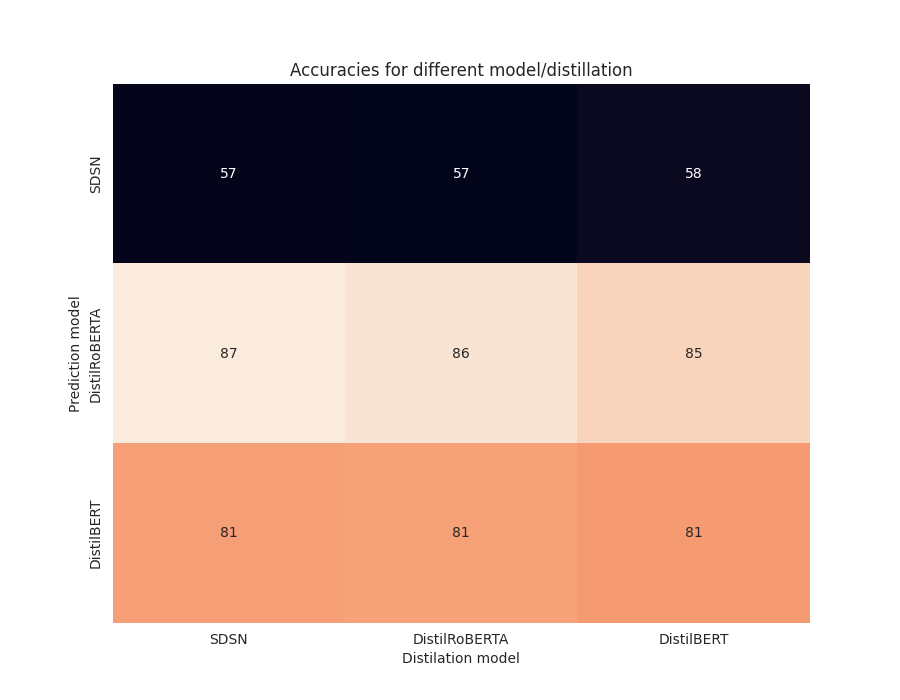

In [ ]:
# Plot
_, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(cross_results_, annot=True, cbar=False,
            xticklabels=['SDSN', 'DistilRoBERTA', 'DistilBERT'], yticklabels=['SDSN', 'DistilRoBERTA', 'DistilBERT'])
ax.set(title='Accuracies for different model/distillation',
       xlabel='Distilation model', ylabel='Prediction model');